# The Bookies project - Introduction

The following notebook analysis bookmakers football matches betting accuracy and trains the model to predict football results with the use of classifiers. The files were web-scraped from the publicly available data at: https://www.football-data.co.uk/englandm.php'

The motivation for such topic is the fact that we are football fans and we usually like to place our bets on various matches. Therefore, a football match result prediction model would be quite handy to support our decision before placing a bet. 

This is the final version of the notebook, that is an attachment to the consice report that includes the stages of the project, final results and references.

The first step is to install all the dependencies.

In [73]:
# Installing pip packages in the current Jupyter kernel.
import sys
!{sys.executable} -m pip install -r requirements.txt

^C


ERROR: Could not find a version that satisfies the requirement sklearn==1.1.3 (from versions: 0.0, 0.0.post1, 0.0.post2, 0.0.post4, 0.0.post5)
ERROR: No matching distribution found for sklearn==1.1.3

[notice] A new release of pip is available: 23.0 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


  Using cached h2o-3.30.0.4.tar.gz (128.3 MB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached keras-2.9.0-py2.py3-none-any.whl (1.6 MB)
  Using cached matplotlib-3.5.3-cp38-cp38-win_amd64.whl (7.2 MB)
  Using cached numpy-1.21.5-cp38-cp38-win_amd64.whl (14.0 MB)
  Using cached pandas-1.5.1-cp38-cp38-win_amd64.whl (11.0 MB)
  Using cached requests-2.28.1-py3-none-any.whl (62 kB)
  Using cached seaborn-0.12.1-py3-none-any.whl (288 kB)


In [ ]:
# setting jupyter notebook cell to display multiple results.
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

# display module used for displaying DataFrames and objects returned by invoking multiple functions and classes.
# reduces the complexity of coding to return comprehensible representation of the results.
from IPython.display import display
from IPython.display import display_html 

In [ ]:
# importing pandas library for data analysis and manipulation.
import pandas as pd

# importing numpy library for working with arrays.
import numpy as np

# importing matplotlib for data visualization.
import matplotlib.pyplot as plt 

# importing seaborn library - a high-level interface visualizations library.
import seaborn as sns

# importing a python library for the exploratory visualization of missing data.
import missingno as msno

# importing types for namespace assignment for attributes of a class.
import types

# timeout for functions that process longer than the indicated threshold.
import time

# importing SMOTE for data balancing, in case of undersampled data.
from imblearn.over_sampling import SMOTE

# importing feature selection algorithm.
from mlxtend.feature_selection import SequentialFeatureSelector

# importing libraries for hyperparameter tuning.
import optuna
from functools import partial

# importing library for model explanation (XAI).
import dalex as dx

# importing libraries necessary for web-scraping.
import requests as rq
from bs4 import BeautifulSoup as bs
import re
import os

# searches the path name for files that match the specified pattern.
import glob

In [ ]:
# importing classifiers and other data manipulation methods from machine learning library.
from sklearn.preprocessing import StandardScaler as SC, Normalizer as norm, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.tree import DecisionTreeClassifier as dtc
from sklearn.ensemble import RandomForestClassifier as rfc, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier as knc
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, log_loss, confusion_matrix, ConfusionMatrixDisplay as cmd

In [ ]:
# importing XGB classifier.
from xgboost import XGBClassifier

# importing tensorflow with all its methods, such as models and layers methods to create an ANN.
import tensorflow as tf

# importing the H2O and autoML library, that contains modelling algorithms.
import h2o
from h2o.automl import H2OAutoML

In [ ]:
# adjusting size of graphs and other visuals.
plt.rcParams['figure.figsize'] = [10, 5]
pd.set_option('display.max_columns', None)

# filtering out warning messages.
import warnings
warnings.filterwarnings('ignore')

# Data import

The following section encompasses the web-scraping process, where the Premier League data will be parsed from the website and downloaded into a folder, to be later used for the analysis.

In [ ]:
# requesting website content.
url = 'https://www.football-data.co.uk/englandm.php'
response = rq.get(url)
response.raise_for_status()

In [ ]:
# creating BeautifulSoup object in order to parse the website.
soup = bs(response.content, 'html.parser')

# creating a regular expression pattern for the phrase: Premier League.
# \s? space is optional, re.IGNORECASE letter case is not important.
pattern = re.compile(r'Premier\s?League', re.IGNORECASE) 

# parsing the website and looking for links that match the pattern.
premier_league_links = soup.find_all('a', text=pattern)

# this block of code returns all the links that match the pattern or returns a text that none of the links matched the passed pattern.
if premier_league_links:
    total_links = len(premier_league_links)
    print(f"{total_links} Links were found that match the pattern and contain the phrase Premier League. The following links were found:")
    for link in premier_league_links:
        print(link)
else:
    print("No links were found that match the phrase Premier League.")

In [ ]:
# the first Premier League season is dated to 1993/1994, therefore, we check whether the number of files found matches the date.
print("First season:", 2023-total_links)

In [ ]:
# the following code searches all the sections that contain links to the CSV files associated with Premier League, season-wise.
sections = soup.find_all(text=re.compile(r'Season \d{4}/\d{4}'))

# this block of code creates tuples (season,link).
season_links = []
for section in sections:
    if isinstance(section, str):
        season = re.search(r'\d{4}/\d{4}', section).group(0)
        csv_links = section.find_all_next('a', href=lambda href: href and href.endswith('.csv'))
        csv_links = [link for link in csv_links if 'Premier League' in link.text]
        if csv_links:
            csv_url = 'https://www.football-data.co.uk/' + csv_links[0]['href']
            season_links.append((season, csv_url))

# This code displays prints out the list.
for season, link in season_links:
    print(f"Season: {season}, Link: {link}")

In [ ]:
# this function will download the files with the selected range of seasons. The range is quite useful, since the data might differ between seasons.
def dl_seasons(start_year, end_year):
    folder_name = "The bookies data set"
    os.makedirs(folder_name, exist_ok=True)
    for season, link in season_links:
        year = int(season.split('/')[0])
        if start_year <= year <= end_year:
            csv_url = link
            filename = f'{folder_name}/FPL {season.replace("/", "-")}.csv'
            response = rq.get(csv_url)
            response.raise_for_status()
            with open(filename, 'wb') as file:
                file.write(response.content)
            print(f"Pobrano plik {filename}")

In [ ]:
# the downloaded CSV files are only in the range 2000 - 2023, since recording of bookmakers data started from the year 2000.
dl_seasons(2000, 2023)

# Loading the data

After the data has been downloaded, it has to be loaded into RAM to be cleaned and processed for further analysis.

In [ ]:
# Set the path to the folder containing the CSV files.
path = './The bookies data set/'

# Get a list of all CSV files in the folder.
csv_files = glob.glob(path + 'FPL*.csv')

# Create an empty list to hold the DataFrames.
dfs = []

# Loop through each CSV file and read it into a DataFrame.
for csv_file in csv_files:
    try:
        df = pd.read_csv(csv_file)
        dfs.append(df)
    except:
        df = pd.read_csv(csv_file, on_bad_lines='skip', encoding= 'unicode_escape')
        dfs.append(df)
        
# Concatenate all DataFrames into a single DataFrame.
df = pd.concat(dfs, ignore_index=True)

# Exploratory Data analysis

In this stage, the data will be cleaned, explored and feature engineering will be performed.

# Data cleaning

<Axes: >

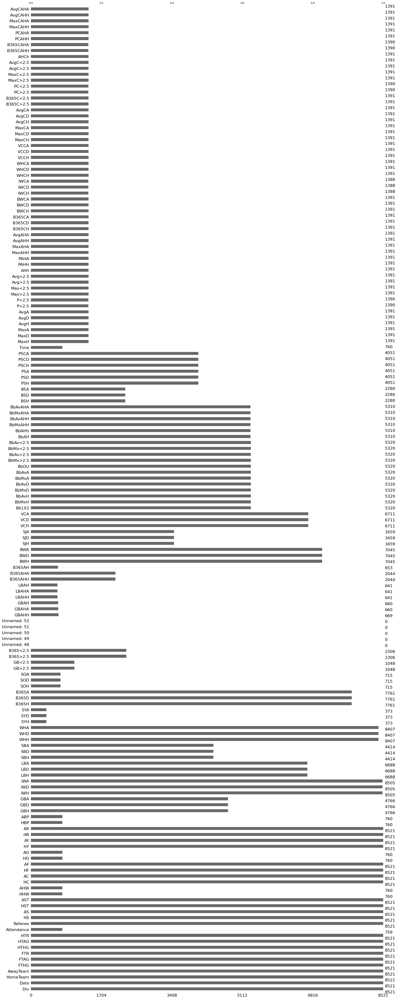

In [ ]:
# display how many values are missing per column.
msno.bar(df)

In [ ]:
# the last 1380 records belong to the most recent seasons, where not only full data is available, but also the prediction conducted on such data will definitely be up-to-date.
df = df.tail(1380) 

In [ ]:
 # most of these columns either describe events during the match, which isn't useful for future match prediction, since the model has to predict based on previous data, as well as other descriptors that not related to the final score. 
columns_to_drop = ['Div', 'Time', 'FTHG', 'FTAG',  'HTHG', 'HTAG', 'HTR','Attendance', 'Referee', 'HS', 'AS', 'HST', 'AST', 'HHW', 'AHW', 'HC', 'AC', 'HF', 'AF', 'HO', 'AO', 'HY', 'AY', 'HR', 'AR', 'HBP', 'ABP']
df = df.drop(columns_to_drop, axis=1) 

In [ ]:
# a threshold that defines the maximum number of empty data in the columns.
threshold = 1000 # -> 50%
# if a column contains more empty records than the threshold, these columns will be dropped.
half_empty_cols = df.columns[df.isnull().sum() >= threshold]

df = df.drop(half_empty_cols, axis=1)
df = df.reset_index(drop=True)

<Axes: >

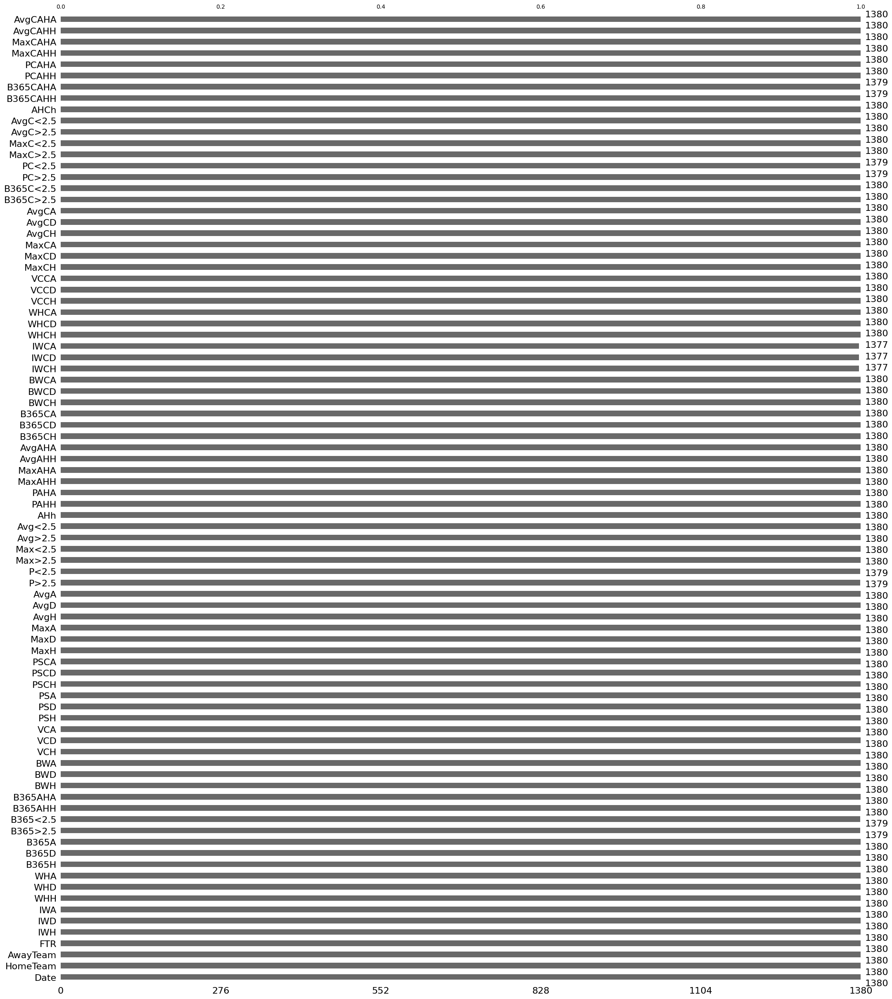

In [ ]:
# display how many values are missing per column, after initial cleaning.
msno.bar(df)

As commented above, some of the variables record half-time results, which isn't useful for model training, since we won't be able to input this date in real-time during a match. Only data before the match can be used for prediction, such as the bookmakers rating for the upcoming matches and other engineered features that are based upon past data. 

The division, red, yellow cards, attendence and referee are dropped to reduce the dimensionality of the data, while their input to the prediction is minimal. The bookmakers rating and team performance has greater impact on predicting the outcome of a match.

Lastly, any variables with empty records greater than the threshold are also dropped, since these could alter the prediction capacity of the model. Imputation would provided biased models.

# Data exploration

In [ ]:
# checking how many columns we have left.
len(df.columns)

# displaying the columns.
df.columns

86

Index(['Date', 'HomeTeam', 'AwayTeam', 'FTR', 'IWH', 'IWD', 'IWA', 'WHH',
       'WHD', 'WHA', 'B365H', 'B365D', 'B365A', 'B365>2.5', 'B365<2.5',
       'B365AHH', 'B365AHA', 'BWH', 'BWD', 'BWA', 'VCH', 'VCD', 'VCA', 'PSH',
       'PSD', 'PSA', 'PSCH', 'PSCD', 'PSCA', 'MaxH', 'MaxD', 'MaxA', 'AvgH',
       'AvgD', 'AvgA', 'P>2.5', 'P<2.5', 'Max>2.5', 'Max<2.5', 'Avg>2.5',
       'Avg<2.5', 'AHh', 'PAHH', 'PAHA', 'MaxAHH', 'MaxAHA', 'AvgAHH',
       'AvgAHA', 'B365CH', 'B365CD', 'B365CA', 'BWCH', 'BWCD', 'BWCA', 'IWCH',
       'IWCD', 'IWCA', 'WHCH', 'WHCD', 'WHCA', 'VCCH', 'VCCD', 'VCCA', 'MaxCH',
       'MaxCD', 'MaxCA', 'AvgCH', 'AvgCD', 'AvgCA', 'B365C>2.5', 'B365C<2.5',
       'PC>2.5', 'PC<2.5', 'MaxC>2.5', 'MaxC<2.5', 'AvgC>2.5', 'AvgC<2.5',
       'AHCh', 'B365CAHH', 'B365CAHA', 'PCAHH', 'PCAHA', 'MaxCAHH', 'MaxCAHA',
       'AvgCAHH', 'AvgCAHA'],
      dtype='object')

In [ ]:
# converting the data type of date from object to datetime.
df['Date'] = pd.to_datetime(df['Date'],dayfirst=True)

In [ ]:
# checking how many unique data we have in HomeTeam and AwayTeam.
df['HomeTeam'].nunique()

df['AwayTeam'].nunique()

25

25

<Axes: >

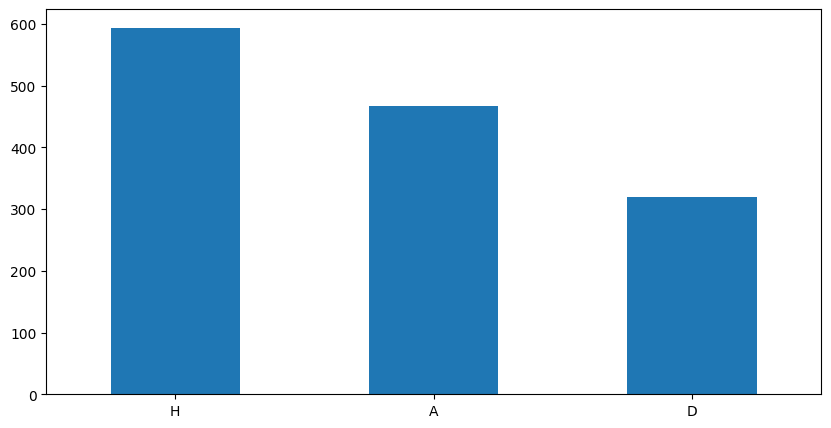

In [ ]:
# value count of each class in the Full Time Result column. There are three classes: H for Home, D for Draw and A for Away.
df['FTR'].value_counts().plot.bar(rot=0)

In [ ]:
# this code will return the median value of matches for a team in the HomeTeam column.
int(df['HomeTeam'].value_counts().median())

#the following block of code will return a list of each team and the number of matches that they have played during the analysed period.
df_home = pd.DataFrame(df['HomeTeam'].value_counts())
df_away = pd.DataFrame(df['AwayTeam'].value_counts())

df_home_styler = df_home.style.set_table_attributes("style='display:inline'").set_caption('')
df_away_styler = df_away.style.set_table_attributes("style='display:inline'").set_caption('')
display_html(df_home_styler._repr_html_()+df_away_styler._repr_html_(), raw=True)

68

,HomeTeam
Aston Villa,70
Wolves,70
Everton,70
Man City,70
Arsenal,69
Crystal Palace,69
Tottenham,69
Brighton,69
Liverpool,69
Chelsea,69


<Figure size 2800x1800 with 0 Axes>

<Axes: >

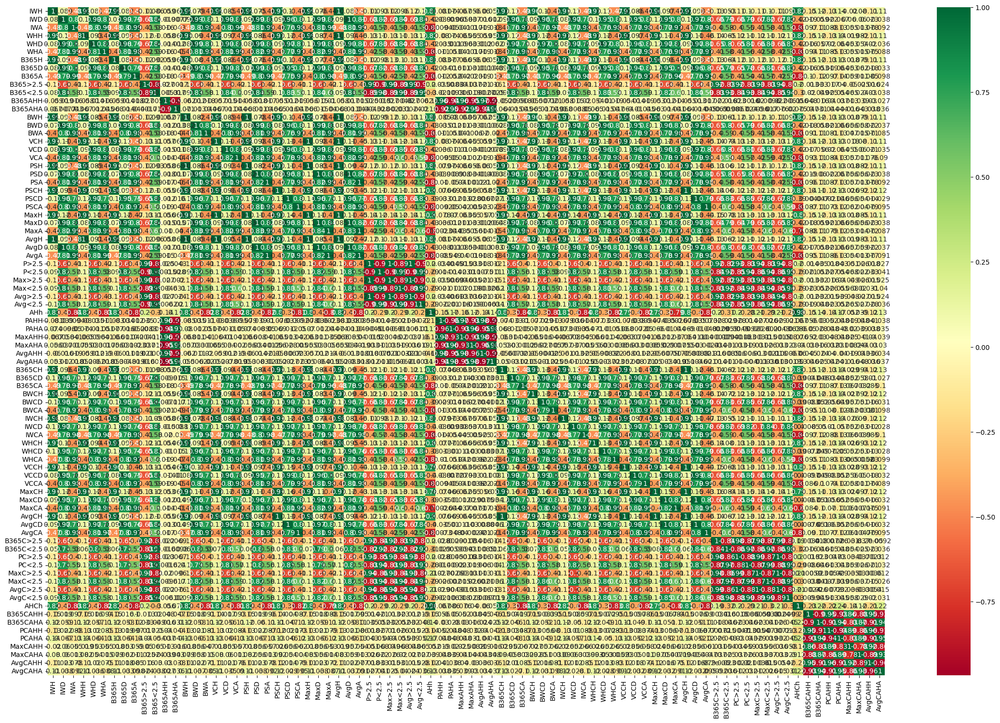

In [ ]:
# correlation matrix of our variables.
plt.figure(figsize=(28,18))
mod_df_corr = df.corr(numeric_only=True)
sns.heatmap(mod_df_corr, annot=True, cmap='RdYlGn')
plt.show()

In [ ]:
# statistical description of our data.
df.describe()

,IWH,IWD,IWA,WHH,WHD,WHA,B365H,B365D,B365A,B365>2.5,B365<2.5,B365AHH,B365AHA,BWH,BWD,BWA,VCH,VCD,VCA,PSH,PSD,PSA,PSCH,PSCD,PSCA,MaxH,MaxD,MaxA,AvgH,AvgD,AvgA,P>2.5,P<2.5,Max>2.5,Max<2.5,Avg>2.5,Avg<2.5,AHh,PAHH,PAHA,MaxAHH,MaxAHA,AvgAHH,AvgAHA,B365CH,B365CD,B365CA,BWCH,BWCD,BWCA,IWCH,IWCD,IWCA,WHCH,WHCD,WHCA,VCCH,VCCD,VCCA,MaxCH,MaxCD,MaxCA,AvgCH,AvgCD,AvgCA,B365C>2.5,B365C<2.5,PC>2.5,PC<2.5,MaxC>2.5,MaxC<2.5,AvgC>2.5,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA
count,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1379.000000,1379.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.00000,1380.000000,1380.000000,1380.000000,1379.000000,1379.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1377.000000,1377.000000,1377.000000,1380.00000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1379.000000,1379.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1379.000000,1379.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000,1380.000000
mean,2.964471,4.124312,4.407833,3.012754,4.087594,4.653623,2.981848,4.206203,4.503058,1.835547,2.086171,1.954486,1.951457,2.966174,4.176355,4.501848,3.045239,4.117275,4.737312,3.079674,4.294123,4.786710,3.104768,4.306442,4.724449,3.212551,4.455210,5.09450,3.018130,4.212681,4.608464,1.875076,2.138434,1.908725,2.186725,1.837761,2.093275,-0.251449,1.969348,1.957239,1.996058,1.990587,1.942428,1.936457,2.984630,4.200732,4.434870,2.985333,4.174630,4.452812,2.985410,4.072004,4.331227,3.04708,4.099826,4.610572,3.084123,4.164551,4.662406,3.313536,4.506884,5.131703,3.047051,4.221362,4.563746,1.849275,2.084072,1.890283,2.140522,1.934196,2.233572,1.850355,2.097971,-0.234058,1.944598,1.960297,1.960080,1.969964,2.014246,2.030645,1.934630,1.949522
std,2.115214,1.273663,3.876413,2.255780,1.273488,4.439321,2.178523,1.366987,3.975674,0.268277,0.409259,0.097386,0.095236,2.145692,1.321736,4.192172,2.372093,1.346070,4.659028,2.297797,1.417966,4.622589,2.380139,1.546401,4.536227,2.567121,1.547798,5.36798,2.225983,1.351062,4.303579,0.283103,0.420103,0.285182,0.436393,0.265256,0.397727,0.911363,0.105194,0.095184,0.102179,0.094105,0.096525,0.089739,2.242284,1.411417,3.895006,2.222751,1.417591,4.088223,2.154757,1.225154,3.697658,2.34175,1.382321,4.353847,2.456607,1.483268,4.457007,2.788444,1.757029,5.403208,2.303792,1.455376,4.221879,0.295704,0.455625,0.304769,0.469359,0.310979,0.501898,0.285969,0.439222,0.920084,0.110343,0.100006,0.114967,0.103980,0.116978,0.108916,0.103931,0.095358
min,1.070000,2.700000,1.150000,1.050000,2.900000,1.140000,1.060000,2.800000,1.140000,1.220000,1.440000,1.700000,1.320000,1.050000,2.950000,1.160000,1.050000,2.900000,1.130000,1.070000,3.000000,1.140000,1.040000,2.900000,1.090000,1.090000,3.100000,1.18000,1.070000,2.970000,1.150000,1.200000,1.470000,1.220000,1.510000,1.210000,1.470000,-3.000000,1.760000,1.330000,1.790000,1.350000,1.760000,1.320000,1.030000,2.800000,1.080000,1.020000,2.850000,1.080000,1.070000,2.600000,1.120000,1.02000,2.800000,1.070000,1.030000,2.880000,1.100000,1.070000,2.970000,1.120000,1.040000,2.860000,1.090000,0.000000,0.000000,1.120000,1.410000,1.160000,1.440000,1.130000,1.390000,-3.750000,1.650000,1.270000,1.660000,1.300000,1.800000,1.300000,1.700000,1.280000
25%,1.670000,3.400000,2.150000,1.650000,3.400000,2.150000,1.650000,3.400000,2.137500,1.660000,1.800000,1.880000,1.880000,1.650000,3.400000,2.150000,1.650000,3.400000,2.150000,1.690000,3.490000,2.200000,1.690000,3.460000,2.207500,1.720000,3.597500,2.25000,1.677500,3.440000,2.177500,1.67000

Some of the teams had much fewer matches, thus they could be treated as outliers. However, such teams do happen in reality and bookmakers bet on these, because they provide easy profit. 

In terms of the correlation matrix, the bookmakers ratings are highly correlated. However, becasue the goal is to indicate which bookmaker has the upper bound in terms of betting and as the model could train on the differences between the ratings, these variables are kept for model training.

# Feature engineering

A new column is created where, the bookmakers' bets are recorded. 

The bookmakers' ratings are basically odds, where the lowest value representes the highest probability of that outcome predicted by the bookmakers.

For example, if the lowest rating is given for away, it means that in that given match, the bookmakers predict that the away team will win.

In [ ]:
bookies = {'Bet365': ['B365H', 'B365D', 'B365A'],
           'Bet&Win': ['BWH', 'BWD', 'BWA'],
           'Interwetten': ['IWH', 'IWD', 'IWA'],
           'Pinnacle': ['PSH', 'PSD', 'PSA'],
           'VC Bet': ['VCH', 'VCD', 'VCA'],
           'William Hill': ['WHH', 'WHD', 'WHA']}

for bookie, cols in bookies.items():
    df[f"{bookie}_bet"] = np.where(df[cols].min(axis=1) == df[cols[0]], "H",
                                   np.where(df[cols].min(axis=1) == df[cols[1]], "D", "A"))

In [ ]:
# displaying the DataFrame with the new column.
df

,Date,HomeTeam,AwayTeam,FTR,IWH,IWD,IWA,WHH,WHD,WHA,B365H,B365D,B365A,B365>2.5,B365<2.5,B365AHH,B365AHA,BWH,BWD,BWA,VCH,VCD,VCA,PSH,PSD,PSA,PSCH,PSCD,PSCA,MaxH,MaxD,MaxA,AvgH,AvgD,AvgA,P>2.5,P<2.5,Max>2.5,Max<2.5,Avg>2.5,Avg<2.5,AHh,PAHH,PAHA,MaxAHH,MaxAHA,AvgAHH,AvgAHA,B365CH,B365CD,B365CA,BWCH,BWCD,BWCA,IWCH,IWCD,IWCA,WHCH,WHCD,WHCA,VCCH,VCCD,VCCA,MaxCH,MaxCD,MaxCA,AvgCH,AvgCD,AvgCA,B365C>2.5,B365C<2.5,PC>2.5,PC<2.5,MaxC>2.5,MaxC<2.5,AvgC>2.5,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA,Bet365_bet,Bet&Win_bet,Interwetten_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet
0,2019-08-17,Aston Villa,Bournemouth,A,2.30,3.45,3.05,2.25,3.50,3.10,2.30,3.40,3.10,1.80,2.00,2.02,1.91,2.25,3.50,3.10,2.38,3.50,3.20,2.32,3.56,3.17,2.30,3.69,3.11,2.42,3.64,3.20,2.33,3.49,3.08,1.81,2.11,1.86,2.11,1.81,2.03,-0.25,2.02,1.91,2.03,1.92,2.01,1.88,2.20,3.6,3.10,2.25,3.60,3.10,2.25,3.60,3.05,2.25,3.5,3.10,2.30,3.70,3.13,2.33,3.75,3.22,2.26,3.62,3.12,1.61,2.30,1.64,2.39,1.75,2.39,1.66,2.26,-0.25,2.01,1.92,2.01,1.92,2.01,1.96,1.97,1.92,H,H,H,H,H,H
1,2019-08-17,Brighton,West Ham,D,2.50,3.30,2.85,2.50,3.30,2.88,2.55,3.25,2.87,1.90,1.90,2.07,1.72,2.50,3.30,2.90,2.55,3.40,3.00,2.58,3.38,2.92,2.22,3.60,3.34,2.65,3.42,3.00,2.52,3.33,2.90,1.99,1.93,2.00,1.94,1.95,1.87,-0.25,2.21,1.75,2.21,1.80,2.16,1.75,2.20,3.4,3.30,2.25,3.30,3.40,2.20,3.40,3.30,2.10,3.5,3.50,2.25,3.40,3.50,2.30,3.60,3.74,2.23,3.44,3.34,1.90,1.90,1.95,1.97,2.00,2.12,1.92,1.91,-0.25,1.91,2.02,1.93,2.00,1.96,2.15,1.91,1.98,H,H,H,H,H,H
2,2019-08-17,Everton,Watford,H,1.70,3.90,4.65,1.73,3.80,4.80,1.72,3.80,4.75,1.72,2.10,1.97,1.96,1.67,4.00,5.00,1.73,4.00,5.20,1.76,3.95,4.87,1.85,3.66,4.64,1.80,4.05,5.20,1.73,3.90,4.86,1.86,2.06,1.86,2.20,1.79,2.05,-0.75,2.00,1.93,2.00,1.97,1.94,1.95,1.80,3.6,4.50,1.83,3.75,4.50,1.83,3.65,4.35,1.78,3.7,4.50,1.85,3.75,4.60,1.89,3.88,4.84,1.83,3.69,4.56,1.72,2.10,1.81,2.12,1.82,2.14,1.78,2.07,-0.75,2.11,1.82,2.12,1.81,2.16,1.87,2.07,1.83,H,H,H,H,H,H
3,2019-08-17,Norwich,Newcastle,H,2.20,3.35,3.35,2.15,3.40,3.40,2.25,3.30,3.30,1.90,1.90,1.93,2.00,2.25,3.30,3.30,2.25,3.40,3.50,2.25,3.42,3.44,2.14,3.57,3.58,2.30,3.50,3.50,2.23,3.38,3.38,1.98,1.93,2.05,1.93,1.95,1.88,-0.25,1.94,1.99,1.95,2.01,1.92,1.97,2.10,3.4,3.50,2.15,3.40,3.50,2.15,3.35,3.50,2.10,3.4,3.60,2.20,3.40,3.70,2.25,3.60,3.86,2.15,3.44,3.55,1.90,1.90,1.96,1.96,2.00,2.10,1.93,1.90,-0.25,1.84,2.09,1.85,2.08,1.88,2.15,1.84,2.05,H,H,H,H,H,H
4,2019-08-17,Southampton,Liverpool,A,7.50,4.80,1.40,7.00,4.60,1.44,6.50,4.75,1.44,1.66,2.20,1.86,2.07,6.25,4.75,1.48,7.50,4.80,1.45,7.04,4.72,1.48,6.43,4.57,1.53,7.50,4.90,1.52,6.77,4.67,1.47,1.65,2.37,1.70,2.38,1.64,2.28,1.25,1.85,2.08,1.87,2.09,1.84,2.04,6.50,4.5,1.45,6.50,4.50,1.50,7.00,4.50,1.45,7.00,4.4,1.47,7.00,4.60,1.50,7.40,4.85,1.55,6.48,4.56,1.50,1.61,2.30,1.66,2.36,1.68,2.44,1.63,2.32,1.00,2.07,1.86,2.05,1.88,2.21,1.90,2.08,1.81,A,A,A,A,A,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,2023-03-04,Wolves,Tottenham,H,3.25,3.30,2.25,3.30,3.30,2.20,3.30,3.40,2.20,2.10,1.73,1.95,1.95,3.25,3.30,2.20,3.20,3.13,2.20,3.32,3.41,2.31,3.35,3.34,2.37,3.41,3.48,2.34,3.31,3.36,2.27,2.14,1.76,2.17,1.81,2.09,1.76,0.25,1.93,1.98,1.98,2.00,1.92,1.94,3.20,3.3,2.30,3.10,3.10,2.37,3.15,3.20,2.35,3.20,3.2,2.30,3.13,3.00,2.30,3.50,3.40,2.44,3.26,3.25,2.35,2.20,1.67,2.28,1.69,2.38,1.73,2.25,1.67,0.25,1.90,2.03,1.90,2.02,1.91,2.08,1.87,1.99,A,A,A,A,A,A
1376,2023-03-04,Southampton,Leicester,H,2.65,3.10,2.60,2.70,3.25,2.60,2.75,3.30,2.60,2.06,1.84,2.00,1.90,2.70,3.30,2.60,2.70,3.13,2.55,2.85,3.30,2.67,2.98,3.36,2.57,2.89,3.50,2.73,2.77,3.31,2.64,2.09,1.82,2.12,1.85,2.03,1.81,0.00,2.02,1.89,2.04,1.93,1.98,1.88,2.75,3.3,2.55,2.80,3.20,2.5

The following block of code will return the count of wrong guesses by each bookmaker.

<BarContainer object of 6 artists>

Text(0.5, 0, 'Bookmakers')

Text(0, 0.5, 'Matches')

Text(0.5, 1.0, 'Count of wrong guesses by each bookmaker')

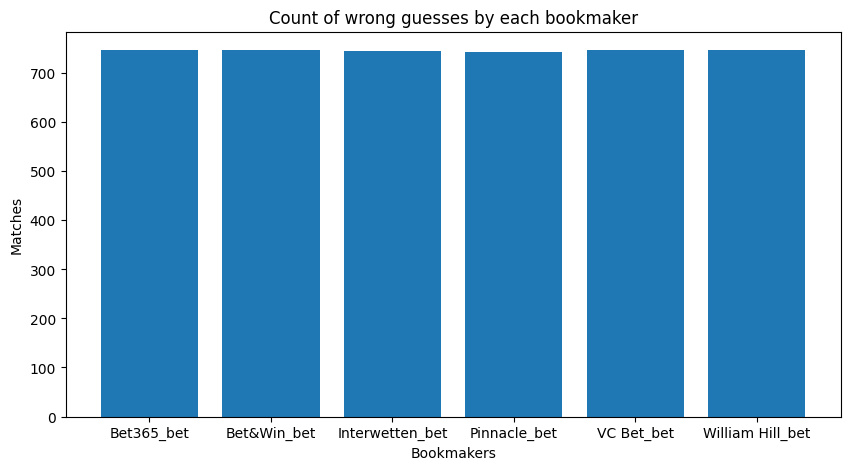

In [ ]:
# create a list of column names to compare with FTR.
columns = ['Bet365_bet','Bet&Win_bet','Interwetten_bet','Pinnacle_bet','VC Bet_bet','William Hill_bet']
# create an empty list to store the frequencies of matches and mismatches.
freqs = []

# loop through each column and count the matches and mismatches with FTR.
for col in columns:
  # compare FTR with the current column.
  comp = df["FTR"].eq(df[col])
  # count the number of True (match) and False (mismatch) values. Select 0 for False, 1 for True.
  counts = comp.value_counts()[0]
  # convert the counts to a list and append it to the freqs list.
  freqs.append(counts)

# plot a bar chart with freqs list.
plt.bar(columns, freqs)
# add labels and title.
plt.xlabel("Bookmakers")
plt.ylabel("Matches")
plt.title("Count of wrong guesses by each bookmaker")
# show the plot.
plt.show()

In [ ]:
# count of wrong guesses for each bookmaker.
print(columns, '\n',freqs)

['Bet365_bet', 'Bet&Win_bet', 'Interwetten_bet', 'Pinnacle_bet', 'VC Bet_bet', 'William Hill_bet'] 
 [746, 747, 745, 742, 747, 746]


The following block of code will return the count of correct guesses by each bookmaker.

<BarContainer object of 6 artists>

Text(0.5, 0, 'Bookmakers')

Text(0, 0.5, 'Matches')

Text(0.5, 1.0, 'Count of correct guesses by each bookmaker')

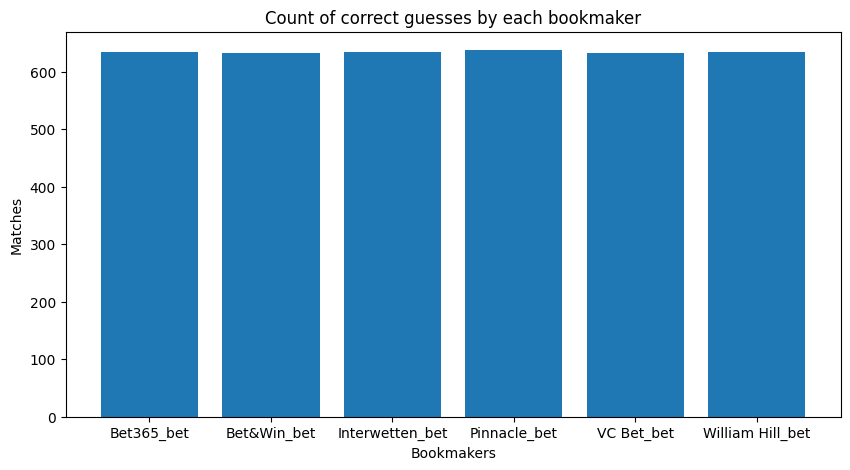

In [ ]:
# create a list of column names to compare with FTR.
columns = ['Bet365_bet','Bet&Win_bet','Interwetten_bet','Pinnacle_bet','VC Bet_bet','William Hill_bet']
# create an empty list to store the frequencies of matches and mismatches.
freqs = []

# loop through each column and count the matches and mismatches with FTR.
for col in columns:
  # compare FTR with the current column.
  comp = df["FTR"].eq(df[col])
  # count the number of True (match) and False (mismatch) values. Select 0 for False, 1 for True.
  counts = comp.value_counts()[1]
  # convert the counts to a list and append it to the freqs list.
  freqs.append(counts)
    
# plot a bar chart with freqs list.
plt.bar(columns, freqs)
# add labels and title.
plt.xlabel("Bookmakers")
plt.ylabel("Matches")
plt.title("Count of correct guesses by each bookmaker")
# show the plot.
plt.show()

In [ ]:
# count of correct guesses for each bookmaker.
print(columns, '\n',freqs)

['Bet365_bet', 'Bet&Win_bet', 'Interwetten_bet', 'Pinnacle_bet', 'VC Bet_bet', 'William Hill_bet'] 
 [634, 633, 635, 638, 633, 634]


In [ ]:
# moving FTR column to the end.
col = df.pop('FTR')
df.insert(len(df.columns), col.name, col)

#displaying DataFrame.
df

,Date,HomeTeam,AwayTeam,IWH,IWD,IWA,WHH,WHD,WHA,B365H,B365D,B365A,B365>2.5,B365<2.5,B365AHH,B365AHA,BWH,BWD,BWA,VCH,VCD,VCA,PSH,PSD,PSA,PSCH,PSCD,PSCA,MaxH,MaxD,MaxA,AvgH,AvgD,AvgA,P>2.5,P<2.5,Max>2.5,Max<2.5,Avg>2.5,Avg<2.5,AHh,PAHH,PAHA,MaxAHH,MaxAHA,AvgAHH,AvgAHA,B365CH,B365CD,B365CA,BWCH,BWCD,BWCA,IWCH,IWCD,IWCA,WHCH,WHCD,WHCA,VCCH,VCCD,VCCA,MaxCH,MaxCD,MaxCA,AvgCH,AvgCD,AvgCA,B365C>2.5,B365C<2.5,PC>2.5,PC<2.5,MaxC>2.5,MaxC<2.5,AvgC>2.5,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA,Bet365_bet,Bet&Win_bet,Interwetten_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet,FTR
0,2019-08-17,Aston Villa,Bournemouth,2.30,3.45,3.05,2.25,3.50,3.10,2.30,3.40,3.10,1.80,2.00,2.02,1.91,2.25,3.50,3.10,2.38,3.50,3.20,2.32,3.56,3.17,2.30,3.69,3.11,2.42,3.64,3.20,2.33,3.49,3.08,1.81,2.11,1.86,2.11,1.81,2.03,-0.25,2.02,1.91,2.03,1.92,2.01,1.88,2.20,3.6,3.10,2.25,3.60,3.10,2.25,3.60,3.05,2.25,3.5,3.10,2.30,3.70,3.13,2.33,3.75,3.22,2.26,3.62,3.12,1.61,2.30,1.64,2.39,1.75,2.39,1.66,2.26,-0.25,2.01,1.92,2.01,1.92,2.01,1.96,1.97,1.92,H,H,H,H,H,H,A
1,2019-08-17,Brighton,West Ham,2.50,3.30,2.85,2.50,3.30,2.88,2.55,3.25,2.87,1.90,1.90,2.07,1.72,2.50,3.30,2.90,2.55,3.40,3.00,2.58,3.38,2.92,2.22,3.60,3.34,2.65,3.42,3.00,2.52,3.33,2.90,1.99,1.93,2.00,1.94,1.95,1.87,-0.25,2.21,1.75,2.21,1.80,2.16,1.75,2.20,3.4,3.30,2.25,3.30,3.40,2.20,3.40,3.30,2.10,3.5,3.50,2.25,3.40,3.50,2.30,3.60,3.74,2.23,3.44,3.34,1.90,1.90,1.95,1.97,2.00,2.12,1.92,1.91,-0.25,1.91,2.02,1.93,2.00,1.96,2.15,1.91,1.98,H,H,H,H,H,H,D
2,2019-08-17,Everton,Watford,1.70,3.90,4.65,1.73,3.80,4.80,1.72,3.80,4.75,1.72,2.10,1.97,1.96,1.67,4.00,5.00,1.73,4.00,5.20,1.76,3.95,4.87,1.85,3.66,4.64,1.80,4.05,5.20,1.73,3.90,4.86,1.86,2.06,1.86,2.20,1.79,2.05,-0.75,2.00,1.93,2.00,1.97,1.94,1.95,1.80,3.6,4.50,1.83,3.75,4.50,1.83,3.65,4.35,1.78,3.7,4.50,1.85,3.75,4.60,1.89,3.88,4.84,1.83,3.69,4.56,1.72,2.10,1.81,2.12,1.82,2.14,1.78,2.07,-0.75,2.11,1.82,2.12,1.81,2.16,1.87,2.07,1.83,H,H,H,H,H,H,H
3,2019-08-17,Norwich,Newcastle,2.20,3.35,3.35,2.15,3.40,3.40,2.25,3.30,3.30,1.90,1.90,1.93,2.00,2.25,3.30,3.30,2.25,3.40,3.50,2.25,3.42,3.44,2.14,3.57,3.58,2.30,3.50,3.50,2.23,3.38,3.38,1.98,1.93,2.05,1.93,1.95,1.88,-0.25,1.94,1.99,1.95,2.01,1.92,1.97,2.10,3.4,3.50,2.15,3.40,3.50,2.15,3.35,3.50,2.10,3.4,3.60,2.20,3.40,3.70,2.25,3.60,3.86,2.15,3.44,3.55,1.90,1.90,1.96,1.96,2.00,2.10,1.93,1.90,-0.25,1.84,2.09,1.85,2.08,1.88,2.15,1.84,2.05,H,H,H,H,H,H,H
4,2019-08-17,Southampton,Liverpool,7.50,4.80,1.40,7.00,4.60,1.44,6.50,4.75,1.44,1.66,2.20,1.86,2.07,6.25,4.75,1.48,7.50,4.80,1.45,7.04,4.72,1.48,6.43,4.57,1.53,7.50,4.90,1.52,6.77,4.67,1.47,1.65,2.37,1.70,2.38,1.64,2.28,1.25,1.85,2.08,1.87,2.09,1.84,2.04,6.50,4.5,1.45,6.50,4.50,1.50,7.00,4.50,1.45,7.00,4.4,1.47,7.00,4.60,1.50,7.40,4.85,1.55,6.48,4.56,1.50,1.61,2.30,1.66,2.36,1.68,2.44,1.63,2.32,1.00,2.07,1.86,2.05,1.88,2.21,1.90,2.08,1.81,A,A,A,A,A,A,A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,2023-03-04,Wolves,Tottenham,3.25,3.30,2.25,3.30,3.30,2.20,3.30,3.40,2.20,2.10,1.73,1.95,1.95,3.25,3.30,2.20,3.20,3.13,2.20,3.32,3.41,2.31,3.35,3.34,2.37,3.41,3.48,2.34,3.31,3.36,2.27,2.14,1.76,2.17,1.81,2.09,1.76,0.25,1.93,1.98,1.98,2.00,1.92,1.94,3.20,3.3,2.30,3.10,3.10,2.37,3.15,3.20,2.35,3.20,3.2,2.30,3.13,3.00,2.30,3.50,3.40,2.44,3.26,3.25,2.35,2.20,1.67,2.28,1.69,2.38,1.73,2.25,1.67,0.25,1.90,2.03,1.90,2.02,1.91,2.08,1.87,1.99,A,A,A,A,A,A,H
1376,2023-03-04,Southampton,Leicester,2.65,3.10,2.60,2.70,3.25,2.60,2.75,3.30,2.60,2.06,1.84,2.00,1.90,2.70,3.30,2.60,2.70,3.13,2.55,2.85,3.30,2.67,2.98,3.36,2.57,2.89,3.50,2.73,2.77,3.31,2.64,2.09,1.82,2.12,1.85,2.03,1.81,0.00,2.02,1.89,2.04,1.93,1.98,1.88,2.75,3.3,2.55,2.80,3.20,2.55,

In [ ]:
# adding new features to the DataFrame. But first, a deep copy is made.
df_new = df.copy()

df_new['Date'] = pd.to_datetime(df_new['Date'])
df_new['Quarter'] = df_new['Date'].dt.quarter

# displaying new DataFrame.
df_new

,Date,HomeTeam,AwayTeam,IWH,IWD,IWA,WHH,WHD,WHA,B365H,B365D,B365A,B365>2.5,B365<2.5,B365AHH,B365AHA,BWH,BWD,BWA,VCH,VCD,VCA,PSH,PSD,PSA,PSCH,PSCD,PSCA,MaxH,MaxD,MaxA,AvgH,AvgD,AvgA,P>2.5,P<2.5,Max>2.5,Max<2.5,Avg>2.5,Avg<2.5,AHh,PAHH,PAHA,MaxAHH,MaxAHA,AvgAHH,AvgAHA,B365CH,B365CD,B365CA,BWCH,BWCD,BWCA,IWCH,IWCD,IWCA,WHCH,WHCD,WHCA,VCCH,VCCD,VCCA,MaxCH,MaxCD,MaxCA,AvgCH,AvgCD,AvgCA,B365C>2.5,B365C<2.5,PC>2.5,PC<2.5,MaxC>2.5,MaxC<2.5,AvgC>2.5,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA,Bet365_bet,Bet&Win_bet,Interwetten_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet,FTR,Quarter
0,2019-08-17,Aston Villa,Bournemouth,2.30,3.45,3.05,2.25,3.50,3.10,2.30,3.40,3.10,1.80,2.00,2.02,1.91,2.25,3.50,3.10,2.38,3.50,3.20,2.32,3.56,3.17,2.30,3.69,3.11,2.42,3.64,3.20,2.33,3.49,3.08,1.81,2.11,1.86,2.11,1.81,2.03,-0.25,2.02,1.91,2.03,1.92,2.01,1.88,2.20,3.6,3.10,2.25,3.60,3.10,2.25,3.60,3.05,2.25,3.5,3.10,2.30,3.70,3.13,2.33,3.75,3.22,2.26,3.62,3.12,1.61,2.30,1.64,2.39,1.75,2.39,1.66,2.26,-0.25,2.01,1.92,2.01,1.92,2.01,1.96,1.97,1.92,H,H,H,H,H,H,A,3
1,2019-08-17,Brighton,West Ham,2.50,3.30,2.85,2.50,3.30,2.88,2.55,3.25,2.87,1.90,1.90,2.07,1.72,2.50,3.30,2.90,2.55,3.40,3.00,2.58,3.38,2.92,2.22,3.60,3.34,2.65,3.42,3.00,2.52,3.33,2.90,1.99,1.93,2.00,1.94,1.95,1.87,-0.25,2.21,1.75,2.21,1.80,2.16,1.75,2.20,3.4,3.30,2.25,3.30,3.40,2.20,3.40,3.30,2.10,3.5,3.50,2.25,3.40,3.50,2.30,3.60,3.74,2.23,3.44,3.34,1.90,1.90,1.95,1.97,2.00,2.12,1.92,1.91,-0.25,1.91,2.02,1.93,2.00,1.96,2.15,1.91,1.98,H,H,H,H,H,H,D,3
2,2019-08-17,Everton,Watford,1.70,3.90,4.65,1.73,3.80,4.80,1.72,3.80,4.75,1.72,2.10,1.97,1.96,1.67,4.00,5.00,1.73,4.00,5.20,1.76,3.95,4.87,1.85,3.66,4.64,1.80,4.05,5.20,1.73,3.90,4.86,1.86,2.06,1.86,2.20,1.79,2.05,-0.75,2.00,1.93,2.00,1.97,1.94,1.95,1.80,3.6,4.50,1.83,3.75,4.50,1.83,3.65,4.35,1.78,3.7,4.50,1.85,3.75,4.60,1.89,3.88,4.84,1.83,3.69,4.56,1.72,2.10,1.81,2.12,1.82,2.14,1.78,2.07,-0.75,2.11,1.82,2.12,1.81,2.16,1.87,2.07,1.83,H,H,H,H,H,H,H,3
3,2019-08-17,Norwich,Newcastle,2.20,3.35,3.35,2.15,3.40,3.40,2.25,3.30,3.30,1.90,1.90,1.93,2.00,2.25,3.30,3.30,2.25,3.40,3.50,2.25,3.42,3.44,2.14,3.57,3.58,2.30,3.50,3.50,2.23,3.38,3.38,1.98,1.93,2.05,1.93,1.95,1.88,-0.25,1.94,1.99,1.95,2.01,1.92,1.97,2.10,3.4,3.50,2.15,3.40,3.50,2.15,3.35,3.50,2.10,3.4,3.60,2.20,3.40,3.70,2.25,3.60,3.86,2.15,3.44,3.55,1.90,1.90,1.96,1.96,2.00,2.10,1.93,1.90,-0.25,1.84,2.09,1.85,2.08,1.88,2.15,1.84,2.05,H,H,H,H,H,H,H,3
4,2019-08-17,Southampton,Liverpool,7.50,4.80,1.40,7.00,4.60,1.44,6.50,4.75,1.44,1.66,2.20,1.86,2.07,6.25,4.75,1.48,7.50,4.80,1.45,7.04,4.72,1.48,6.43,4.57,1.53,7.50,4.90,1.52,6.77,4.67,1.47,1.65,2.37,1.70,2.38,1.64,2.28,1.25,1.85,2.08,1.87,2.09,1.84,2.04,6.50,4.5,1.45,6.50,4.50,1.50,7.00,4.50,1.45,7.00,4.4,1.47,7.00,4.60,1.50,7.40,4.85,1.55,6.48,4.56,1.50,1.61,2.30,1.66,2.36,1.68,2.44,1.63,2.32,1.00,2.07,1.86,2.05,1.88,2.21,1.90,2.08,1.81,A,A,A,A,A,A,A,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,2023-03-04,Wolves,Tottenham,3.25,3.30,2.25,3.30,3.30,2.20,3.30,3.40,2.20,2.10,1.73,1.95,1.95,3.25,3.30,2.20,3.20,3.13,2.20,3.32,3.41,2.31,3.35,3.34,2.37,3.41,3.48,2.34,3.31,3.36,2.27,2.14,1.76,2.17,1.81,2.09,1.76,0.25,1.93,1.98,1.98,2.00,1.92,1.94,3.20,3.3,2.30,3.10,3.10,2.37,3.15,3.20,2.35,3.20,3.2,2.30,3.13,3.00,2.30,3.50,3.40,2.44,3.26,3.25,2.35,2.20,1.67,2.28,1.69,2.38,1.73,2.25,1.67,0.25,1.90,2.03,1.90,2.02,1.91,2.08,1.87,1.99,A,A,A,A,A,A,H,1
1376,2023-03-04,Southampton,Leicester,2.65,3.10,2.60,2.70,3.25,2.60,2.75,3.30,2.60,2.06,1.84,2.00,1.90,2.70,3.30,2.60,2.70,3.13,2.55,2.85,3.30,2.67,2.98,3.36,2.57,2.89,3.50,2.73,2.77,3.31,2.64,2.09,1.82,2.12,1.85,2.03,1.81,0.00,2.02,1.89,2.04,1.93,1.98,1.88,2.75,

In [ ]:
# storing new DataFrame to a csv file.
df_new.to_csv('cleaned_data_first_version.csv')

# How to Objectively Assess the Form of a Football Team’s Last 6 Matches

The following section will compute the team performance for the last 6 matches of every team, encompassing various metrics and engineering the available features. It will include: bookmakers rating, luck and other data that could describe a team's strength.

Link to the article: https://exploitativebetting.co.uk/how-to-objectively-assess-the-form-of-a-football-teams-last-6-matches/

# Probability and XPts/Game (Expected Points Per Game)

In [74]:
# creating a new copy of the DataFrame.
df_team_rating = df_new.copy()

In [75]:
bookies = {'Bet365': ['B365H', 'B365D', 'B365A'],
           'Bet&Win': ['BWH', 'BWD', 'BWA'],
           'Interwetten': ['IWH', 'IWD', 'IWA'],
           'Pinnacle': ['PSH', 'PSD', 'PSA'],
           'VC Bet': ['VCH', 'VCD', 'VCA'],
           'William Hill': ['WHH', 'WHD', 'WHA']}

# define a function to convert odds to probability.
def odds_to_prob(odds):
    return 1 / odds

# loop through the bookies and their columns.
for bookie, columns in bookies.items():
  # apply the function to each column and assign the result to a new column.
  for column in columns:
    df_team_rating[bookie + "_" + column[-1] + "_prob"] = df_team_rating[column].apply(odds_to_prob)
  # calculate the sum of the probabilities for each bookie and date.
  df_team_rating[bookie + "_sum"] = df_team_rating[[bookie + "_" + c[-1] + "_prob" for c in columns]].sum(axis=1)
  # scale the probabilities by dividing by the sum and multiplying by 100.
  for column in columns:
    df_team_rating[bookie + "_" + column[-1] + "_prob"] = df_team_rating[bookie + "_" + column[-1] + "_prob"] / df_team_rating[bookie + "_sum"] * 100
    # add XPts/Game (Expected Points Per Game).
    df_team_rating[bookie + "_HXPts"] = (df_team_rating[bookie + "_H_prob"] * 3 + df_team_rating[bookie + "_D_prob"])/100
    df_team_rating[bookie + "_AXPts"] = (df_team_rating[bookie + "_A_prob"] * 3 + df_team_rating[bookie + "_D_prob"])/100

In [76]:
# this block of code will compute average Expected Points Per Game. 
df_team_rating['HXPts'] = df_team_rating[['Bet365_HXPts', 'Bet&Win_HXPts', 'Interwetten_HXPts', 'Pinnacle_HXPts', 'VC Bet_HXPts', 'William Hill_HXPts']].mean(axis=1)
df_team_rating['AXPts'] = df_team_rating[['Bet365_AXPts', 'Bet&Win_AXPts', 'Interwetten_AXPts', 'Pinnacle_AXPts', 'VC Bet_AXPts', 'William Hill_AXPts']].mean(axis=1)
df_team_rating = df_team_rating.drop(['Bet365_HXPts', 'Bet&Win_HXPts', 'Interwetten_HXPts', 'Pinnacle_HXPts', 'VC Bet_HXPts', 'William Hill_HXPts',
                                      'Bet365_AXPts', 'Bet&Win_AXPts', 'Interwetten_AXPts', 'Pinnacle_AXPts', 'VC Bet_AXPts', 'William Hill_AXPts'], axis=1)

In [77]:
# this will display a DataFrame with the following columns.
df_team_rating = df_team_rating[['HomeTeam','AwayTeam','FTR','HXPts', 'AXPts']]

df_team_rating

,HomeTeam,AwayTeam,FTR,HXPts,AXPts
0,Aston Villa,Bournemouth,A,1.526850,1.197837
1,Brighton,West Ham,D,1.428593,1.282138
2,Everton,Watford,H,1.919230,0.835422
3,Norwich,Newcastle,H,1.578494,1.136219
4,Southampton,Liverpool,A,0.615476,2.182649
...,...,...,...,...,...
1375,Wolves,Tottenham,H,1.153631,1.560283
1376,Southampton,Leicester,H,1.329874,1.378199
1377,Nott'm Forest,Everton,D,1.385093,1.300321
1378,Liverpool,Man United,H,1.464913,1.272044


#  Pts (Actual Number of Points Won)

In [78]:
# returns the unique team names from AwayTeam column.
teams = df_team_rating['AwayTeam'].unique()

# creates new columns for each team and initializes them with zeros.
for team in teams:
    df_team_rating[team] = 0
    
# loops through the rows of the dataframe and assign points based on FTR.
for index, row in df_team_rating.iterrows():
    # gets the home team, away team and FTR values.
    home_team = row['HomeTeam']
    away_team = row['AwayTeam']
    ftr = row['FTR']
    # If FTR is A, assign 3 points to away team and 0 to home team.
    if ftr == 'A':
        df_team_rating.loc[index, away_team] = 3
        df_team_rating.loc[index, home_team] = 0
    # If FTR is D, assign 1 point to both teams.
    elif ftr == 'D':
        df_team_rating.loc[index, away_team] = 1
        df_team_rating.loc[index, home_team] = 1
    # If FTR is H, assign 3 points to home team and 0 to away team.
    else:
        df_team_rating.loc[index, away_team] = 0
        df_team_rating.loc[index, home_team] = 3

df_team_rating

,HomeTeam,AwayTeam,FTR,HXPts,AXPts,Bournemouth,West Ham,Watford,Newcastle,Liverpool,Tottenham,Crystal Palace,Leicester,Man United,Everton,Chelsea,Southampton,Arsenal,Man City,Burnley,Sheffield United,Aston Villa,Brighton,Norwich,Wolves,Leeds,West Brom,Fulham,Brentford,Nott'm Forest
0,Aston Villa,Bournemouth,A,1.526850,1.197837,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Brighton,West Ham,D,1.428593,1.282138,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,Everton,Watford,H,1.919230,0.835422,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Norwich,Newcastle,H,1.578494,1.136219,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0
4,Southampton,Liverpool,A,0.615476,2.182649,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,Wolves,Tottenham,H,1.153631,1.560283,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0
1376,Southampton,Leicester,H,1.329874,1.378199,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0
1377,Nott'm Forest,Everton,D,1.385093,1.300321,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1378,Liverpool,Man United,H,1.464913,1.272044,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


#  The Last 6 Match Home Rating

In [79]:
# creates a new column called 6_match_home and initializes it with NaN.
df_team_rating['6_match_home'] = np.nan
df_team_rating['6_match_away'] = np.nan

# loops through the rows of the dataframe.
for index, row in df_team_rating.iterrows():
    temp_df = df_team_rating.iloc[:index,:]
    # gets the home team name.
    home_team = row['HomeTeam']
    # finds the last 6 rows where the home team was either in HomeTeam or AwayTeam column.
    last_6 = temp_df[(temp_df['HomeTeam'] == home_team) | (temp_df['AwayTeam'] == home_team)].tail(6)
    # checks if there are at least 6 rows.
    if len(last_6) == 6:
        # sums up the points from the column with the same name as the home team.
        actual_points = last_6[home_team].sum()
        # sums up the expected points from the XPts column.
        expected_points_home = last_6['HXPts'].sum()
        expected_points_away = last_6['AXPts'].sum()
        # calculates the ratio and assign it to the 6_match_home column.
        ratio_home = actual_points / expected_points_home * 100
        ratio_away = actual_points / expected_points_away * 100
        df_team_rating.loc[index, '6_match_home'] = ratio_home
        df_team_rating.loc[index, '6_match_away'] = ratio_away

df_team_rating

,HomeTeam,AwayTeam,FTR,HXPts,AXPts,Bournemouth,West Ham,Watford,Newcastle,Liverpool,Tottenham,Crystal Palace,Leicester,Man United,Everton,Chelsea,Southampton,Arsenal,Man City,Burnley,Sheffield United,Aston Villa,Brighton,Norwich,Wolves,Leeds,West Brom,Fulham,Brentford,Nott'm Forest,6_match_home,6_match_away
0,Aston Villa,Bournemouth,A,1.526850,1.197837,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN
1,Brighton,West Ham,D,1.428593,1.282138,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,NaN,NaN
2,Everton,Watford,H,1.919230,0.835422,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN
3,Norwich,Newcastle,H,1.578494,1.136219,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,NaN,NaN
4,Southampton,Liverpool,A,0.615476,2.182649,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,Wolves,Tottenham,H,1.153631,1.560283,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,67.885840,112.289983
1376,Southampton,Leicester,H,1.329874,1.378199,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,60.666929,92.471630
1377,Nott'm Forest,Everton,D,1.385093,1.300321,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,97.683498,97.246750
1378,Liverpool,Man United,H,1.464913,1.272044,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,118.950153,150.854601


This block of code replaces NaN with avarage rating for each individual team.

In [80]:
# replaces NaA with mean value for each HomeTeam.
df_team_rating["6_match_home"] = df_team_rating["6_match_home"].fillna(df_team_rating.groupby("HomeTeam")["6_match_home"].transform("mean"))

# replaces NaN with mean value for each AwayTeam.
df_team_rating["6_match_away"] = df_team_rating["6_match_away"].fillna(df_team_rating.groupby("AwayTeam")["6_match_away"].transform("mean"))

df_team_rating

,HomeTeam,AwayTeam,FTR,HXPts,AXPts,Bournemouth,West Ham,Watford,Newcastle,Liverpool,Tottenham,Crystal Palace,Leicester,Man United,Everton,Chelsea,Southampton,Arsenal,Man City,Burnley,Sheffield United,Aston Villa,Brighton,Norwich,Wolves,Leeds,West Brom,Fulham,Brentford,Nott'm Forest,6_match_home,6_match_away
0,Aston Villa,Bournemouth,A,1.526850,1.197837,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,80.675115,116.170470
1,Brighton,West Ham,D,1.428593,1.282138,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,82.634490,123.925571
2,Everton,Watford,H,1.919230,0.835422,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,77.266644,116.500890
3,Norwich,Newcastle,H,1.578494,1.136219,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,37.938767,111.276507
4,Southampton,Liverpool,A,0.615476,2.182649,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,72.084710,114.336068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,Wolves,Tottenham,H,1.153631,1.560283,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,67.885840,112.289983
1376,Southampton,Leicester,H,1.329874,1.378199,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,60.666929,92.471630
1377,Nott'm Forest,Everton,D,1.385093,1.300321,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,97.683498,97.246750
1378,Liverpool,Man United,H,1.464913,1.272044,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,118.950153,150.854601


Explanation of the value based on first row:

Aston Villa's Last 6 Match Home Rating is equal to 80.68%. This means that Aston Villa has won 19.32% less points from their last 6 matches than expected.  In other words, Aston Villa has been under-achieving by 19.32% in their last 6 matches.

Bournemouth's Last 6 Match Away Rating is equal to 116.17%. This means that Bournemouth has won 16.17% more points than expected in their last 6 matches.

In [81]:
df_new['6_match_home'] = df_team_rating['6_match_home']
df_new['6_match_away'] = df_team_rating['6_match_away']

df_new

,Date,HomeTeam,AwayTeam,IWH,IWD,IWA,WHH,WHD,WHA,B365H,B365D,B365A,B365>2.5,B365<2.5,B365AHH,B365AHA,BWH,BWD,BWA,VCH,VCD,VCA,PSH,PSD,PSA,PSCH,PSCD,PSCA,MaxH,MaxD,MaxA,AvgH,AvgD,AvgA,P>2.5,P<2.5,Max>2.5,Max<2.5,Avg>2.5,Avg<2.5,AHh,PAHH,PAHA,MaxAHH,MaxAHA,AvgAHH,AvgAHA,B365CH,B365CD,B365CA,BWCH,BWCD,BWCA,IWCH,IWCD,IWCA,WHCH,WHCD,WHCA,VCCH,VCCD,VCCA,MaxCH,MaxCD,MaxCA,AvgCH,AvgCD,AvgCA,B365C>2.5,B365C<2.5,PC>2.5,PC<2.5,MaxC>2.5,MaxC<2.5,AvgC>2.5,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA,Bet365_bet,Bet&Win_bet,Interwetten_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet,FTR,Quarter,6_match_home,6_match_away
0,2019-08-17,Aston Villa,Bournemouth,2.30,3.45,3.05,2.25,3.50,3.10,2.30,3.40,3.10,1.80,2.00,2.02,1.91,2.25,3.50,3.10,2.38,3.50,3.20,2.32,3.56,3.17,2.30,3.69,3.11,2.42,3.64,3.20,2.33,3.49,3.08,1.81,2.11,1.86,2.11,1.81,2.03,-0.25,2.02,1.91,2.03,1.92,2.01,1.88,2.20,3.6,3.10,2.25,3.60,3.10,2.25,3.60,3.05,2.25,3.5,3.10,2.30,3.70,3.13,2.33,3.75,3.22,2.26,3.62,3.12,1.61,2.30,1.64,2.39,1.75,2.39,1.66,2.26,-0.25,2.01,1.92,2.01,1.92,2.01,1.96,1.97,1.92,H,H,H,H,H,H,A,3,80.675115,116.170470
1,2019-08-17,Brighton,West Ham,2.50,3.30,2.85,2.50,3.30,2.88,2.55,3.25,2.87,1.90,1.90,2.07,1.72,2.50,3.30,2.90,2.55,3.40,3.00,2.58,3.38,2.92,2.22,3.60,3.34,2.65,3.42,3.00,2.52,3.33,2.90,1.99,1.93,2.00,1.94,1.95,1.87,-0.25,2.21,1.75,2.21,1.80,2.16,1.75,2.20,3.4,3.30,2.25,3.30,3.40,2.20,3.40,3.30,2.10,3.5,3.50,2.25,3.40,3.50,2.30,3.60,3.74,2.23,3.44,3.34,1.90,1.90,1.95,1.97,2.00,2.12,1.92,1.91,-0.25,1.91,2.02,1.93,2.00,1.96,2.15,1.91,1.98,H,H,H,H,H,H,D,3,82.634490,123.925571
2,2019-08-17,Everton,Watford,1.70,3.90,4.65,1.73,3.80,4.80,1.72,3.80,4.75,1.72,2.10,1.97,1.96,1.67,4.00,5.00,1.73,4.00,5.20,1.76,3.95,4.87,1.85,3.66,4.64,1.80,4.05,5.20,1.73,3.90,4.86,1.86,2.06,1.86,2.20,1.79,2.05,-0.75,2.00,1.93,2.00,1.97,1.94,1.95,1.80,3.6,4.50,1.83,3.75,4.50,1.83,3.65,4.35,1.78,3.7,4.50,1.85,3.75,4.60,1.89,3.88,4.84,1.83,3.69,4.56,1.72,2.10,1.81,2.12,1.82,2.14,1.78,2.07,-0.75,2.11,1.82,2.12,1.81,2.16,1.87,2.07,1.83,H,H,H,H,H,H,H,3,77.266644,116.500890
3,2019-08-17,Norwich,Newcastle,2.20,3.35,3.35,2.15,3.40,3.40,2.25,3.30,3.30,1.90,1.90,1.93,2.00,2.25,3.30,3.30,2.25,3.40,3.50,2.25,3.42,3.44,2.14,3.57,3.58,2.30,3.50,3.50,2.23,3.38,3.38,1.98,1.93,2.05,1.93,1.95,1.88,-0.25,1.94,1.99,1.95,2.01,1.92,1.97,2.10,3.4,3.50,2.15,3.40,3.50,2.15,3.35,3.50,2.10,3.4,3.60,2.20,3.40,3.70,2.25,3.60,3.86,2.15,3.44,3.55,1.90,1.90,1.96,1.96,2.00,2.10,1.93,1.90,-0.25,1.84,2.09,1.85,2.08,1.88,2.15,1.84,2.05,H,H,H,H,H,H,H,3,37.938767,111.276507
4,2019-08-17,Southampton,Liverpool,7.50,4.80,1.40,7.00,4.60,1.44,6.50,4.75,1.44,1.66,2.20,1.86,2.07,6.25,4.75,1.48,7.50,4.80,1.45,7.04,4.72,1.48,6.43,4.57,1.53,7.50,4.90,1.52,6.77,4.67,1.47,1.65,2.37,1.70,2.38,1.64,2.28,1.25,1.85,2.08,1.87,2.09,1.84,2.04,6.50,4.5,1.45,6.50,4.50,1.50,7.00,4.50,1.45,7.00,4.4,1.47,7.00,4.60,1.50,7.40,4.85,1.55,6.48,4.56,1.50,1.61,2.30,1.66,2.36,1.68,2.44,1.63,2.32,1.00,2.07,1.86,2.05,1.88,2.21,1.90,2.08,1.81,A,A,A,A,A,A,A,3,72.084710,114.336068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,2023-03-04,Wolves,Tottenham,3.25,3.30,2.25,3.30,3.30,2.20,3.30,3.40,2.20,2.10,1.73,1.95,1.95,3.25,3.30,2.20,3.20,3.13,2.20,3.32,3.41,2.31,3.35,3.34,2.37,3.41,3.48,2.34,3.31,3.36,2.27,2.14,1.76,2.17,1.81,2.09,1.76,0.25,1.93,1.98,1.98,2.00,1.92,1.94,3.20,3.3,2.30,3.10,3.10,2.37,3.15,3.20,2.35,3.20,3.2,2.30,3.13,3.00,2.30,3.50,3.40,2.44,3.26,3.25,2.35,2.20,1.67,2.28,1.69,2.38,1.73,2.25,1.67,0.25,1.90,2.03,1.90,2.02,1.91,2.08,1.87,1.99,A,A,A,A,A,A,H,1,67.885840,112.289983
1376,2023-03-04,Southampton,Leicester,2.65,3.10,2.60,2.70,3.25,2.60,2.75,3.30,2.60,2.06,1.84,2.00,1.90,

In [82]:
# storing the new DataFrame for further usage.
df_new.to_csv('result.csv')

# Model training stage

In the following stage, the cleaned and explored data is used for building a variety of models ranging from Neighbours to ensemblers. A feature reduction method will be used to reduce the dimensionality of the data and a balancing algorithm, to balance the FTR classes. 

Furthermore, an Artificial Neural Network will be modeled and H2O algorithm will be executed, where both will be used for comparison against the traditional models. 

Afterwad, hyperparameter tuning will be used for the best models.

Lastly, a profil calculation will be performed and the most profitable model will be analysed with Dalex to thoroughly understand the model.

Links:

1. https://medium.com/analytics-vidhya/feature-selection-methods-for-data-science-just-a-few-fca3086eb445
2. https://www.projectpro.io/article/multi-class-classification-python-example/547
3. https://pandio.com/what-is-log-loss-in-machine-learning/
4. https://towardsdatascience.com/hyperparameter-tuning-the-random-forest-in-python-using-scikit-learn-28d2aa77dd74
5. https://medium.com/@chaudhurysrijani/tuning-of-adaboost-with-computational-complexity-8727d01a9d20
6. https://www.vebuso.com/2020/03/svm-hyperparameter-tuning-using-gridsearchcv/
7. https://www.datasciencelearner.com/gradient-boosting-hyperparameters-tuning/

In [83]:
# data is loaded into a DataFrame.
path = './result.csv'
df_new = pd.read_csv(path, index_col=0)

# displaying the DataFrame.
df_new

,Date,HomeTeam,AwayTeam,IWH,IWD,IWA,WHH,WHD,WHA,B365H,B365D,B365A,B365>2.5,B365<2.5,B365AHH,B365AHA,BWH,BWD,BWA,VCH,VCD,VCA,PSH,PSD,PSA,PSCH,PSCD,PSCA,MaxH,MaxD,MaxA,AvgH,AvgD,AvgA,P>2.5,P<2.5,Max>2.5,Max<2.5,Avg>2.5,Avg<2.5,AHh,PAHH,PAHA,MaxAHH,MaxAHA,AvgAHH,AvgAHA,B365CH,B365CD,B365CA,BWCH,BWCD,BWCA,IWCH,IWCD,IWCA,WHCH,WHCD,WHCA,VCCH,VCCD,VCCA,MaxCH,MaxCD,MaxCA,AvgCH,AvgCD,AvgCA,B365C>2.5,B365C<2.5,PC>2.5,PC<2.5,MaxC>2.5,MaxC<2.5,AvgC>2.5,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA,Bet365_bet,Bet&Win_bet,Interwetten_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet,FTR,Quarter,6_match_home,6_match_away
0,2019-08-17,Aston Villa,Bournemouth,2.30,3.45,3.05,2.25,3.50,3.10,2.30,3.40,3.10,1.80,2.00,2.02,1.91,2.25,3.50,3.10,2.38,3.50,3.20,2.32,3.56,3.17,2.30,3.69,3.11,2.42,3.64,3.20,2.33,3.49,3.08,1.81,2.11,1.86,2.11,1.81,2.03,-0.25,2.02,1.91,2.03,1.92,2.01,1.88,2.20,3.6,3.10,2.25,3.60,3.10,2.25,3.60,3.05,2.25,3.5,3.10,2.30,3.70,3.13,2.33,3.75,3.22,2.26,3.62,3.12,1.61,2.30,1.64,2.39,1.75,2.39,1.66,2.26,-0.25,2.01,1.92,2.01,1.92,2.01,1.96,1.97,1.92,H,H,H,H,H,H,A,3,80.675115,116.170470
1,2019-08-17,Brighton,West Ham,2.50,3.30,2.85,2.50,3.30,2.88,2.55,3.25,2.87,1.90,1.90,2.07,1.72,2.50,3.30,2.90,2.55,3.40,3.00,2.58,3.38,2.92,2.22,3.60,3.34,2.65,3.42,3.00,2.52,3.33,2.90,1.99,1.93,2.00,1.94,1.95,1.87,-0.25,2.21,1.75,2.21,1.80,2.16,1.75,2.20,3.4,3.30,2.25,3.30,3.40,2.20,3.40,3.30,2.10,3.5,3.50,2.25,3.40,3.50,2.30,3.60,3.74,2.23,3.44,3.34,1.90,1.90,1.95,1.97,2.00,2.12,1.92,1.91,-0.25,1.91,2.02,1.93,2.00,1.96,2.15,1.91,1.98,H,H,H,H,H,H,D,3,82.634490,123.925571
2,2019-08-17,Everton,Watford,1.70,3.90,4.65,1.73,3.80,4.80,1.72,3.80,4.75,1.72,2.10,1.97,1.96,1.67,4.00,5.00,1.73,4.00,5.20,1.76,3.95,4.87,1.85,3.66,4.64,1.80,4.05,5.20,1.73,3.90,4.86,1.86,2.06,1.86,2.20,1.79,2.05,-0.75,2.00,1.93,2.00,1.97,1.94,1.95,1.80,3.6,4.50,1.83,3.75,4.50,1.83,3.65,4.35,1.78,3.7,4.50,1.85,3.75,4.60,1.89,3.88,4.84,1.83,3.69,4.56,1.72,2.10,1.81,2.12,1.82,2.14,1.78,2.07,-0.75,2.11,1.82,2.12,1.81,2.16,1.87,2.07,1.83,H,H,H,H,H,H,H,3,77.266644,116.500890
3,2019-08-17,Norwich,Newcastle,2.20,3.35,3.35,2.15,3.40,3.40,2.25,3.30,3.30,1.90,1.90,1.93,2.00,2.25,3.30,3.30,2.25,3.40,3.50,2.25,3.42,3.44,2.14,3.57,3.58,2.30,3.50,3.50,2.23,3.38,3.38,1.98,1.93,2.05,1.93,1.95,1.88,-0.25,1.94,1.99,1.95,2.01,1.92,1.97,2.10,3.4,3.50,2.15,3.40,3.50,2.15,3.35,3.50,2.10,3.4,3.60,2.20,3.40,3.70,2.25,3.60,3.86,2.15,3.44,3.55,1.90,1.90,1.96,1.96,2.00,2.10,1.93,1.90,-0.25,1.84,2.09,1.85,2.08,1.88,2.15,1.84,2.05,H,H,H,H,H,H,H,3,37.938767,111.276507
4,2019-08-17,Southampton,Liverpool,7.50,4.80,1.40,7.00,4.60,1.44,6.50,4.75,1.44,1.66,2.20,1.86,2.07,6.25,4.75,1.48,7.50,4.80,1.45,7.04,4.72,1.48,6.43,4.57,1.53,7.50,4.90,1.52,6.77,4.67,1.47,1.65,2.37,1.70,2.38,1.64,2.28,1.25,1.85,2.08,1.87,2.09,1.84,2.04,6.50,4.5,1.45,6.50,4.50,1.50,7.00,4.50,1.45,7.00,4.4,1.47,7.00,4.60,1.50,7.40,4.85,1.55,6.48,4.56,1.50,1.61,2.30,1.66,2.36,1.68,2.44,1.63,2.32,1.00,2.07,1.86,2.05,1.88,2.21,1.90,2.08,1.81,A,A,A,A,A,A,A,3,72.084710,114.336068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,2023-03-04,Wolves,Tottenham,3.25,3.30,2.25,3.30,3.30,2.20,3.30,3.40,2.20,2.10,1.73,1.95,1.95,3.25,3.30,2.20,3.20,3.13,2.20,3.32,3.41,2.31,3.35,3.34,2.37,3.41,3.48,2.34,3.31,3.36,2.27,2.14,1.76,2.17,1.81,2.09,1.76,0.25,1.93,1.98,1.98,2.00,1.92,1.94,3.20,3.3,2.30,3.10,3.10,2.37,3.15,3.20,2.35,3.20,3.2,2.30,3.13,3.00,2.30,3.50,3.40,2.44,3.26,3.25,2.35,2.20,1.67,2.28,1.69,2.38,1.73,2.25,1.67,0.25,1.90,2.03,1.90,2.02,1.91,2.08,1.87,1.99,A,A,A,A,A,A,H,1,67.885840,112.289983
1376,2023-03-04,Southampton,Leicester,2.65,3.10,2.60,2.70,3.25,2.60,2.75,3.30,2.60,2.06,1.84,2.00,1.90,

# Data encoding

In [84]:
# a copy of the DataFrame is created and the encoder is invoked.
df_mod = df_new.copy()
enc = LabelEncoder()

# each categorical variable is transformed/encoded into integers representing each class.
df_mod['HomeTeam'] = enc.fit_transform(df_new['HomeTeam'])
df_mod['AwayTeam'] = enc.fit_transform(df_new['AwayTeam'])
df_mod['Bet365_bet'] = enc.fit_transform(df_new['Bet365_bet'])
df_mod['Bet&Win_bet'] = enc.fit_transform(df_new['Bet&Win_bet'])
df_mod['Interwetten_bet'] = enc.fit_transform(df_new['Interwetten_bet'])
df_mod['Pinnacle_bet'] = enc.fit_transform(df_new['Pinnacle_bet'])
df_mod['VC Bet_bet'] = enc.fit_transform(df_new['VC Bet_bet'])
df_mod['William Hill_bet'] = enc.fit_transform(df_new['William Hill_bet'])
df_mod['FTR'] = enc.fit_transform(df_new['FTR'])

# removing missing records.
df_mod.dropna(inplace = True)

# displaying the modified DataFrame.
df_mod

,Date,HomeTeam,AwayTeam,IWH,IWD,IWA,WHH,WHD,WHA,B365H,B365D,B365A,B365>2.5,B365<2.5,B365AHH,B365AHA,BWH,BWD,BWA,VCH,VCD,VCA,PSH,PSD,PSA,PSCH,PSCD,PSCA,MaxH,MaxD,MaxA,AvgH,AvgD,AvgA,P>2.5,P<2.5,Max>2.5,Max<2.5,Avg>2.5,Avg<2.5,AHh,PAHH,PAHA,MaxAHH,MaxAHA,AvgAHH,AvgAHA,B365CH,B365CD,B365CA,BWCH,BWCD,BWCA,IWCH,IWCD,IWCA,WHCH,WHCD,WHCA,VCCH,VCCD,VCCA,MaxCH,MaxCD,MaxCA,AvgCH,AvgCD,AvgCA,B365C>2.5,B365C<2.5,PC>2.5,PC<2.5,MaxC>2.5,MaxC<2.5,AvgC>2.5,AvgC<2.5,AHCh,B365CAHH,B365CAHA,PCAHH,PCAHA,MaxCAHH,MaxCAHA,AvgCAHH,AvgCAHA,Bet365_bet,Bet&Win_bet,Interwetten_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet,FTR,Quarter,6_match_home,6_match_away
0,2019-08-17,1,2,2.30,3.45,3.05,2.25,3.50,3.10,2.30,3.40,3.10,1.80,2.00,2.02,1.91,2.25,3.50,3.10,2.38,3.50,3.20,2.32,3.56,3.17,2.30,3.69,3.11,2.42,3.64,3.20,2.33,3.49,3.08,1.81,2.11,1.86,2.11,1.81,2.03,-0.25,2.02,1.91,2.03,1.92,2.01,1.88,2.20,3.6,3.10,2.25,3.60,3.10,2.25,3.60,3.05,2.25,3.5,3.10,2.30,3.70,3.13,2.33,3.75,3.22,2.26,3.62,3.12,1.61,2.30,1.64,2.39,1.75,2.39,1.66,2.26,-0.25,2.01,1.92,2.01,1.92,2.01,1.96,1.97,1.92,1,1,1,1,1,1,0,3,80.675115,116.170470
1,2019-08-17,4,23,2.50,3.30,2.85,2.50,3.30,2.88,2.55,3.25,2.87,1.90,1.90,2.07,1.72,2.50,3.30,2.90,2.55,3.40,3.00,2.58,3.38,2.92,2.22,3.60,3.34,2.65,3.42,3.00,2.52,3.33,2.90,1.99,1.93,2.00,1.94,1.95,1.87,-0.25,2.21,1.75,2.21,1.80,2.16,1.75,2.20,3.4,3.30,2.25,3.30,3.40,2.20,3.40,3.30,2.10,3.5,3.50,2.25,3.40,3.50,2.30,3.60,3.74,2.23,3.44,3.34,1.90,1.90,1.95,1.97,2.00,2.12,1.92,1.91,-0.25,1.91,2.02,1.93,2.00,1.96,2.15,1.91,1.98,1,1,1,1,1,1,1,3,82.634490,123.925571
2,2019-08-17,8,21,1.70,3.90,4.65,1.73,3.80,4.80,1.72,3.80,4.75,1.72,2.10,1.97,1.96,1.67,4.00,5.00,1.73,4.00,5.20,1.76,3.95,4.87,1.85,3.66,4.64,1.80,4.05,5.20,1.73,3.90,4.86,1.86,2.06,1.86,2.20,1.79,2.05,-0.75,2.00,1.93,2.00,1.97,1.94,1.95,1.80,3.6,4.50,1.83,3.75,4.50,1.83,3.65,4.35,1.78,3.7,4.50,1.85,3.75,4.60,1.89,3.88,4.84,1.83,3.69,4.56,1.72,2.10,1.81,2.12,1.82,2.14,1.78,2.07,-0.75,2.11,1.82,2.12,1.81,2.16,1.87,2.07,1.83,1,1,1,1,1,1,2,3,77.266644,116.500890
3,2019-08-17,16,15,2.20,3.35,3.35,2.15,3.40,3.40,2.25,3.30,3.30,1.90,1.90,1.93,2.00,2.25,3.30,3.30,2.25,3.40,3.50,2.25,3.42,3.44,2.14,3.57,3.58,2.30,3.50,3.50,2.23,3.38,3.38,1.98,1.93,2.05,1.93,1.95,1.88,-0.25,1.94,1.99,1.95,2.01,1.92,1.97,2.10,3.4,3.50,2.15,3.40,3.50,2.15,3.35,3.50,2.10,3.4,3.60,2.20,3.40,3.70,2.25,3.60,3.86,2.15,3.44,3.55,1.90,1.90,1.96,1.96,2.00,2.10,1.93,1.90,-0.25,1.84,2.09,1.85,2.08,1.88,2.15,1.84,2.05,1,1,1,1,1,1,2,3,37.938767,111.276507
4,2019-08-17,19,12,7.50,4.80,1.40,7.00,4.60,1.44,6.50,4.75,1.44,1.66,2.20,1.86,2.07,6.25,4.75,1.48,7.50,4.80,1.45,7.04,4.72,1.48,6.43,4.57,1.53,7.50,4.90,1.52,6.77,4.67,1.47,1.65,2.37,1.70,2.38,1.64,2.28,1.25,1.85,2.08,1.87,2.09,1.84,2.04,6.50,4.5,1.45,6.50,4.50,1.50,7.00,4.50,1.45,7.00,4.4,1.47,7.00,4.60,1.50,7.40,4.85,1.55,6.48,4.56,1.50,1.61,2.30,1.66,2.36,1.68,2.44,1.63,2.32,1.00,2.07,1.86,2.05,1.88,2.21,1.90,2.08,1.81,0,0,0,0,0,0,0,3,72.084710,114.336068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1375,2023-03-04,24,20,3.25,3.30,2.25,3.30,3.30,2.20,3.30,3.40,2.20,2.10,1.73,1.95,1.95,3.25,3.30,2.20,3.20,3.13,2.20,3.32,3.41,2.31,3.35,3.34,2.37,3.41,3.48,2.34,3.31,3.36,2.27,2.14,1.76,2.17,1.81,2.09,1.76,0.25,1.93,1.98,1.98,2.00,1.92,1.94,3.20,3.3,2.30,3.10,3.10,2.37,3.15,3.20,2.35,3.20,3.2,2.30,3.13,3.00,2.30,3.50,3.40,2.44,3.26,3.25,2.35,2.20,1.67,2.28,1.69,2.38,1.73,2.25,1.67,0.25,1.90,2.03,1.90,2.02,1.91,2.08,1.87,1.99,0,0,0,0,0,0,2,1,67.885840,112.289983
1376,2023-03-04,19,11,2.65,3.10,2.60,2.70,3.25,2.60,2.75,3.30,2.60,2.06,1.84,2.00,1.90,2.70,3.30,2.60,2.70,3.13,2.55,2.85,3.30,2.67,2.98,3.36,2.57,2.89,3.50,2.73,2.77,3.31,2.64,2.09,1.82

Preparing data for feature selection. 

In [85]:
# X variable will contain all the parameters/descriptive variables, except for the target variable and date.
X = df_mod.drop(['FTR','Date'],axis=1)
# Y variable will contain the target variable.
Y = df_mod['FTR']

# splitting into train and test with random_state = integer. Train size = 70%, while test = 30%.
# random_state ensures consistency across all executions, since if nothing is passed the allocation of records;
# into the datasets will be pseudo random.
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.3,random_state=42)

print('X_train shape')
X_train.shape
print('X_test shape')
X_test.shape

X_train shape


(961, 93)

X_test shape


(413, 93)

# Primary feature selection

The defined block of code will execute the backward feature selection algorithm.

The algorithm starts with all the features and gradually removes each of them till it achieves the best score.

The result will be a subset of features that returned the best score.

In [86]:
def feature_backward_elimination(X_train, Y_train):
    selected_variables = {'Random Forest':[],'K Nearest Neighbors':[],'C-Support Vector':[]}
    classifiers = {'Random Forest':rfc(),'K Nearest Neighbors':knc(),'C-Support Vector':SVC()}
    for classifier in selected_variables.keys():
        selected_classifier = classifiers.get(classifier,None)
        # selected_classifier will assume each of the passed classifiers, that is Random Forest, K Nearest Neighbors and C-Support Vector;
        # Random Forest was selected as a representative classifier for all ensemble classifiers and Decision Tree.
        # k_features = 'best' returns a feature subset with the best cross-validation performance.
        # forward = False indicates backward feature selection algorithm.
        # best subset will be selected according to accuracy score.
        # cross validation = 5 and working on 3 cores.
        selector = SequentialFeatureSelector(selected_classifier, k_features='best', forward = False, scoring = 'accuracy', cv = 5, n_jobs=3)
        fitted_selector = selector.fit(X_train, np.array(Y_train))
        features = list(fitted_selector.k_feature_names_)
        selected_variables[classifier].append(features)
        print(f"{classifier}'s score is: {fitted_selector.k_score_}")
    return selected_variables

In [ ]:
# execution of this code will return the accuracy score for each classifier and the best subset of features.
feature_backward_elimination(X_train, Y_train)

In [88]:
# X_train and X_test's features will be adjusted according to the selected features below.
sel_feat = ['HomeTeam','AwayTeam','IWH','IWD','IWA','WHH','WHD','WHA','B365H','B365D','B365A','BWH','BWD',
            'BWA','VCH','VCD','VCA','PSH','PSD','PSA','Bet365_bet','Bet&Win_bet','Interwetten_bet',
            'Pinnacle_bet','VC Bet_bet','William Hill_bet','Quarter','6_match_home','6_match_away']

X_train_sel_feat = X_train[sel_feat]
X_test_sel_feat = X_test[sel_feat]

The following function will compute the total profit, that we could generate from correctly predicted values by the model against the odds of bookmakers.

Explanation: if a bookmaker bets Home wins and our model indicates that it will be a draw and the final result is a draw, then we will profit from odds set for draw. Since low rating means high probability, the draw rating will be quite high. Thus, our profit will be high for correctly guessing a match that the bookmaker guessed wrong.

In [89]:
# calculate profit based on our prediction and bookies odds.
def calculate_profit(X_test,Y_test,Y_pred,version):
    # creating a DataFrame to compute the profit per bookie per match.
    sample_df = X_test.copy()
    sample_df['FTR'] = Y_test
    sample_df['model_pred'] = Y_pred

    #function to get winning odd value in simulation dataset.
    def get_winning_odd(df, bookie):
        if df.model_pred == 2:
            result = df[bookie[0]]
        elif df.model_pred == 1:
            result = df[bookie[1]]
        else:
            result = df[bookie[2]]
        return result

    # creating dataframe with test data to simulate betting winnings with models (primary feature selection).
    bookies_1 = {'Bet365':['B365H','B365D','B365A'],
               'Bet&Win':['BWH','BWD','BWA'],
               'Interwetten':['IWH','IWD','IWA'],
               'VC Bet': ['VCH','VCD','VCA'],
               'William Hill':['WHH','WHD','WHA'],
                 'Pinncle':['PSH','PSD','PSA']}
    
    # secondary feature selection.
    bookies_2 = {'Bet365':['B365H','B365D','B365A'],
               'Bet&Win':['BWH','BWD','BWA'],
               'Interwetten':['IWH','IWD','IWA'],
               'VC Bet': ['VCH','VCD','VCA'],
               'William Hill':['WHH','WHD','WHA']}

    if version == 'primary':
        selected_bookie = bookies_1
    else:
        selected_bookie = bookies_2
        
    for bookie in selected_bookie:
        # creating new columns per bookie with odds from winning team.
        sample_df['winning_odd_' + bookie] = sample_df.apply(lambda x: get_winning_odd(x, selected_bookie[bookie]), axis = 1)
        # in case of win 100 * odds - 100 (final profit = money won - money invested), in case of loos -100.
        sample_df['profit_' + bookie] = (sample_df.model_pred == sample_df.FTR) * (sample_df['winning_odd_' + bookie] * 100 - 100) - (sample_df.model_pred != sample_df.FTR) * 100
        sample_df = sample_df.drop('winning_odd_' + bookie, axis=1)
    
    # computes the total profit against bookmakers odds.
    if version == 'primary':
        sample_df['total_profit'] = sample_df[['profit_Bet365','profit_Bet&Win','profit_Interwetten','profit_VC Bet','profit_William Hill','profit_Pinncle']].sum(axis=1)
    else:
        sample_df['total_profit'] = sample_df[['profit_Bet365','profit_Bet&Win','profit_Interwetten','profit_VC Bet','profit_William Hill']].sum(axis=1)
    
    return sample_df

The following class will be used for training and testing all models. It will return the most important features, the training and testing scores and a confusion matrix.

In [90]:
# the following class encompasses all the classifier algorithms and metrics that will be used for model training.
class classification_models():

    # models dictionary's values will be passed as the index of a DataFrame that will be used to visualize the scores.
    models = {'dt':'Decision Tree Class.','rf':'Random Forest Class.',
              'knn':'K Nearest Neighbors Class.','adb':'AdaBoost Class.',
              'svc':'C-Support Vector Class.','gbc':'Gradient Boosting Class.','xgb':'XGBoost',
              'grd_svc':'Tuned C-Support Vector Class.','grd_rf':'Tuned Random Forest',
              'grd_gbc':'Tuned Gradient Boosting Class.','grd_xgb':'Tuned XGBoost','grd_adb':'Tuned AdaBoost'}
    
    # the below dictionary contains the classifiers in execution state.
    classifiers = {'dt':dtc(random_state=1),'rf':rfc(random_state=1),'knn':knc(),'grd_rf':rfc(random_state=1),'svc':SVC(probability=True,random_state=1),
                   'gbc':GradientBoostingClassifier(random_state=1),'xgb':XGBClassifier(seed=1),
                   'grd_svc':SVC(probability=True,random_state=1),'adb':AdaBoostClassifier(random_state=1),'grd_gbc':GradientBoostingClassifier(random_state=1),
                   'grd_xgb':XGBClassifier(seed=1),'grd_adb':AdaBoostClassifier(random_state=1)}
    
    # the turning_params dictionary contains the hyperparameters for grid search.
    tuning_params = {'grd_rf':{'n_estimators':[10,25,50,100,200],'max_features':['sqrt','log2'],'max_depth':[1,3,5,7],'criterion':['gini','entropy']},
                     'grd_svc':{'C':[0.1,1,10,100],'gamma':[1,0.1,0.01,0.001],'kernel':['rbf','poly','sigmoid']},
                     'grd_gbc':{'n_estimators':[10,25,50,100,200],'max_depth':[1,3,5,7],'learning_rate':[0.0001,0.001,0.01,0.1,1.0]},
                     'grd_xgb':{'n_estimators':[10,25,50,100,200],'max_depth':[1,3,5,7],'learning_rate':[0.0001,0.001,0.01,0.1,1.0]},
                     'grd_adb':{'n_estimators':[10,25,50,100,200],'learning_rate':[0.0001,0.001,0.01,0.1,1.0],'algorithm':['SAMME','SAMME.R']}}

    # __init__ initializes the class attributes. Title variable will be used with dictionary get method to return the full title from models, classifier from classifiers and parameters for hypertuning.
    # the fitted classifier and all metrics produced by this class will be stored in model_class and metrics_dict. types.SimpleNamespace() is passed to create an empty namespace.
    def __init__(self,X_train,X_test,Y_train,Y_test,title,version):
        
        self.X_train = X_train
        self.X_test = X_test
        self.Y_train = Y_train
        self.Y_test = Y_test
        self.title = title
        self.version = version
        # scaled predictors.
        self.X_train_scaled = types.SimpleNamespace()
        self.X_test_scaled = types.SimpleNamespace()
        self.metrics_dict = types.SimpleNamespace()
        self.model_class = types.SimpleNamespace()
        # this attribute will contain the important features selected by models during fitting phase. These features can only be extracted from Decision Trees, Random Forests, Ada Boost and Gradient Boosting.
        self.model_features = types.SimpleNamespace()
    
    # the following class method will normalize or standarize data scale depending on the estimator used.
    def data_scale(self):
        if self.title == 'knn':
            self.X_train_mod = norm().fit_transform(self.X_train)
            self.X_test_mod = norm().fit_transform(self.X_test)
            return [self.X_train_mod,self.X_test_mod]
        else:
            self.X_train_mod = SC().fit_transform(self.X_train)
            self.X_test_mod = SC().fit_transform(self.X_test)
            return [self.X_train_mod,self.X_test_mod]

    def model(self):
        # scaled_data will contain scaled data in the form of a list with the first array = train and second = test.
        scaled_data = self.data_scale()
        X_train_mod = scaled_data[0]
        self.X_train_scaled = X_train_mod
        X_test_mod = scaled_data[1]
        self.X_test_scaled = X_test_mod
        # the try and except clauses are passed in case of runtime error. Instead of the program crashing, it will print the cause of the error and a message.
        try:
            # as mentioned-above, the passed title will return the classifier that will be used for model training and this will be assigned to model_cla.
            model_cla = self.classifiers.get(self.title,None)
            # if the classifier's title is preceded with grd, then the grid search cv algorithm will be applied. The classifier parameters will be assigned to src_space. Cross-validation = 5 times.
            # finally, the cross-validated model's performed will be evaluated based on accuracy_score and log_loss, while the best parameters/tuned estimator will be based on accuracy_score.
            # afterward, the model is trained and to fitted_model the classifier will be assigned.
            if self.title in ['grd_rf','grd_svc','grd_gbc','grd_xgb','grd_adb']:
                src_space = self.tuning_params.get(self.title,None)
                grd_src = GridSearchCV(model_cla,src_space,cv=5,scoring=['accuracy','neg_log_loss'],refit='accuracy')
                tuned_model = grd_src.fit(X_train_mod,self.Y_train)
                fitted_model = tuned_model.best_estimator_
            else:
                # in case the classifier used is not for hyperparameter tuning, the following code will be executed.
                fitted_model = model_cla.fit(X_train_mod,self.Y_train)
            # that fitted classified will be assigned to the attribute model_class.
            self.model_class = fitted_model
            # as mentioned above, to param the full title of the classifier will be assigned for later use with scores visualization (scores DF).
            param = [self.models.get(self.title)]
            # the predict method is used to return an array of values in the same format as the target variable. This will be later compared with the target variable for computing the metrics' scores.
            # Y_pred_tr is the array that will be compared with Y_train and Y_pred_te will be with Y_test.
            # Y_pred_tr_proba and Y_pred_te_proba are computed, since log loss function needs the x probabilities to compute the multi-class misclassification.
            Y_pred_tr = fitted_model.predict(X_train_mod)
            Y_pred_te = fitted_model.predict(X_test_mod)
            Y_pred_tr_proba = fitted_model.predict_proba(X_train_mod)
            Y_pred_te_proba = fitted_model.predict_proba(X_test_mod)
            if self.version == 'primary':
                profit = calculate_profit(self.X_test, self.Y_test, Y_pred_te,'primary').total_profit.sum()
            else:
                profit = calculate_profit(self.X_test, self.Y_test, Y_pred_te,'secondary').total_profit.sum()
            res = {'ac_tr':accuracy_score(self.Y_train, Y_pred_tr),
                   'ac_te':accuracy_score(self.Y_test, Y_pred_te),
                   'll_tr':log_loss(self.Y_train, Y_pred_tr_proba),
                   'll_te':log_loss(self.Y_test, Y_pred_te_proba),
                   'profit_test':profit}
            # the scores are assigned to metrics_dict attribute.
            self.metrics_dict = res
            # a table is created that will visualize the data.
            result = pd.DataFrame(res, index=param)
            # a multi-class confusion matrix is returned with classification according to FTR values. Two of them will be returned. One for train and another for test.
            cmd.from_estimator(fitted_model,X_train_mod,self.Y_train,display_labels = ['A', 'D', 'H'])
            cmd.from_estimator(fitted_model,X_test_mod,self.Y_test,display_labels = ['A', 'D', 'H'])
            # Last but not least, Random Forest, Decision Tree, Ada Boost and Gradient Boosting classifiers are fitted with an attribute, feature_importances_, which returns a dictionary with relative importance of the parameters in the entire model.
            if self.title in ['grd_rf','rf','dt','adb','gbc','grd_gbc','xgb','grd_xgb','grd_adb']:
                imp_pred = pd.DataFrame(np.array([fitted_model.feature_importances_]), 
                                        columns = self.X_train.columns).sort_values(by = 0, axis = 1, ascending = False).style.hide(axis='index')
                display(imp_pred)
            return result
        except Exception as e:
            print(e,'''\n\nOnly the following models were considered for hyperparameter tuning:\n\nRandom Forest, C-Support Vector, Gradient Boosting, XGBoost and AdaBoost''')

The following code will visualize the results returned from the previous class. It will return a DataFrame with the accuracy and log loss results of each model and will plot these results on a graph.

In [91]:
# the following function visualizes the accuracy score and log loss metrics for all the models together with a graph.
# two such visualizations will be presented, one for the original dataset and another for balanced.
def data_visualization(models_list,balancing_algo='unbalanced dataset'):
    models_data = {f'models with {balancing_algo}':['Decision Tree','Random Forest','K Nearest Neighbors','AdaBoost','C-Support Vector','Gradient Boosting','XGB'],
        'ac_tr': [models_list[0].metrics_dict['ac_tr'], models_list[1].metrics_dict['ac_tr'], models_list[2].metrics_dict['ac_tr'], models_list[3].metrics_dict['ac_tr'], models_list[4].metrics_dict['ac_tr'],models_list[5].metrics_dict['ac_tr'],models_list[6].metrics_dict['ac_tr']],
        'ac_te': [models_list[0].metrics_dict['ac_te'], models_list[1].metrics_dict['ac_te'], models_list[2].metrics_dict['ac_te'], models_list[3].metrics_dict['ac_te'], models_list[4].metrics_dict['ac_te'],models_list[5].metrics_dict['ac_te'],models_list[6].metrics_dict['ac_te']],
        'll_tr': [models_list[0].metrics_dict['ll_tr'], models_list[1].metrics_dict['ll_tr'], models_list[2].metrics_dict['ll_tr'], models_list[3].metrics_dict['ll_tr'], models_list[4].metrics_dict['ll_tr'],models_list[5].metrics_dict['ll_tr'],models_list[6].metrics_dict['ll_tr']],
        'll_te': [models_list[0].metrics_dict['ll_te'], models_list[1].metrics_dict['ll_te'], models_list[2].metrics_dict['ll_te'], models_list[3].metrics_dict['ll_te'], models_list[4].metrics_dict['ll_te'],models_list[5].metrics_dict['ll_te'],models_list[6].metrics_dict['ll_te']],
        'profit_test': [models_list[0].metrics_dict['profit_test'], models_list[1].metrics_dict['profit_test'], models_list[2].metrics_dict['profit_test'], models_list[3].metrics_dict['profit_test'], models_list[4].metrics_dict['profit_test'],models_list[5].metrics_dict['profit_test'],models_list[6].metrics_dict['profit_test']]}
    selected_cols = [f'models with {balancing_algo}','ac_tr','ac_te','ll_tr','ll_te']
    if balancing_algo != 'unbalanced dataset with secondary feature selection and hyperparameter tuning':
        models_df = pd.DataFrame(data=models_data)
        models_df_sty = models_df.style.hide(axis='index')
        models_df_plt = models_df[selected_cols].melt(f'models with {balancing_algo}', var_name='metrics', value_name='values')
        plt.figure(figsize=(18,12))
        sns.barplot(x='values',y=f"models with {balancing_algo}", hue='metrics', data=models_df_plt)
        return models_df_sty
    else:
        models_data[f'models with {balancing_algo}'].extend(['Tuned Random Forest','Tuned C-Support Vector','Tuned Gradient Boosting','Tuned XGB','Tuned AdaBoost'])
        models_data['ac_tr'].extend([models_list[7].metrics_dict['ac_tr'],models_list[8].metrics_dict['ac_tr'],models_list[9].metrics_dict['ac_tr'],models_list[10].metrics_dict['ac_tr'],models_list[11].metrics_dict['ac_tr']])
        models_data['ac_te'].extend([models_list[7].metrics_dict['ac_te'],models_list[8].metrics_dict['ac_te'],models_list[9].metrics_dict['ac_te'],models_list[10].metrics_dict['ac_te'],models_list[11].metrics_dict['ac_te']])
        models_data['ll_tr'].extend([models_list[7].metrics_dict['ll_tr'],models_list[8].metrics_dict['ll_tr'],models_list[9].metrics_dict['ll_tr'],models_list[10].metrics_dict['ll_tr'],models_list[11].metrics_dict['ll_tr']])
        models_data['ll_te'].extend([models_list[7].metrics_dict['ll_te'],models_list[8].metrics_dict['ll_te'],models_list[9].metrics_dict['ll_te'],models_list[10].metrics_dict['ll_te'],models_list[11].metrics_dict['ll_te']])
        models_data['profit_test'].extend([models_list[7].metrics_dict['profit_test'],models_list[8].metrics_dict['profit_test'],models_list[9].metrics_dict['profit_test'],models_list[10].metrics_dict['profit_test'],models_list[11].metrics_dict['profit_test']])
        models_df = pd.DataFrame(data=models_data)
        models_df_sty = models_df.style.hide(axis='index')
        models_df_plt = models_df[selected_cols].melt(f'models with {balancing_algo}', var_name='metrics', value_name='values')
        plt.figure(figsize=(12,8))
        sns.barplot(x='values',y=f"models with {balancing_algo}", hue='metrics', data=models_df_plt)
        return models_df_sty

# Unbalanced data model training with primary feature selection

In this stage, each model will be executed with unbalanced data after primary feature selection.

BWH,6_match_home,6_match_away,AwayTeam,HomeTeam,PSD,IWD,BWA,PSA,PSH,WHA,Quarter,IWA,VCD,B365D,WHH,VCA,BWD,IWH,VCH,B365H,B365A,WHD,Bet365_bet,Bet&Win_bet,Interwetten_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet
0.124867,0.121075,0.109326,0.085775,0.075088,0.068654,0.041270,0.039967,0.033745,0.032730,0.032716,0.030556,0.026907,0.023268,0.022600,0.021915,0.020551,0.019837,0.018603,0.017884,0.015019,0.013600,0.004047,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Decision Tree Class.,1.0,0.438257,4.440892e-16,20.247282,8212.0


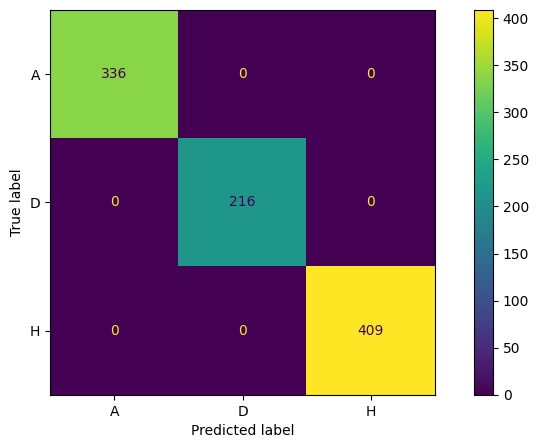

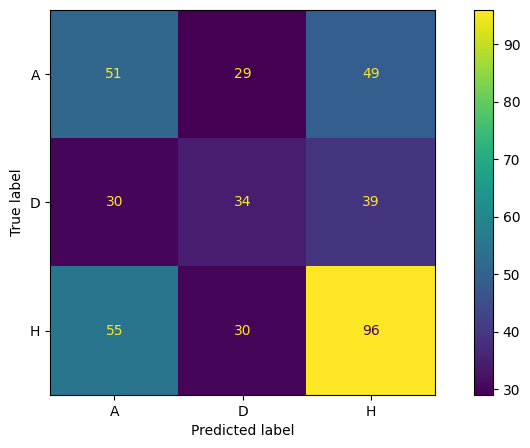

In [92]:
dt = classification_models(X_train_sel_feat,X_test_sel_feat,Y_train,Y_test,'dt','primary')
dt.model()

6_match_home,6_match_away,PSD,PSA,PSH,HomeTeam,AwayTeam,BWH,IWA,BWA,VCH,IWH,IWD,VCA,VCD,WHA,B365H,WHH,B365A,BWD,WHD,B365D,Quarter,Bet365_bet,Interwetten_bet,Bet&Win_bet,William Hill_bet,Pinnacle_bet,VC Bet_bet
0.071907,0.064016,0.056153,0.054761,0.054590,0.049420,0.047468,0.045976,0.044104,0.043005,0.042602,0.042023,0.040670,0.040204,0.037300,0.037233,0.036094,0.034679,0.033572,0.033069,0.029594,0.027939,0.023437,0.003422,0.001865,0.001707,0.001659,0.000815,0.000717


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Random Forest Class.,1.0,0.496368,0.249518,1.031964,-14518.0


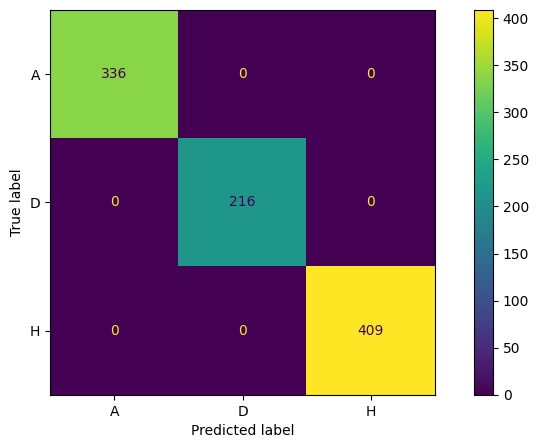

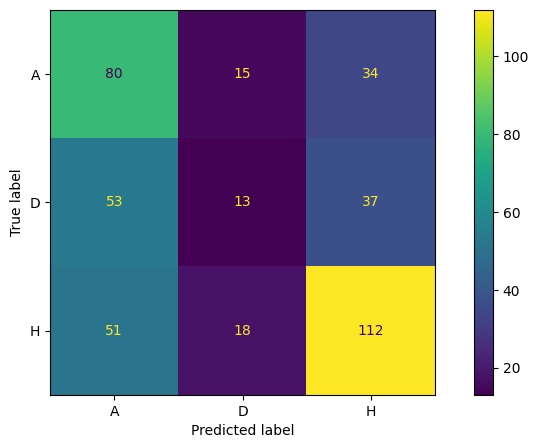

In [93]:
rf = classification_models(X_train_sel_feat,X_test_sel_feat,Y_train,Y_test,'rf','primary')
rf.model()

,ac_tr,ac_te,ll_tr,ll_te,profit_test
K Nearest Neighbors Class.,0.620187,0.433414,0.775046,5.828496,-29963.0


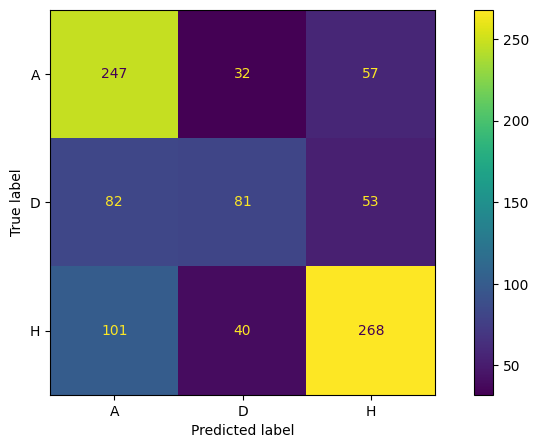

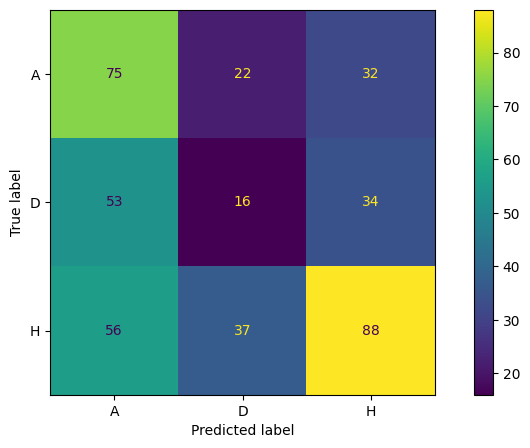

In [94]:
knn = classification_models(X_train_sel_feat,X_test_sel_feat,Y_train,Y_test,'knn','primary')
knn.model()

PSH,6_match_home,6_match_away,VCD,PSD,HomeTeam,IWA,IWH,B365D,PSA,BWH,IWD,AwayTeam,WHH,WHA,WHD,BWD,B365A,B365H,VCH,VCA,BWA,Bet365_bet,Bet&Win_bet,Interwetten_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet,Quarter
0.160000,0.140000,0.100000,0.060000,0.060000,0.060000,0.040000,0.040000,0.040000,0.040000,0.040000,0.040000,0.040000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
AdaBoost Class.,0.584807,0.508475,1.077149,1.083237,-18563.0


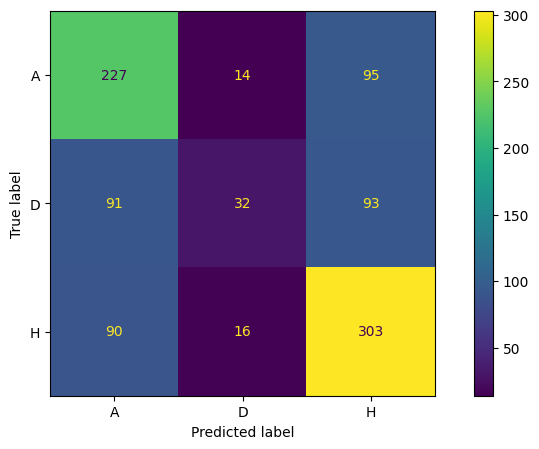

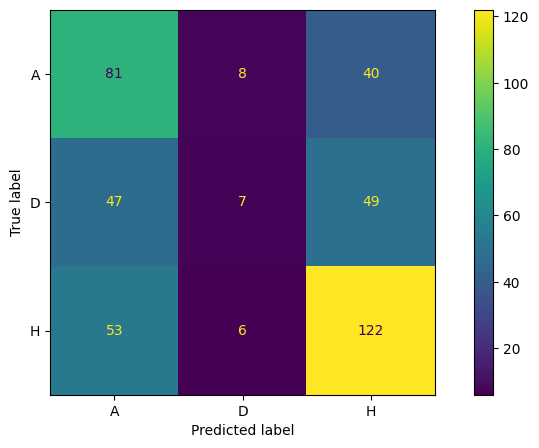

In [95]:
adb = classification_models(X_train_sel_feat,X_test_sel_feat,Y_train,Y_test,'adb','primary')
adb.model()

,ac_tr,ac_te,ll_tr,ll_te,profit_test
C-Support Vector Class.,0.552549,0.513317,0.985865,1.031126,-26432.0


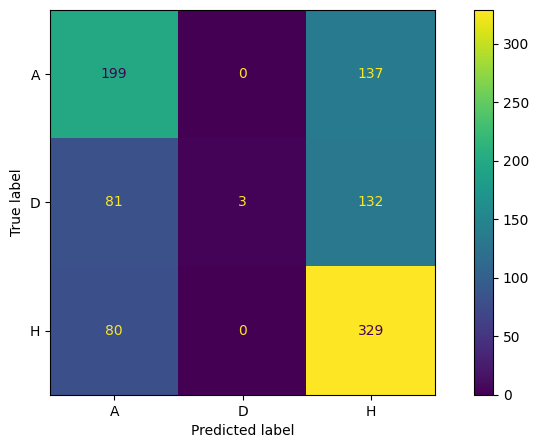

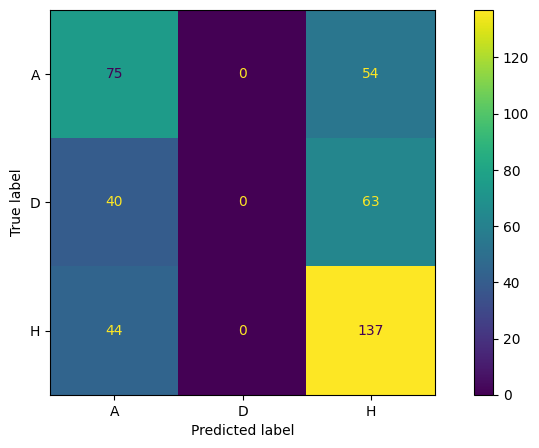

In [96]:
svc = classification_models(X_train_sel_feat,X_test_sel_feat,Y_train,Y_test,'svc','primary')
svc.model()

6_match_home,6_match_away,PSH,BWH,PSD,HomeTeam,VCH,IWA,AwayTeam,IWD,VCA,VCD,IWH,WHH,BWD,B365D,BWA,PSA,WHD,WHA,B365A,B365H,Quarter,Bet&Win_bet,VC Bet_bet,Bet365_bet,William Hill_bet,Interwetten_bet,Pinnacle_bet
0.131048,0.107823,0.101461,0.077498,0.066612,0.058787,0.057230,0.040008,0.035966,0.034549,0.034455,0.032464,0.029677,0.025554,0.024007,0.022037,0.021625,0.020544,0.020088,0.017560,0.016176,0.015828,0.008898,0.000083,0.000023,0.000001,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Gradient Boosting Class.,0.833507,0.491525,0.593646,1.053985,-27255.0


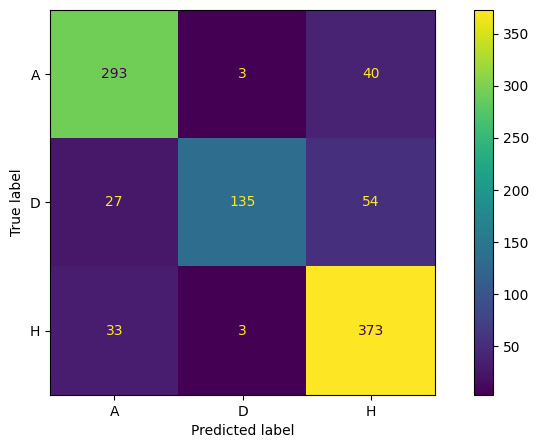

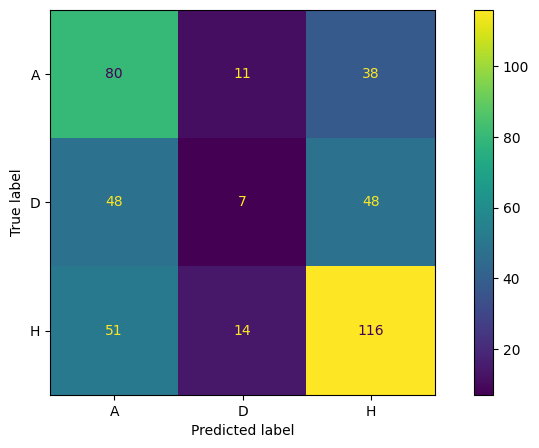

In [97]:
gbc = classification_models(X_train_sel_feat,X_test_sel_feat,Y_train,Y_test,'gbc','primary')
gbc.model()

Bet365_bet,VCH,PSH,VCA,BWH,IWA,WHH,B365A,VCD,IWD,Bet&Win_bet,6_match_home,IWH,HomeTeam,B365D,AwayTeam,PSD,B365H,BWA,WHA,6_match_away,PSA,WHD,BWD,Quarter,Interwetten_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet
0.064795,0.063809,0.062089,0.058982,0.053115,0.048155,0.045313,0.043686,0.039552,0.036140,0.035277,0.035066,0.034499,0.034482,0.034037,0.033104,0.032965,0.032557,0.032358,0.031663,0.031452,0.031010,0.029411,0.028296,0.028187,0.000000,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
XGBoost,1.0,0.474576,0.062955,1.302865,-16791.0


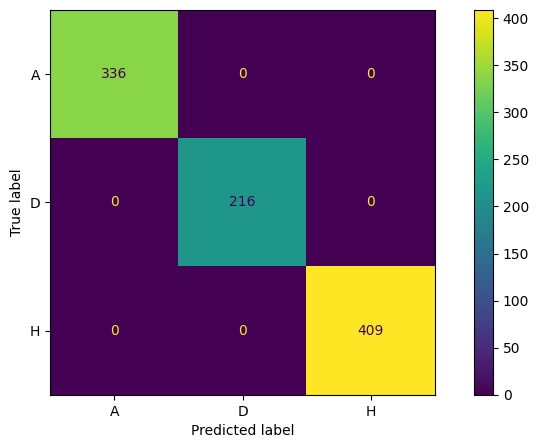

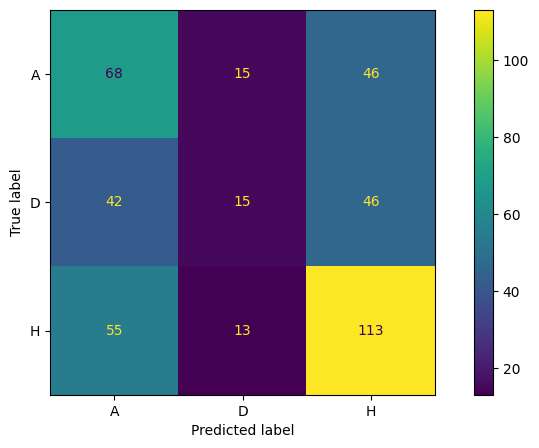

In [98]:
xgb = classification_models(X_train_sel_feat,X_test_sel_feat,Y_train,Y_test,'xgb','primary')
xgb.model()

models with unbalanced dataset with primary feature selection,ac_tr,ac_te,ll_tr,ll_te,profit_test
Decision Tree,1.000000,0.438257,0.000000,20.247282,8212.000000
Random Forest,1.000000,0.496368,0.249518,1.031964,-14518.000000
K Nearest Neighbors,0.620187,0.433414,0.775046,5.828496,-29963.000000
AdaBoost,0.584807,0.508475,1.077149,1.083237,-18563.000000
C-Support Vector,0.552549,0.513317,0.985865,1.031126,-26432.000000
Gradient Boosting,0.833507,0.491525,0.593646,1.053985,-27255.000000
XGB,1.000000,0.474576,0.062955,1.302865,-16791.000000


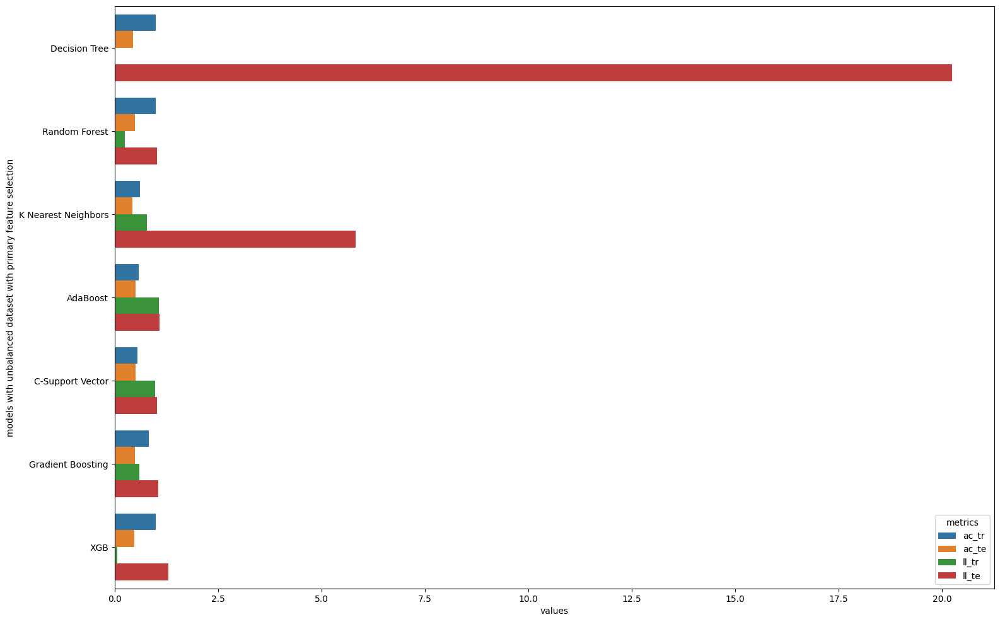

In [99]:
data_visualization([dt,rf,knn,adb,svc,gbc,xgb],'unbalanced dataset with primary feature selection')

Generally, the accuracy score is mediocre. Albeit, further modelling will be performed with data balancing and another feature selection, in order to improve the score. What is quite surprising is the fact, that the worst performing algorithm, has the highest profit.

After carefully analysing the results of that model and comparing its confusion matrix, it can be deduced that the model has a better prediction capabilities than the other models in terms of predicting draw. This phenomenon is worth investigating later in the analysis.

# Balanced data model training with primary feature selection

Now the same models will be tested against balanced date with the SMOTE balancing algorithm. Only train data will be balanced, since passing the test data will reveal to the model, what results could be expected. Thus, the returned results would be biased.

In [100]:
# as in data train_test_split, a random_state integer is passed for consistency.
smote = SMOTE(random_state = 42)

# to make sure original values of independent and dependent parameter do not get overwritten, a deepcopy of them is made.
X_smote, Y_smote = X[sel_feat].copy(), Y.copy()

# splitting data, again.
X_train_smote, X_test_smote, Y_train_smote, Y_test_smote = train_test_split(X_smote,Y_smote,test_size=0.3,random_state=42)

print('X_train shape')
X_train_smote.shape

print('X_test shape')
X_test_smote.shape

X_train shape


(961, 29)

X_test shape


(413, 29)

In [101]:
# the following method will resample the data.
X_train_smote, Y_train_smote = smote.fit_resample(X_train_smote, Y_train_smote)

Y_train_smote.value_counts()

2    409
0    409
1    409
Name: FTR, dtype: int64

6_match_home,6_match_away,BWH,HomeTeam,PSD,WHA,PSA,AwayTeam,WHD,PSH,VCD,IWD,B365A,BWA,IWA,B365H,B365D,IWH,WHH,BWD,VCA,Quarter,VCH,Interwetten_bet,Bet&Win_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet,Bet365_bet
0.124809,0.113898,0.099978,0.065141,0.055419,0.050445,0.046079,0.045685,0.039497,0.035673,0.032215,0.031058,0.030184,0.027142,0.025571,0.024764,0.022824,0.022184,0.021071,0.020222,0.019599,0.017428,0.017402,0.011713,0.000000,0.000000,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Decision Tree Class.,1.0,0.387409,4.440892e-16,22.08001,-23646.0


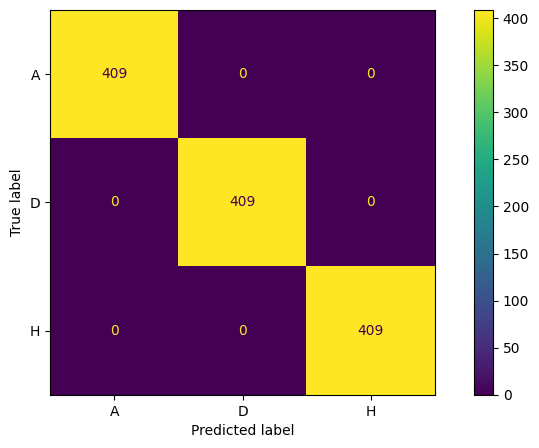

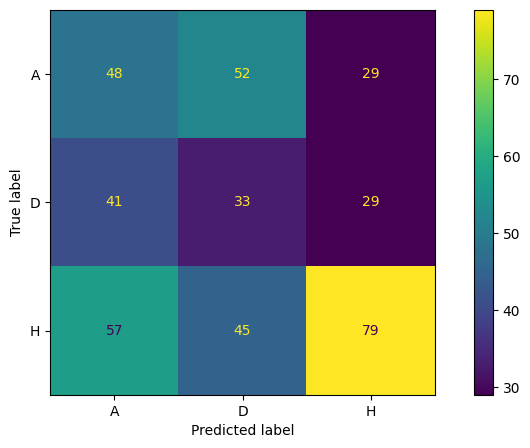

In [102]:
dt_smote = classification_models(X_train_smote,X_test_smote,Y_train_smote,Y_test_smote,'dt','primary')
dt_smote.model()

6_match_home,6_match_away,PSH,PSD,HomeTeam,VCH,PSA,AwayTeam,IWH,BWA,BWH,IWA,IWD,WHH,VCA,BWD,B365A,VCD,WHA,B365H,WHD,B365D,Quarter,Bet365_bet,Interwetten_bet,VC Bet_bet,Pinnacle_bet,Bet&Win_bet,William Hill_bet
0.074796,0.060617,0.052628,0.050768,0.049560,0.043807,0.043617,0.043340,0.043046,0.042809,0.042325,0.041897,0.039597,0.038234,0.036959,0.036209,0.035292,0.035063,0.034962,0.034777,0.033725,0.033706,0.024263,0.008130,0.005766,0.005089,0.004284,0.002429,0.002305


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Random Forest Class.,1.0,0.447942,0.231897,1.089401,-3365.0


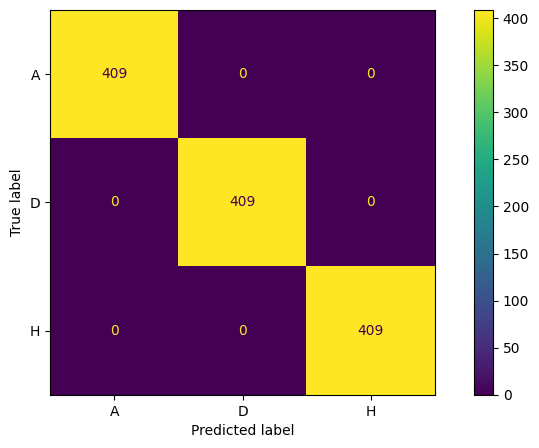

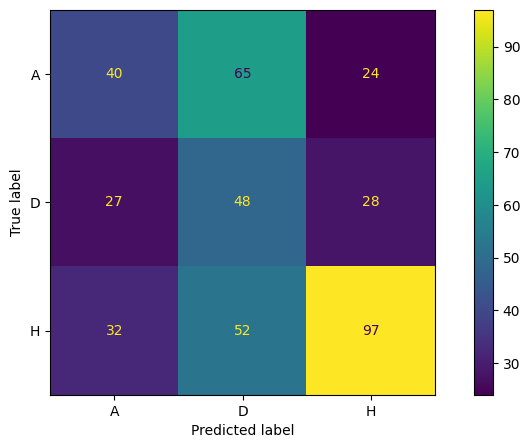

In [103]:
rf_smote = classification_models(X_train_smote,X_test_smote,Y_train_smote,Y_test_smote,'rf','primary')
rf_smote.model()

,ac_tr,ac_te,ll_tr,ll_te,profit_test
K Nearest Neighbors Class.,0.677262,0.394673,0.648951,7.114466,-34719.0


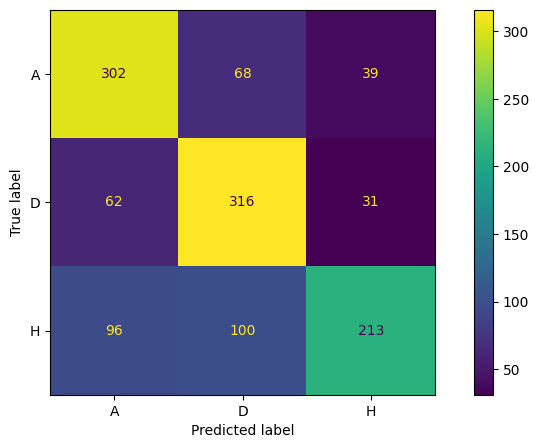

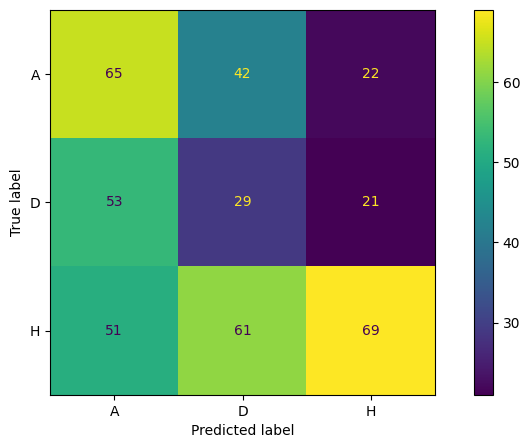

In [104]:
knn_smote = classification_models(X_train_smote,X_test_smote,Y_train_smote,Y_test_smote,'knn','primary')
knn_smote.model()

6_match_away,6_match_home,IWD,B365D,AwayTeam,VCD,PSH,IWH,IWA,WHD,WHA,Quarter,Interwetten_bet,PSA,BWA,PSD,HomeTeam,BWD,BWH,B365A,B365H,VCH,VCA,Bet365_bet,Bet&Win_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet,WHH
0.140000,0.120000,0.060000,0.060000,0.060000,0.060000,0.040000,0.040000,0.040000,0.040000,0.040000,0.040000,0.040000,0.040000,0.040000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
AdaBoost Class.,0.577832,0.411622,1.083272,1.089108,-33986.0


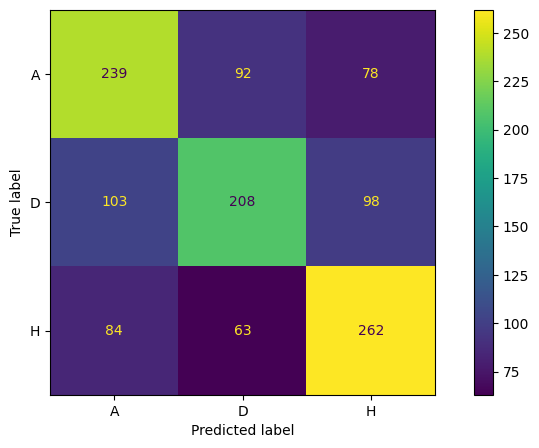

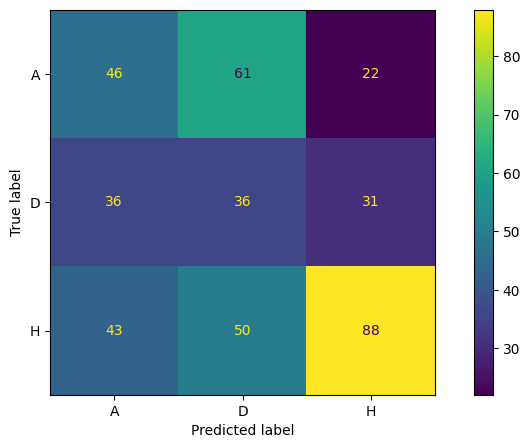

In [105]:
adb_smote = classification_models(X_train_smote,X_test_smote,Y_train_smote,Y_test_smote,'adb','primary')
adb_smote.model()

,ac_tr,ac_te,ll_tr,ll_te,profit_test
C-Support Vector Class.,0.517522,0.506053,0.988179,1.048237,-23257.0


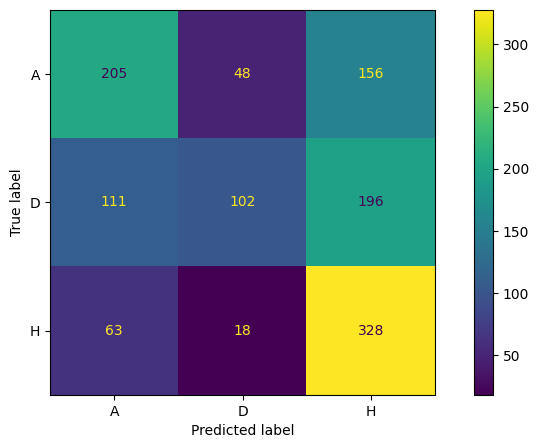

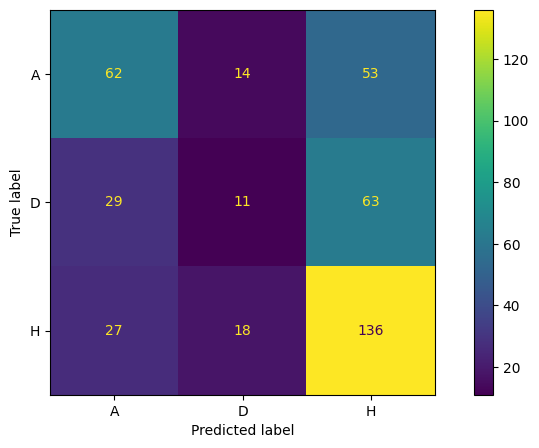

In [106]:
svc_smote = classification_models(X_train_smote,X_test_smote,Y_train_smote,Y_test_smote,'svc','primary')
svc_smote.model()

6_match_home,6_match_away,BWH,BWA,IWA,AwayTeam,PSD,VCH,HomeTeam,IWH,B365D,WHD,VCD,IWD,VCA,Bet365_bet,PSA,PSH,Quarter,WHA,BWD,B365H,B365A,WHH,Interwetten_bet,Bet&Win_bet,Pinnacle_bet,VC Bet_bet,William Hill_bet
0.137131,0.089082,0.085756,0.064838,0.054792,0.053816,0.047128,0.044890,0.039701,0.038249,0.036058,0.032837,0.030283,0.029329,0.029114,0.027386,0.026338,0.024441,0.022597,0.021924,0.018797,0.016169,0.014988,0.012226,0.001441,0.000667,0.000023,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Gradient Boosting Class.,0.838631,0.42615,0.599425,1.130252,-30081.0


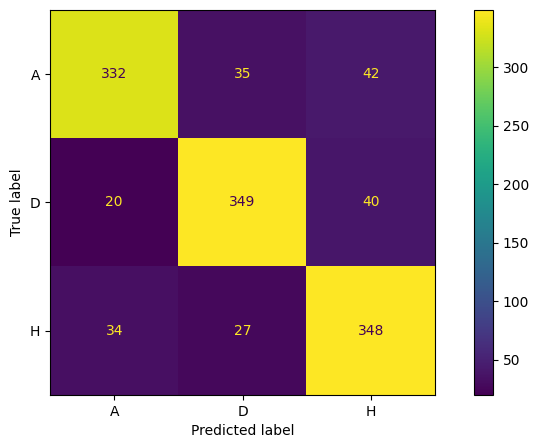

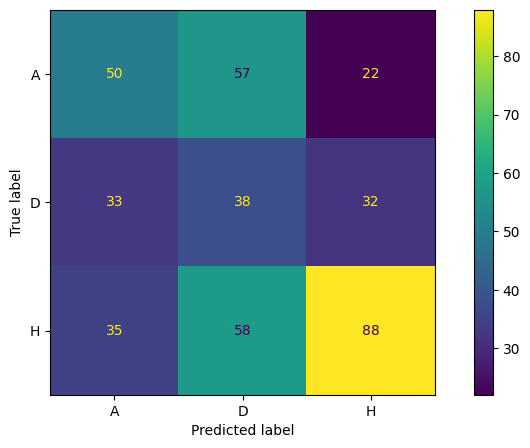

In [107]:
gbc_smote = classification_models(X_train_smote,X_test_smote,Y_train_smote,Y_test_smote,'gbc','primary')
gbc_smote.model()

Bet365_bet,VCH,Bet&Win_bet,BWH,IWA,Interwetten_bet,B365D,VCA,BWA,WHA,IWH,VCD,PSH,6_match_home,6_match_away,WHD,IWD,PSD,AwayTeam,B365A,B365H,WHH,Quarter,PSA,HomeTeam,BWD,VC Bet_bet,Pinnacle_bet,William Hill_bet
0.219154,0.053555,0.051943,0.049040,0.041083,0.037690,0.033190,0.031967,0.031336,0.028588,0.027955,0.027876,0.027770,0.026761,0.026727,0.025642,0.025055,0.025020,0.024804,0.024659,0.024222,0.024115,0.024064,0.023570,0.023400,0.022763,0.018050,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
XGBoost,1.0,0.430993,0.058371,1.411757,-9640.0


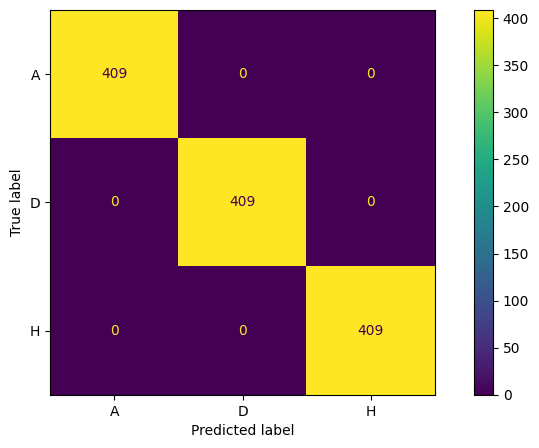

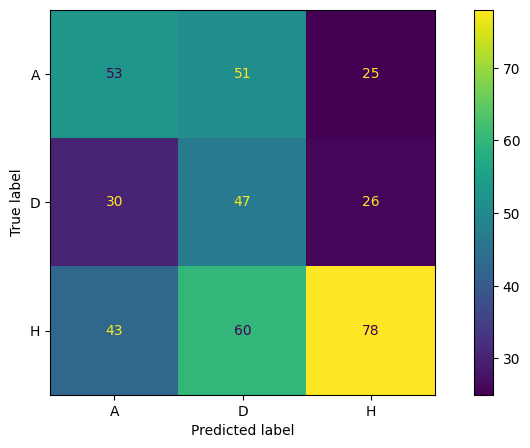

In [108]:
xgb_smote = classification_models(X_train_smote,X_test_smote,Y_train_smote,Y_test_smote,'xgb','primary')
xgb_smote.model()

models with balanced dataset with primary feature selection,ac_tr,ac_te,ll_tr,ll_te,profit_test
Decision Tree,1.000000,0.387409,0.000000,22.080010,-23646.000000
Random Forest,1.000000,0.447942,0.231897,1.089401,-3365.000000
K Nearest Neighbors,0.677262,0.394673,0.648951,7.114466,-34719.000000
AdaBoost,0.577832,0.411622,1.083272,1.089108,-33986.000000
C-Support Vector,0.517522,0.506053,0.988179,1.048237,-23257.000000
Gradient Boosting,0.838631,0.426150,0.599425,1.130252,-30081.000000
XGB,1.000000,0.430993,0.058371,1.411757,-9640.000000


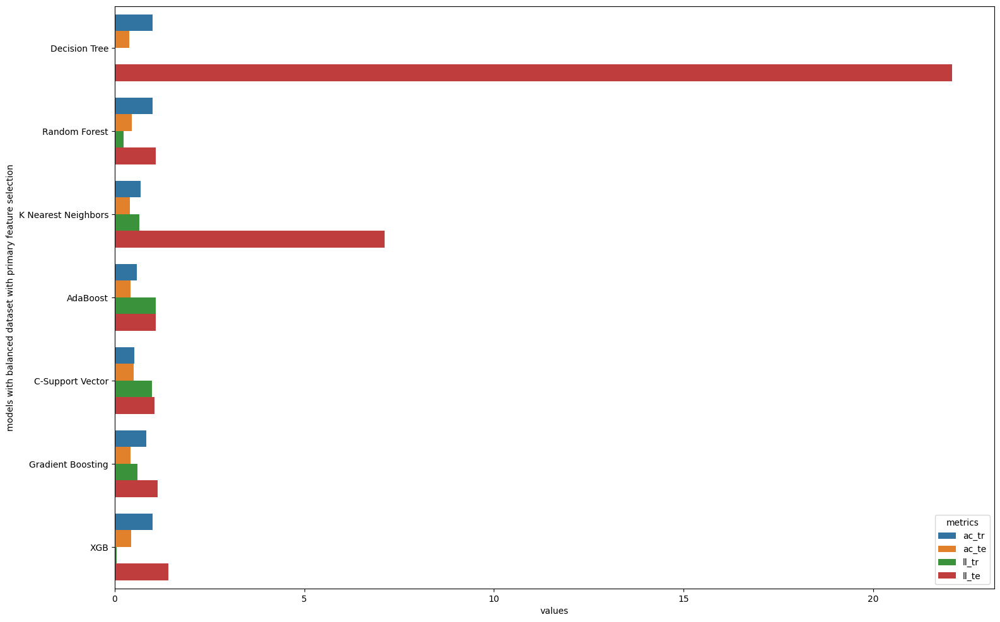

In [109]:
data_visualization([dt_smote,rf_smote,knn_smote,adb_smote,svc_smote,gbc_smote,xgb_smote],'balanced dataset with primary feature selection')

The returned results of data balancing are even worse than the previous results. 

However, looking at the last model, it can be observed that there is a similar tendency as to the decision tree model from the previous training, notably, the draw and away predictions are better, together, in comparison to the other models. 

This observation might which classes are usually the most difficult to guess by the bookmakers, which if guessed right by the model, could provide the highest profit.

The upcoming sections will focus on model training with both balanced and unbalanced data, but with further feature selection, that is a feature reduction conducted on the current DataFrame with primary feature reduction.

# Secondary feature selection

After comparing the data, it might seem as the there still is quite high dimensionality. Thus, a secondary feature selection will be performed on the DataFrame with primarily selected variables.

In [ ]:
# reducing features again.
feature_backward_elimination(X_train_sel_feat, Y_train)

In [111]:
# selected features for further analysis.
sel_feat_2nd_iter = ['HomeTeam','AwayTeam','IWH','IWD','IWA','WHH','WHD','WHA','B365H','B365D','B365A',
                     'BWH','BWD','BWA','VCH','VCD','VCA','Bet365_bet','Bet&Win_bet','Interwetten_bet','VC Bet_bet',
                     'William Hill_bet','Quarter','6_match_home','6_match_away']

# Balanced data model training with secondary feature selection

Another modeling phase is conducted on balanced data with secondary feature selection.

In [112]:
X_smote_sel_feat, Y_smote = X[sel_feat_2nd_iter].copy(), Y.copy()

X_train_smote_sel_feat, X_test_smote_sel_feat, Y_train_smote, Y_test_smote = train_test_split(X_smote_sel_feat,Y_smote,test_size=0.3,random_state=42)

print('X_train shape')
X_train_smote_sel_feat.shape

print('X_test shape')
X_test_smote_sel_feat.shape

X_train shape


(961, 25)

X_test shape


(413, 25)

In [113]:
X_train_smote_sel_feat, Y_train_smote = smote.fit_resample(X_train_smote_sel_feat, Y_train_smote)

6_match_home,6_match_away,BWH,HomeTeam,AwayTeam,IWA,VCD,VCH,IWH,B365D,BWA,WHD,B365H,WHA,BWD,Quarter,VCA,B365A,WHH,Interwetten_bet,IWD,Bet365_bet,William Hill_bet,Bet&Win_bet,VC Bet_bet
0.137576,0.098586,0.092161,0.075687,0.065651,0.054020,0.052072,0.042726,0.042355,0.042084,0.040143,0.037730,0.036314,0.034556,0.027458,0.027398,0.022485,0.021964,0.019389,0.013751,0.011571,0.002223,0.002100,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Decision Tree Class.,1.0,0.423729,4.440892e-16,20.770919,2953.0


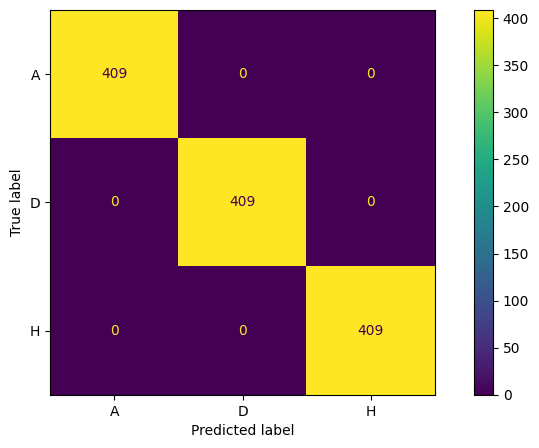

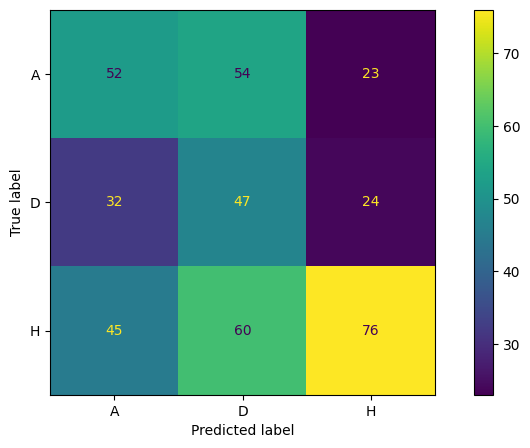

In [114]:
dt_smote_2nd_iter = classification_models(X_train_smote_sel_feat,X_test_smote_sel_feat,Y_train_smote,Y_test_smote,'dt','secondary')
dt_smote_2nd_iter.model()

6_match_home,6_match_away,HomeTeam,BWH,VCH,AwayTeam,B365H,BWA,IWA,IWD,WHH,WHA,IWH,VCA,VCD,B365A,B365D,BWD,WHD,Quarter,Bet365_bet,Interwetten_bet,VC Bet_bet,William Hill_bet,Bet&Win_bet
0.078826,0.072912,0.057821,0.057082,0.055247,0.051959,0.050742,0.049214,0.048180,0.046711,0.045775,0.044685,0.043489,0.041495,0.040678,0.040620,0.039945,0.039640,0.038741,0.029182,0.009083,0.006350,0.005609,0.004934,0.001081


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Random Forest Class.,1.0,0.46247,0.231246,1.076626,-6230.0


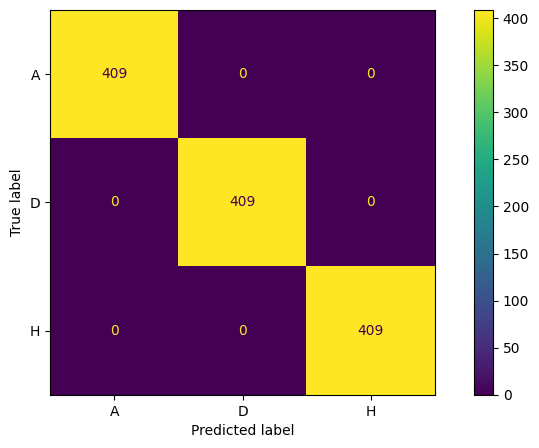

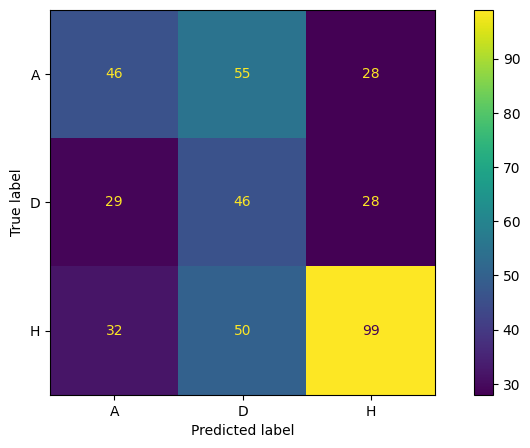

In [115]:
rf_smote_2nd_iter = classification_models(X_train_smote_sel_feat,X_test_smote_sel_feat,Y_train_smote,Y_test_smote,'rf','secondary')
rf_smote_2nd_iter.model()

,ac_tr,ac_te,ll_tr,ll_te,profit_test
K Nearest Neighbors Class.,0.675632,0.389831,0.658354,7.106743,-33481.0


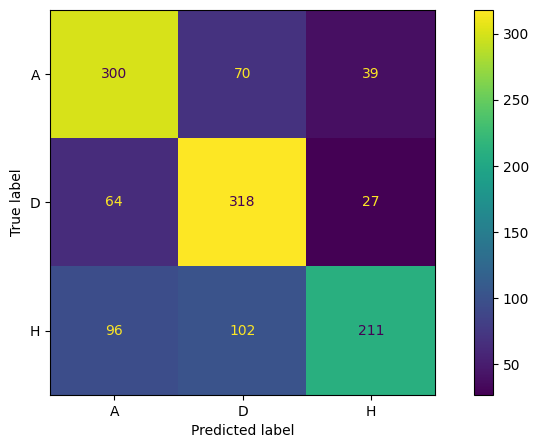

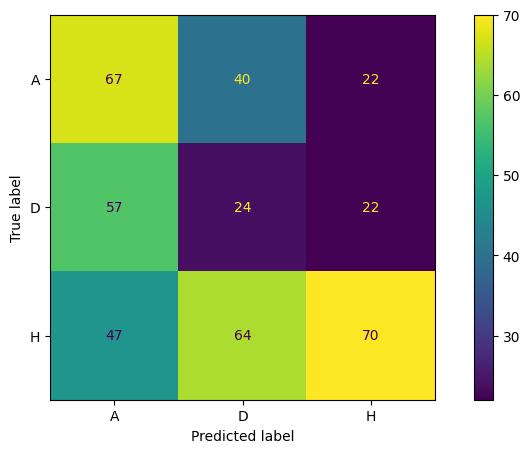

In [116]:
knn_smote_2nd_iter = classification_models(X_train_smote_sel_feat,X_test_smote_sel_feat,Y_train_smote,Y_test_smote,'knn','secondary')
knn_smote_2nd_iter.model()

6_match_away,6_match_home,IWD,IWA,B365D,VCD,IWH,Quarter,WHA,Interwetten_bet,B365A,BWH,AwayTeam,VCA,HomeTeam,VCH,BWA,B365H,WHD,WHH,BWD,Bet365_bet,Bet&Win_bet,VC Bet_bet,William Hill_bet
0.120000,0.120000,0.100000,0.080000,0.080000,0.060000,0.040000,0.040000,0.040000,0.040000,0.040000,0.040000,0.040000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,0.000000,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
AdaBoost Class.,0.575387,0.428571,1.084732,1.093036,-19793.0


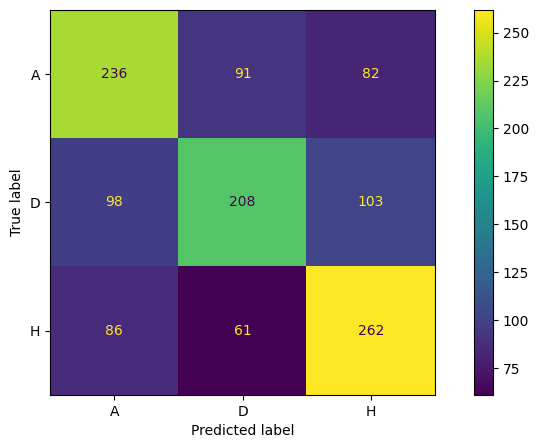

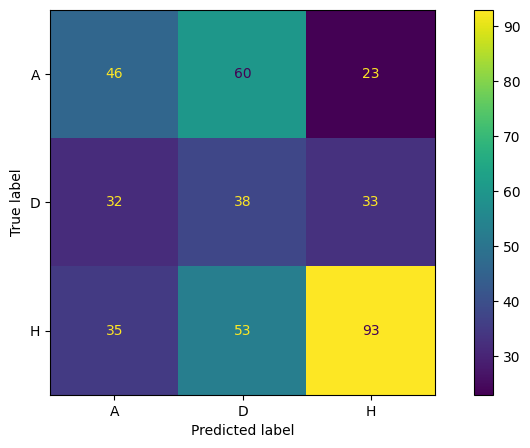

In [117]:
adb_smote_2nd_iter = classification_models(X_train_smote_sel_feat,X_test_smote_sel_feat,Y_train_smote,Y_test_smote,'adb','secondary')
adb_smote_2nd_iter.model()

,ac_tr,ac_te,ll_tr,ll_te,profit_test
C-Support Vector Class.,0.516707,0.503632,0.980021,1.046287,-21794.0


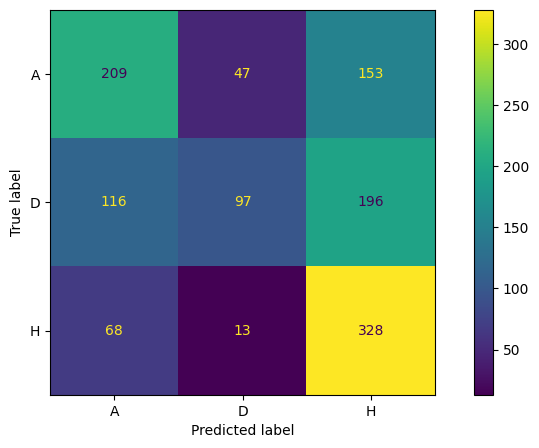

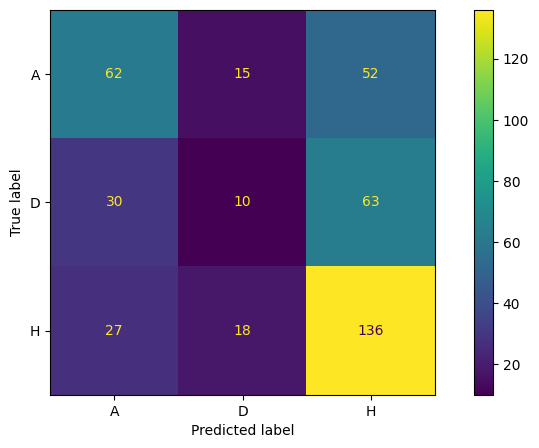

In [118]:
svc_smote_2nd_iter = classification_models(X_train_smote_sel_feat,X_test_smote_sel_feat,Y_train_smote,Y_test_smote,'svc','secondary')
svc_smote_2nd_iter.model()

6_match_home,6_match_away,BWH,BWA,VCH,B365D,AwayTeam,IWD,IWA,VCD,VCA,HomeTeam,WHA,IWH,WHD,B365H,BWD,Quarter,Bet365_bet,B365A,WHH,Interwetten_bet,William Hill_bet,Bet&Win_bet,VC Bet_bet
0.130521,0.101134,0.083867,0.072789,0.069750,0.049787,0.049492,0.046247,0.045115,0.040239,0.039187,0.038758,0.034631,0.029459,0.028297,0.028123,0.027430,0.022533,0.018879,0.016732,0.015163,0.011262,0.000312,0.000294,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Gradient Boosting Class.,0.835371,0.476998,0.60964,1.088311,-1145.0


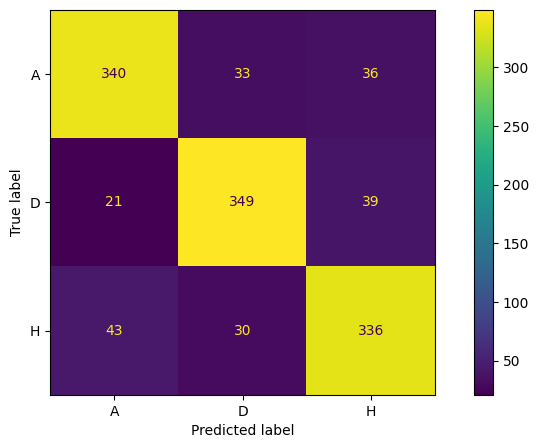

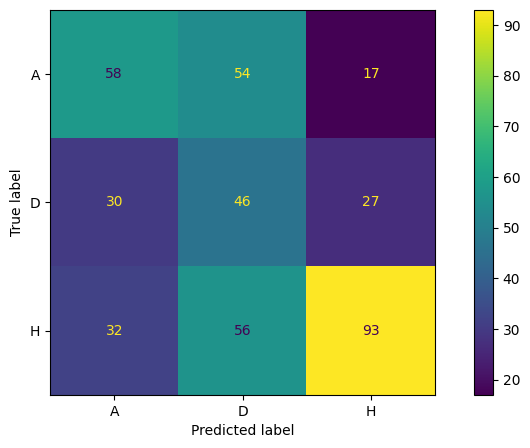

In [119]:
gbc_smote_2nd_iter = classification_models(X_train_smote_sel_feat,X_test_smote_sel_feat,Y_train_smote,Y_test_smote,'gbc','secondary')
gbc_smote_2nd_iter.model()

Bet365_bet,Interwetten_bet,BWH,VC Bet_bet,VCH,VCA,WHA,B365D,IWA,VCD,6_match_away,6_match_home,BWA,AwayTeam,WHH,IWD,IWH,Quarter,B365H,B365A,BWD,HomeTeam,WHD,William Hill_bet,Bet&Win_bet
0.294397,0.137093,0.043935,0.042268,0.034658,0.033084,0.031050,0.028575,0.028173,0.026989,0.024658,0.024540,0.024495,0.022850,0.022782,0.022681,0.022345,0.021771,0.021302,0.020507,0.019895,0.019865,0.019602,0.010772,0.001714


,ac_tr,ac_te,ll_tr,ll_te,profit_test
XGBoost,1.0,0.457627,0.062631,1.426905,-3762.0


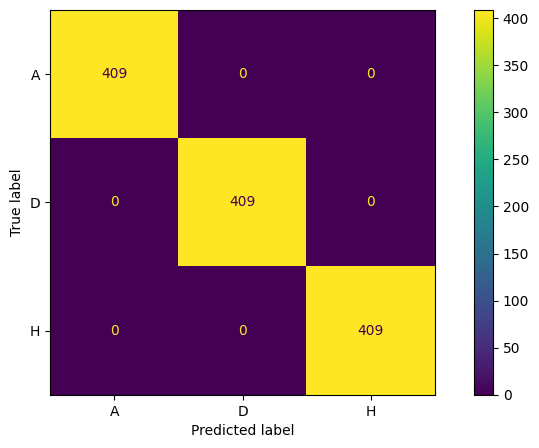

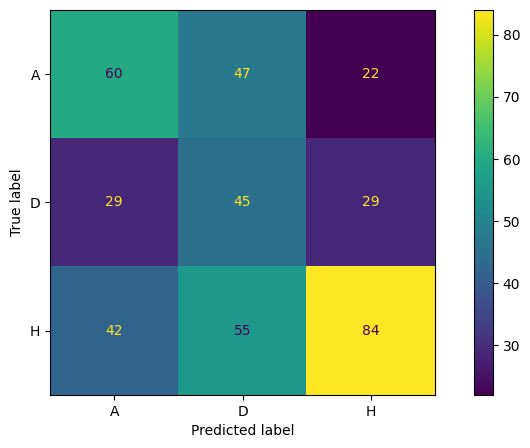

In [120]:
xgb_smote_2nd_iter = classification_models(X_train_smote_sel_feat,X_test_smote_sel_feat,Y_train_smote,Y_test_smote,'xgb','secondary')
xgb_smote_2nd_iter.model()

models with balanced dataset with secondary feature selection,ac_tr,ac_te,ll_tr,ll_te,profit_test
Decision Tree,1.000000,0.423729,0.000000,20.770919,2953.000000
Random Forest,1.000000,0.462470,0.231246,1.076626,-6230.000000
K Nearest Neighbors,0.675632,0.389831,0.658354,7.106743,-33481.000000
AdaBoost,0.575387,0.428571,1.084732,1.093036,-19793.000000
C-Support Vector,0.516707,0.503632,0.980021,1.046287,-21794.000000
Gradient Boosting,0.835371,0.476998,0.609640,1.088311,-1145.000000
XGB,1.000000,0.457627,0.062631,1.426905,-3762.000000


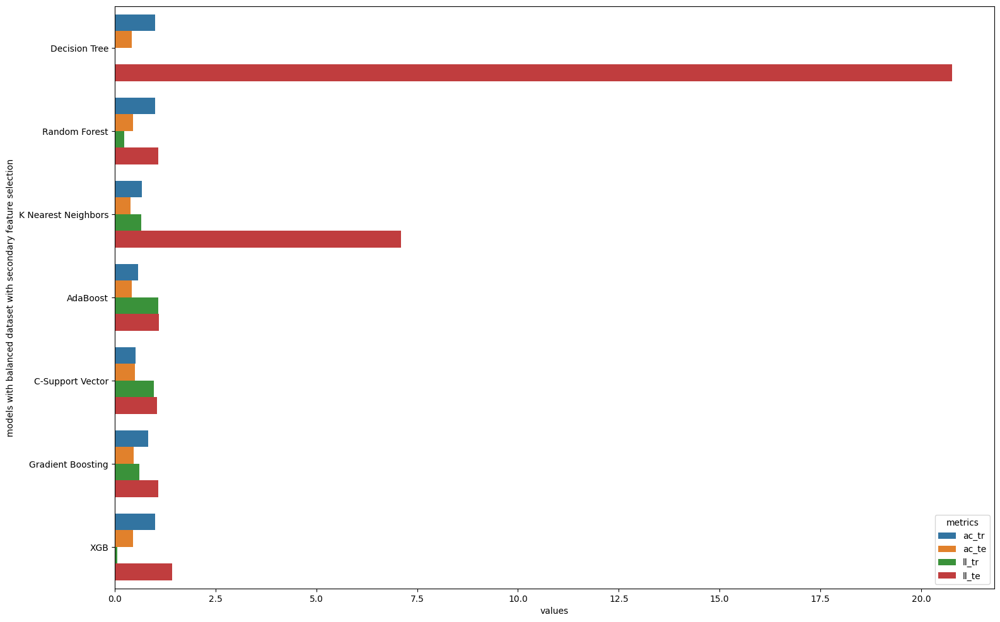

In [121]:
data_visualization([dt_smote_2nd_iter,rf_smote_2nd_iter,knn_smote_2nd_iter,adb_smote_2nd_iter,svc_smote_2nd_iter,gbc_smote_2nd_iter,xgb_smote_2nd_iter],'balanced dataset with secondary feature selection')

Again, the results are mediocre, although, one model made a profit. 

Nonetheless, these models focused more on the draw and away results, which was also correctly predicted by other models that generated a loss, yet not greater than 5000, whereas some made significant loss. 

Therefore, it could be that predicting a draw and away by a model, where the bookmakers place a wrong bet, results in the highest profit.

# Unbalanced data model training with secondary feature selection

Lastly, to have fair results, the same modeling will be conducted on unbalanced data.

In [122]:
X_sel_feat = X[sel_feat_2nd_iter].copy()

X_train_sel_feat_2nd_iter, X_test_sel_feat_2nd_iter, Y_train_2nd_iter, Y_test_2nd_iter = train_test_split(X_sel_feat,Y,test_size=0.3,random_state=42)

print('X_train shape')
X_train_sel_feat_2nd_iter.shape

print('X_test shape')
X_test_sel_feat_2nd_iter.shape

X_train shape


(961, 25)

X_test shape


(413, 25)

6_match_away,6_match_home,BWH,HomeTeam,AwayTeam,VCD,IWD,WHD,B365D,BWD,IWA,B365A,Quarter,VCA,WHA,BWA,WHH,B365H,IWH,VCH,William Hill_bet,Bet365_bet,Bet&Win_bet,Interwetten_bet,VC Bet_bet
0.145025,0.128912,0.111286,0.093731,0.084273,0.053135,0.048836,0.038041,0.036038,0.030535,0.029929,0.027152,0.025552,0.024318,0.024107,0.023882,0.020433,0.020366,0.016793,0.016044,0.001611,0.000000,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Decision Tree Class.,1.0,0.430993,4.440892e-16,20.509101,5408.0


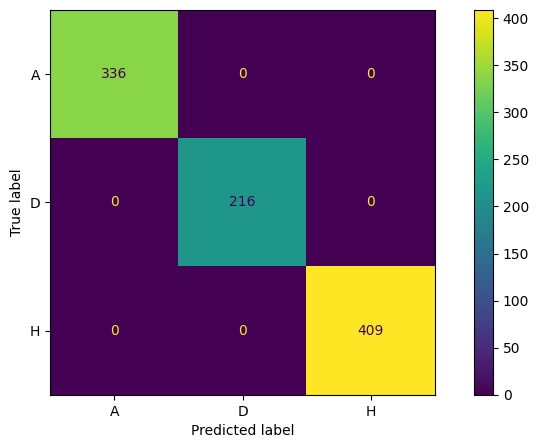

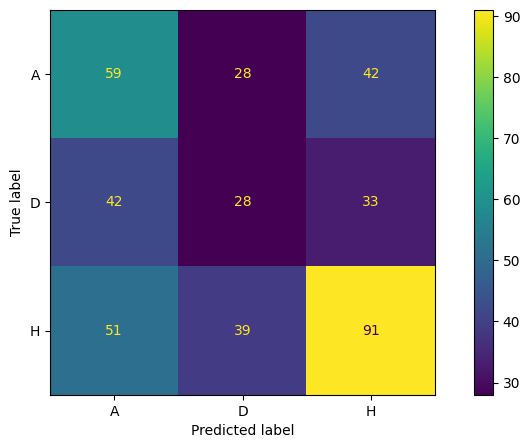

In [123]:
dt_2nd_iter = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'dt','secondary')
dt_2nd_iter.model()

6_match_home,6_match_away,HomeTeam,VCA,WHA,AwayTeam,BWA,IWA,B365H,VCH,IWD,IWH,BWH,WHH,B365A,VCD,WHD,BWD,B365D,Quarter,Bet365_bet,VC Bet_bet,Interwetten_bet,William Hill_bet,Bet&Win_bet
0.086393,0.073363,0.061697,0.054177,0.052572,0.052406,0.051312,0.050691,0.048989,0.048970,0.048882,0.047824,0.044859,0.044227,0.044103,0.041351,0.036866,0.036182,0.035575,0.028984,0.004252,0.002070,0.001907,0.001728,0.000619


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Random Forest Class.,1.0,0.491525,0.24694,1.024986,-17433.0


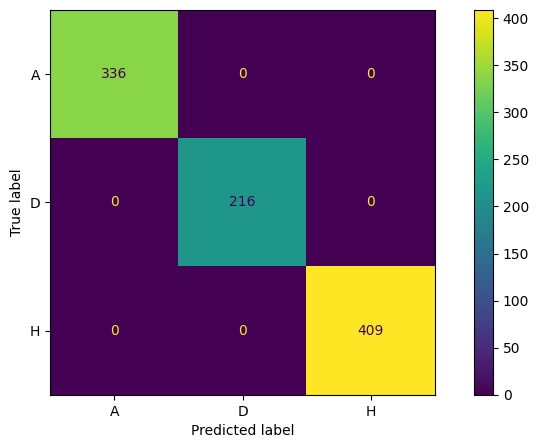

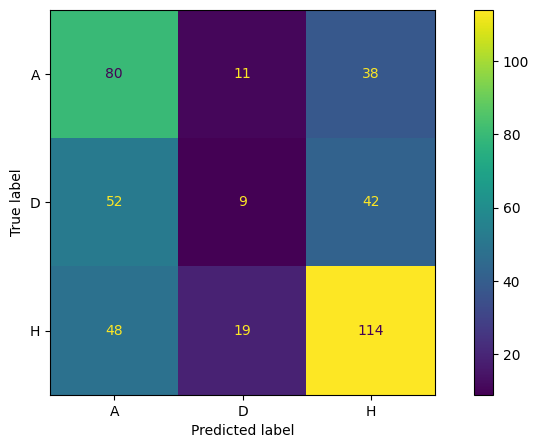

In [124]:
rf_2nd_iter = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'rf','secondary')
rf_2nd_iter.model()

,ac_tr,ac_te,ll_tr,ll_te,profit_test
K Nearest Neighbors Class.,0.622268,0.440678,0.772942,5.825778,-20059.0


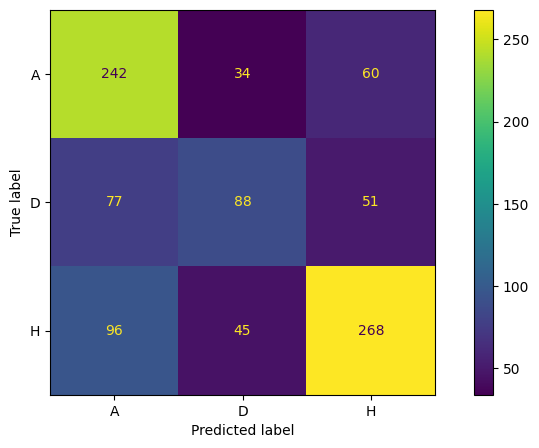

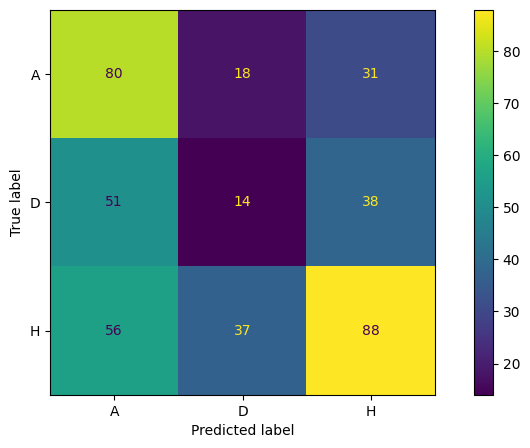

In [125]:
knn_2nd_iter = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'knn','secondary')
knn_2nd_iter.model()

6_match_home,B365D,IWA,6_match_away,IWD,VCD,BWH,HomeTeam,B365A,AwayTeam,BWA,B365H,WHH,IWH,VCA,VCH,WHD,BWD,WHA,Bet365_bet,Bet&Win_bet,Interwetten_bet,VC Bet_bet,William Hill_bet,Quarter
0.180000,0.100000,0.100000,0.080000,0.080000,0.080000,0.060000,0.060000,0.040000,0.040000,0.040000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
AdaBoost Class.,0.574402,0.513317,1.08157,1.088462,-11068.0


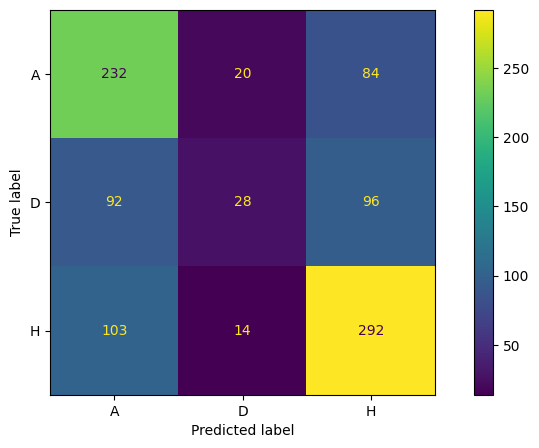

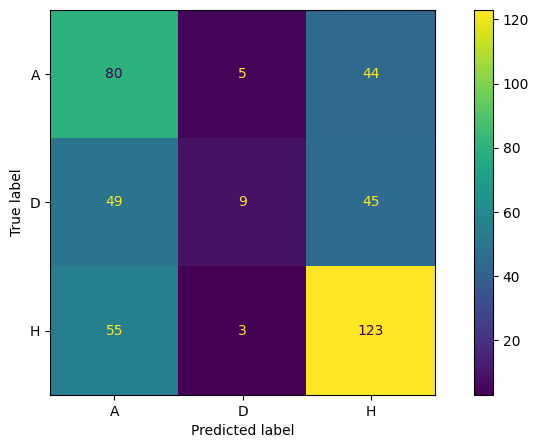

In [126]:
adb_2nd_iter = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'adb','secondary')
adb_2nd_iter.model()

,ac_tr,ac_te,ll_tr,ll_te,profit_test
C-Support Vector Class.,0.552549,0.513317,0.984207,1.030703,-22686.0


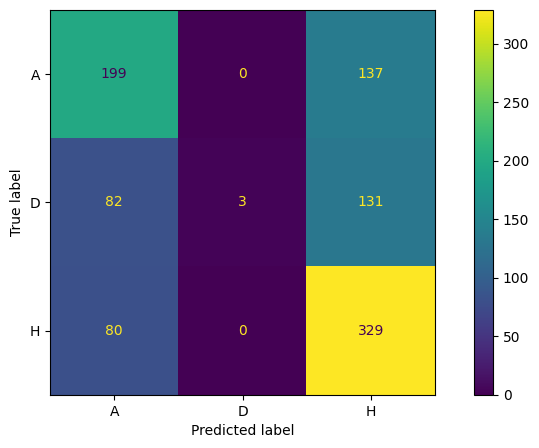

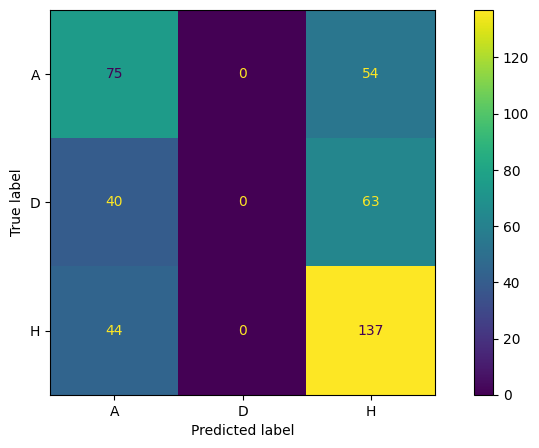

In [127]:
svc_2nd_iter = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'svc','secondary')
svc_2nd_iter.model()

6_match_home,6_match_away,BWH,HomeTeam,VCH,IWA,VCA,AwayTeam,IWD,Bet&Win_bet,VCD,WHH,IWH,B365D,WHD,BWA,B365H,BWD,B365A,WHA,Quarter,Bet365_bet,William Hill_bet,VC Bet_bet,Interwetten_bet
0.146570,0.125360,0.096647,0.054279,0.053436,0.053002,0.051425,0.047205,0.046855,0.043126,0.037652,0.034665,0.034634,0.031732,0.029577,0.028175,0.021053,0.019815,0.018589,0.017624,0.007228,0.001235,0.000088,0.000028,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Gradient Boosting Class.,0.815817,0.491525,0.611839,1.043276,-17820.0


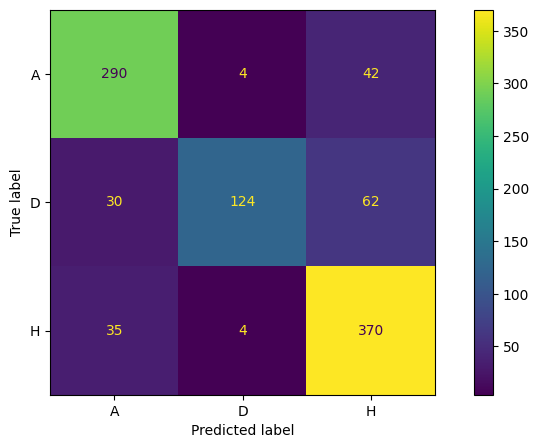

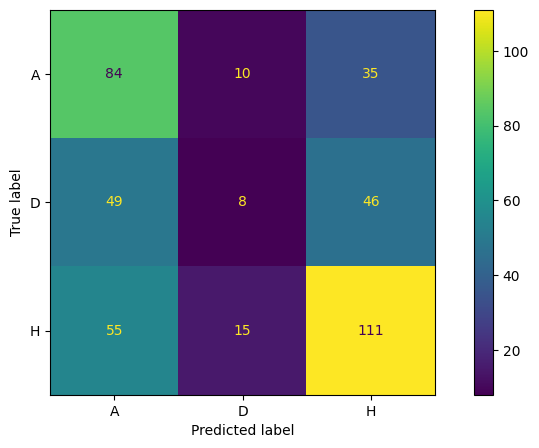

In [128]:
gbc_2nd_iter = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'gbc','secondary')
gbc_2nd_iter.model()

Bet&Win_bet,VCH,IWA,VCA,BWH,WHH,B365A,B365H,VCD,HomeTeam,IWH,6_match_home,WHD,IWD,AwayTeam,WHA,B365D,6_match_away,BWA,BWD,Quarter,Bet365_bet,Interwetten_bet,VC Bet_bet,William Hill_bet
0.316852,0.050738,0.048262,0.047281,0.045462,0.037518,0.033881,0.031942,0.031288,0.031152,0.029819,0.029815,0.028885,0.028419,0.027986,0.027912,0.027702,0.027390,0.026287,0.025379,0.024822,0.021207,0.000000,0.000000,0.000000


,ac_tr,ac_te,ll_tr,ll_te,profit_test
XGBoost,1.0,0.489104,0.069421,1.303739,-11599.0


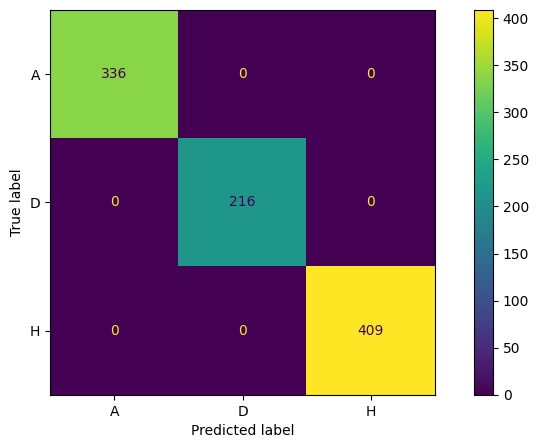

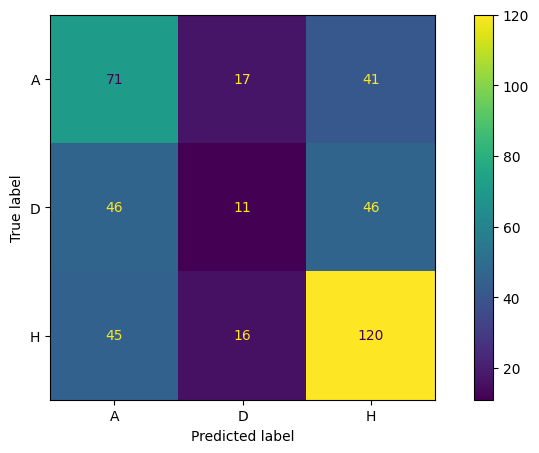

In [129]:
xgb_2nd_iter = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'xgb','secondary')
xgb_2nd_iter.model()

models with unbalanced dataset with secondary feature selection,ac_tr,ac_te,ll_tr,ll_te,profit_test
Decision Tree,1.000000,0.430993,0.000000,20.509101,5408.000000
Random Forest,1.000000,0.491525,0.246940,1.024986,-17433.000000
K Nearest Neighbors,0.622268,0.440678,0.772942,5.825778,-20059.000000
AdaBoost,0.574402,0.513317,1.081570,1.088462,-11068.000000
C-Support Vector,0.552549,0.513317,0.984207,1.030703,-22686.000000
Gradient Boosting,0.815817,0.491525,0.611839,1.043276,-17820.000000
XGB,1.000000,0.489104,0.069421,1.303739,-11599.000000


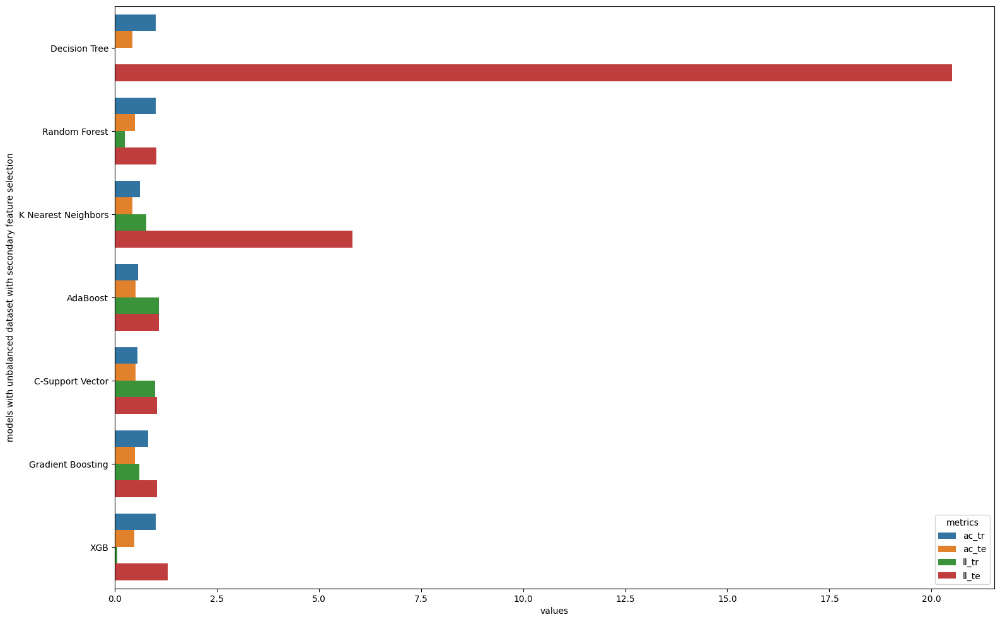

In [130]:
data_visualization([dt_2nd_iter,rf_2nd_iter,knn_2nd_iter,adb_2nd_iter,svc_2nd_iter,gbc_2nd_iter,xgb_2nd_iter],'unbalanced dataset with secondary feature selection')

The final result is similar to the previous model training sessions, where the models which have the highest accuracy of predicting both the away and draw results, generate the highest profit. 

It seems as bookmakers are heavily influenced by the 'Home team always wins' bias. That is, whenever the model or the bookmaker predicts that home will win, either the prediction is wrong and there is a loss or even if the prediction is right, there is a minor gain.

The bias can impact the profit by the fact that, the bookmaker or model would assume that the Home team will win the match, while the Away team won.

# Unbalanced data model training with secondary feature selection using ANN

In [131]:
# input layer.
x_inp = tf.keras.Input(shape=(X_train_sel_feat_2nd_iter.values.shape[1],))

# hidden layer based on number of features.
h_l = tf.keras.layers.Flatten()(x_inp)
# hidden layer. 50 = features * 2.
h_l = tf.keras.layers.Dense(50)(h_l)
# hidden layer. 75 = features * 3.
h_l = tf.keras.layers.Dense(75)(h_l)
# output layer.
h_l = tf.keras.layers.Dense(3)(h_l)
# a parameter used to reduce overfitting. Usually from 20 - 50%.
h_l = tf.keras.layers.Dropout(0.3)(h_l)

# used for multi-classification model.
p = tf.keras.layers.Activation('softmax')(h_l)

# creating the model, and compiling it.
model = tf.keras.models.Model(inputs=x_inp, outputs=p)

# an optimizer for the ANN. Stochastic gradient descent application.
opt = tf.keras.optimizers.Adam(learning_rate=0.0001)
# sparse_categorical_crossentropy: used as a loss function for multi-class classification model where the output label is assigned integer value.
model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

# returns a summary of the ANN training process.
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 25)]              0         
                                                                 
 flatten (Flatten)           (None, 25)                0         
                                                                 
 dense (Dense)               (None, 50)                1300      
                                                                 
 dense_1 (Dense)             (None, 75)                3825      
                                                                 
 dense_2 (Dense)             (None, 3)                 228       
                                                                 
 dropout (Dropout)           (None, 3)                 0         
                                                                 
 activation (Activation)     (None, 3)                 0     

In [132]:
# mini-batch size = 32. Epochs = 100, since with greater number the model will start overfitting.
history = model.fit(X_train_sel_feat_2nd_iter, Y_train_2nd_iter, batch_size=32, epochs=100)

Epoch 1/100
31/31 [==============================] - 1s 2ms/step - loss: 5.9428 - accuracy: 0.3455
Epoch 2/100
31/31 [==============================] - 0s 1ms/step - loss: 2.8497 - accuracy: 0.3684
Epoch 3/100
31/31 [==============================] - 0s 1ms/step - loss: 2.5266 - accuracy: 0.3611
Epoch 4/100
31/31 [==============================] - 0s 1ms/step - loss: 2.0628 - accuracy: 0.3965
Epoch 5/100
31/31 [==============================] - 0s 2ms/step - loss: 1.9612 - accuracy: 0.4204
Epoch 6/100
31/31 [==============================] - 0s 2ms/step - loss: 1.7708 - accuracy: 0.3881
Epoch 7/100
31/31 [==============================] - 0s 2ms/step - loss: 1.5661 - accuracy: 0.4027
Epoch 8/100
31/31 [==============================] - 0s 2ms/step - loss: 1.5189 - accuracy: 0.3996
Epoch 9/100
31/31 [==============================] - 0s 1ms/step - loss: 1.5733 - accuracy: 0.4475
Epoch 10/100
31/31 [==============================] - 0s 2ms/step - loss: 1.3588 - accuracy: 0.4287
Epoch 11/

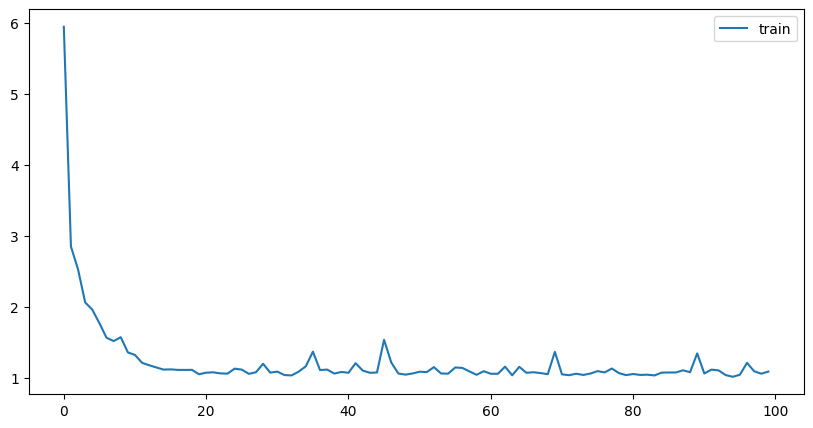

In [133]:
# plotting log loss change with each epoch.
plt.plot(history.history['loss'], label='train')
plt.legend()
plt.show()

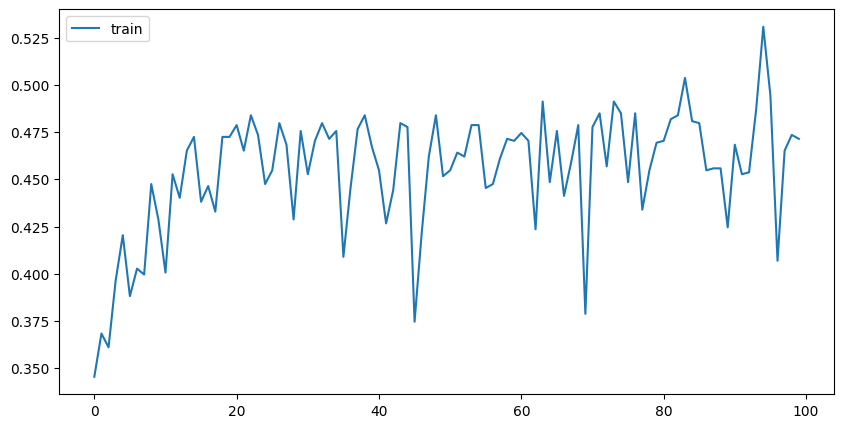

In [134]:
# plotting accuracy change with each epoch.
plt.plot(history.history['accuracy'], label='train')
plt.legend()
plt.show()

In [135]:
# this block of code will return the test accuracy score for the ANN.
predictions = np.argmax(model.predict(X_test_sel_feat_2nd_iter), axis=1)
accuracy = (predictions == Y_test_2nd_iter.values).sum() / Y_test_2nd_iter.values.shape[0]
print("Test set accuracy:", accuracy)

13/13 [==============================] - 0s 2ms/step
Test set accuracy: 0.5157384987893463


In [136]:
print('profit_test:',calculate_profit(X_test_sel_feat_2nd_iter,Y_test_2nd_iter,predictions,'secondary').total_profit.sum())

profit_test: -21121.0


A model based on Artificial Neural Network was used to compare the accuracy and profit results with the standard models, to showcase that Neural Network doesn't always provide good scores. It very much depends on the data used.

Therefore, hyperparameter tuning will be performed on selected traditional models.

Before that, H2O algorithm will be executed to compare results achieved by manual and automatic model training.

# Balanced data model training with secondary feature selection using H2O Algorithm

In [137]:
# creating a new DataFrame for H2O algorithm.
df_new_h2o = pd.concat([X_sel_feat,Y], axis = 1)

In [ ]:
#initializing the algorithm with 6 Gigabytes maximum RAM member size and 3 cores.
h2o.init(max_mem_size = "6G", nthreads=3)

In [ ]:
# Load data into H2O.
df_h2o = h2o.H2OFrame(df_new_h2o)
df_h2o['HomeTeam'] = df_h2o['HomeTeam'].asfactor()
df_h2o['AwayTeam'] = df_h2o['AwayTeam'].asfactor()
df_h2o['FTR'] = df_h2o['FTR'].asfactor()
df_h2o['Quarter'] = df_h2o['Quarter'].asfactor()

Parse progress: |█████████████████████████████████████████████████████████| 100%


In [ ]:
# x = descriptive variables and y = target variable.
y = 'FTR'
x = df_h2o.columns
x.remove(y)

In [ ]:
# train/test split.
train, test = df_h2o.split_frame(ratios=[0.7],seed=1234)

print('X_train shape')
train.shape

print('X_test shape')
test.shape

X_train shape


(971, 26)

X_test shape


(403, 26)

In [ ]:
# initializing the classifier. 
aml = H2OAutoML(max_models = 20, seed = 1234)

# fitting the classifier.
aml.train(x=x, y=y, training_frame=train)

AutoML progress: |████████████████████████████████████████████████████████| 100%


In [ ]:
# this block of code will return all the models that were used for training and all pertaining information, such as log loss.
lb = h2o.automl.get_leaderboard(aml, extra_columns = "ALL")

# display leaderboard.
lb

model_id,mean_per_class_error,logloss,rmse,mse,training_time_ms,predict_time_per_row_ms
GLM_1_AutoML_20230518_184334,0.533084,0.964789,0.606408,0.36773,272,0.001076
XGBoost_3_AutoML_20230518_184334,0.537138,1.08718,0.622943,0.388058,319,0.005545
DeepLearning_grid__1_AutoML_20230518_184334_model_1,0.538425,1.44692,0.638002,0.407047,13012,0.020253
StackedEnsemble_BestOfFamily_AutoML_20230518_184334,0.539451,0.979741,0.608382,0.370128,148,0.038842
DeepLearning_grid__2_AutoML_20230518_184334_model_1,0.541142,1.63392,0.648254,0.420233,18335,0.048954
GBM_5_AutoML_20230518_184334,0.546705,1.01065,0.614456,0.377556,82,0.012684
XGBoost_grid__1_AutoML_20230518_184334_model_1,0.552816,1.04728,0.62009,0.384511,775,0.007044
XGBoost_2_AutoML_20230518_184334,0.553213,1.09262,0.625642,0.391428,462,0.005916
GBM_grid__1_AutoML_20230518_184334_model_2,0.553515,1.11163,0.623159,0.388327,175,0.028474
XRT_1_AutoML_20230518_184334,0.556128,1.32646,0.619562,0.383857,397,0.033579


In [ ]:
# the best model is assigned to best_model.
best_model = aml.leader

best_model

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_1_AutoML_20230518_184334


GLM Model: summary


,,family,link,regularization,lambda_search,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
0,,multinomial,multinomial,Ridge ( lambda = 0.2949 ),"nlambda = 30, lambda.max = 18.312, lambda.min = 0.2949, lambda.1se...",231,228,35,automl_training_py_6_sid_a013




ModelMetricsMultinomialGLM: glm
** Reported on train data. **

MSE: 0.3631307842902792
RMSE: 0.6026033390965231

ModelMetricsMultinomialGLM: glm
** Reported on cross-validation data. **

MSE: 0.3677302557427935
RMSE: 0.6064076646471361

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.5509331,0.0358586,0.5948718,0.52577317,0.57216495,0.5051546,0.556701
1,err,0.44906688,0.0358586,0.4051282,0.4742268,0.42783505,0.49484536,0.44329897
2,err_count,87.2,6.8337398,79.0,92.0,83.0,96.0,86.0
3,logloss,0.9615456,0.029408686,0.9332972,0.98922,0.94093144,0.99710184,0.9471773
4,max_per_class_error,0.9905556,0.012969575,0.975,1.0,0.9777778,1.0,1.0
5,mean_per_class_accuracy,0.47099382,0.030893866,0.50422496,0.46984127,0.48757055,0.4216299,0.4717025
6,mean_per_class_error,0.5290062,0.030893866,0.49577504,0.53015876,0.5124295,0.5783701,0.52829754
7,mse,0.36688584,0.012794634,0.3522761,0.37665638,0.35908175,0.38333347,0.36308146
8,null_deviance,415.8529,2.424577,416.91782,419.61725,413.7677,414.2604,414.70142
9,r2,0.51804036,0.030706717,0.556682,0.4818772,0.52213854,0.49316216,0.53634185



Scoring History: 


,,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test,deviance_xval,deviance_se
0,,2023-05-18 18:43:41,0.000 sec,2,.18E2,231,2.066939,NaN,2.081727,0.005811
1,,2023-05-18 18:43:41,0.015 sec,4,.13E2,231,2.049651,NaN,2.066038,0.006268
2,,2023-05-18 18:43:41,0.031 sec,6,.97E1,231,2.030901,NaN,2.048576,0.006959
3,,2023-05-18 18:43:41,0.046 sec,8,.71E1,231,2.011499,NaN,2.029826,0.007970
4,,2023-05-18 18:43:42,0.063 sec,10,.51E1,231,1.992491,NaN,2.010846,0.009311
5,,2023-05-18 18:43:42,0.078 sec,12,.37E1,231,1.974837,NaN,1.992717,0.010952
6,,2023-05-18 18:43:42,0.094 sec,14,.27E1,231,1.959243,NaN,1.976367,0.012825
7,,2023-05-18 18:43:42,0.118 sec,17,.2E1,231,1.944617,NaN,1.962097,0.014665
8,,2023-05-18 18:43:42,0.134 sec,19,.14E1,231,1.935184,NaN,1.950531,0.017150
9,,2023-05-18 18:43:42,0.149 sec,21,.11E1,231,1.926596,NaN,1.942401,0.019023


glm prediction progress: |████████████████████████████████████████████████| 100%


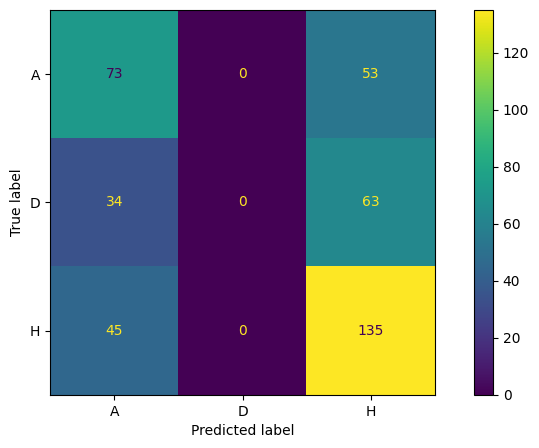

In [ ]:
# best model is used for predicting test data.
preds = best_model.predict(test)

# convert predictions and actual values to numpy arrays.
y_pred = np.array(preds['predict'].as_data_frame())
y_true = np.array(test['FTR'].as_data_frame())

# create confusion matrix.
cm = confusion_matrix(y_true, y_pred)
cm_display = cmd(confusion_matrix = cm, display_labels = ['A', 'D', 'H'])
cm_display.plot()
plt.show()

In [ ]:
# this block of code will return the score diagonally. 
# therefore, it will display the accuracy score of prediction of the correct label.
cm1 = cm.astype('float') / cm.sum(axis=1)[np.newaxis,:]
cm1.diagonal()
np.mean(cm1.diagonal())

array([0.57936508, 0.        , 0.75      ])

0.4431216931216932

In [ ]:
X_test = test.drop('FTR').as_data_frame()
print('profit_test:',calculate_profit(X_test,y_true,y_pred,'secondary').total_profit.sum())

profit_test: -15731.0


The scores and profit_test result returned by H2O is better in comparison to ANN, however, still far from the desired result.

# Hyperparameter Tuning with GridSearch

The selected models are those that were returned by the unbalanced data modeling with secondary feature selection.

6_match_home,VCA,6_match_away,WHA,B365H,BWH,VCH,HomeTeam,IWA,BWA,IWH,WHH,IWD,B365A,AwayTeam,VCD,B365D,WHD,BWD,Quarter,Interwetten_bet,VC Bet_bet,Bet365_bet,William Hill_bet,Bet&Win_bet
0.076827,0.063664,0.062636,0.059879,0.058575,0.058073,0.057152,0.051960,0.050953,0.050946,0.050388,0.045749,0.045462,0.045239,0.040676,0.040241,0.035368,0.032593,0.030261,0.021078,0.005963,0.005054,0.004617,0.003393,0.003252


,ac_tr,ac_te,ll_tr,ll_te,profit_test
Tuned Random Forest,0.711759,0.506053,0.706375,1.002346,-22991.0


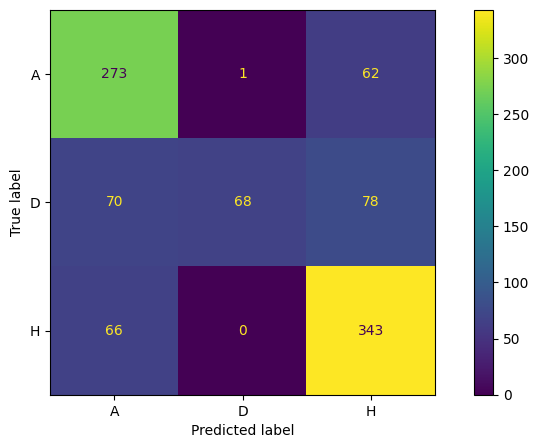

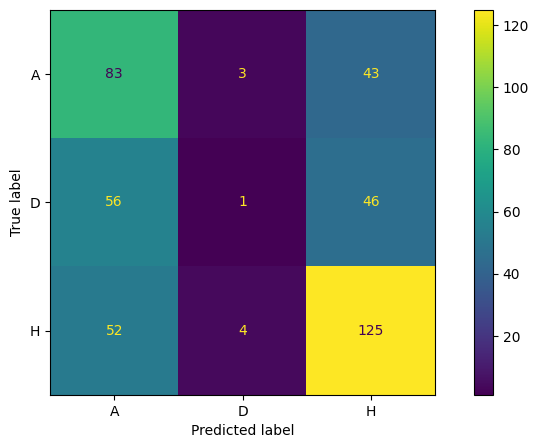

In [ ]:
tuned_rf = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'grd_rf','secondary')
tuned_rf.model()

In [ ]:
tuned_svc = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'grd_svc','secondary')
tuned_svc.model()

In [ ]:
tuned_gbc = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'grd_gbc','secondary')
tuned_gbc.model()

In [ ]:
tuned_xgb = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'grd_xgb','secondary')
tuned_xgb.model()

In [ ]:
tuned_adb = classification_models(X_train_sel_feat_2nd_iter,X_test_sel_feat_2nd_iter,Y_train_2nd_iter,Y_test_2nd_iter,'grd_adb','secondary')
tuned_adb.model()

In [ ]:
data_visualization([dt_2nd_iter,rf_2nd_iter,knn_2nd_iter,adb_2nd_iter,svc_2nd_iter,gbc_2nd_iter,xgb_2nd_iter,
                    tuned_rf,tuned_svc,tuned_gbc,tuned_xgb,tuned_adb],'unbalanced dataset with secondary feature selection and hyperparameter tuning')

Hyperparameter tuning for selected classifiers returned mediocre results in terms of profit. Albeit, Decision Tree wasn't a part of GridSearch tuning. Such tuning will take place with Optuna algorithm and the resulting model will be compared with Decision tree model based on unbalanced data with primary feature selection.

# Hyperparameter Tuning with Optuna

The following functions return a dictionary of the best parameters for the passed classifier, best score and the optimization time.

In [140]:
def optuna_objective(trial, X, y):
    # Optuna objective function for hyperparameter optimization.
    # Define hyperparameter search space.
    params = {'criterion': trial.suggest_categorical('criterion', ['gini','entropy']),
              'max_depth':trial.suggest_int("max_depth", 2, 10),
              'min_samples_leaf':trial.suggest_int("min_samples_leaf", 1, 10)}

    train_x,test_x,train_y,test_y = train_test_split(X,y,test_size = 0.2 , random_state = 42, stratify = y)    
    
    # Create Decision Tree Classifier with current hyperparameters.
    model = dtc(**params, random_state=42)
    model.fit(train_x,train_y)

    return np.mean(cross_val_score(model, test_x, test_y, cv=5, scoring='accuracy'))

def optimize_hyperparameters(X, y, n_trials=10, timeout=3600):
    # Optimize hyperparameters of Decision Tree Classifier model using Optuna.
    # Define Optuna objective function with partial arguments.
    objective = partial(optuna_objective, X=X, y=y)
    
    # Create Optuna study and optimize hyperparameters.
    study = optuna.create_study(direction='maximize', sampler=optuna.samplers.TPESampler(seed=1))
    start_time = time.time()
    study.optimize(objective, n_trials=n_trials, timeout=timeout)
    elapsed_time = time.time() - start_time
    
    # Print best hyperparameters and optimization time.
    best_params = study.best_params
    best_auc = study.best_value
    print(f'Best Hyperparameters: {best_params}')
    print(f'Best accuracy: {best_auc:.4f}')
    print(f'Optimization Time: {elapsed_time:.2f} seconds')

    return study, best_params

In [141]:
# data preparation for analysis.
X_train_dt_opt = pd.DataFrame(data=dt_2nd_iter.X_train_scaled,columns=X_sel_feat.columns)
X_test_dt_opt = pd.DataFrame(data=dt_2nd_iter.X_test_scaled,columns=X_sel_feat.columns)

In [143]:
# turn off logging.
optuna.logging.set_verbosity(optuna.logging.WARNING)

# returns best parameters.
study, best_hyperparams = optimize_hyperparameters(X_train_dt_opt, Y_train, n_trials=50, timeout=3600)

# visualizes the results of the analysis.
optuna.visualization.plot_optimization_history(study)
optuna.visualization.plot_slice(study)
optuna.visualization.plot_parallel_coordinate(study)
optuna.visualization.plot_param_importances(study)

Best Hyperparameters: {'criterion': 'entropy', 'max_depth': 2, 'min_samples_leaf': 1}
Best accuracy: 0.5753
Optimization Time: 1.72 seconds


The returned information indicates which parameter is the most important and what values provide the highest accuracy. The graphs also display the difference in the accuracy value based upon different combination of these parameters.

DecisionTreeClassifier(criterion='entropy', max_depth=2)

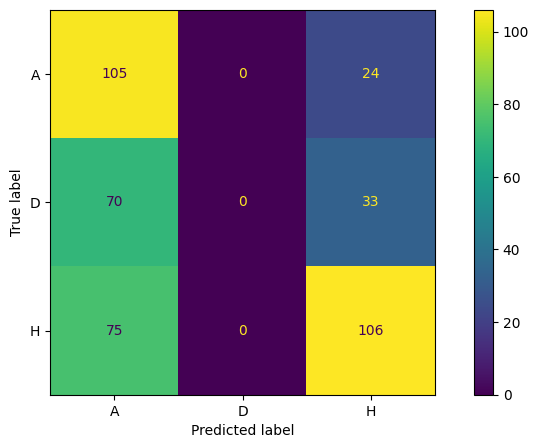

profit: -12114.00$


In [145]:
# initializing classifier with the best parameters and fitting with prepared data.
model = dtc(**best_hyperparams)
model.fit(X_train_dt_opt, Y_train_2nd_iter)

# predicting target variable.
y_pred_test = model.predict(X_test_dt_opt)

# displaying confusion matrix of target variable class distribution.
matrix = confusion_matrix(Y_test_2nd_iter, y_pred_test)
cm_display = cmd(confusion_matrix = matrix, display_labels = ['A', 'D','H'])
cm_display.plot()
plt.show()

# profit computation.
print(f'profit: {calculate_profit(X_test,Y_test,y_pred_test,"secondary").total_profit.sum():.2f}$')

The hyperparametrization has returned one of the best models in terms of accuracy. Nonetheless, the model has generated a loss in terms of profit. 

By analysing the confusion matrix, it can be deduced that the main issue with generating loss in the various models is the lack of accuracy in classifying draw. Therefore, the models classify Home and Away pretty well, but lack the capability to accurately classify draw.

This will be further investigated with descriptive statistics based on the decision tree model with unbalanced data and primary feature selection.

# Models explainability with Dalex

An analysis will be conducted on the Decision Tree classifier with unbalanced data and primary feature selection by treating the multioutput model as multiple singleoutput models with binary classification.

The following block of code will focus on explaining each class through custom binary prediction function. That is treating a multioutput model as multiple singleoutput models.

In [147]:
# preparing data.
model = dtc()
model.fit(X_train_sel_feat,Y_train)

DecisionTreeClassifier()

In [148]:
# custom (binary) predict function.
pf_A = lambda m, d: m.predict_proba(d)[:, 0]
pf_D = lambda m, d: m.predict_proba(d)[:, 1]
pf_H = lambda m, d: m.predict_proba(d)[:, 2]

# custom (binary) target values.
y_A = Y_test == 0
y_D = Y_test == 1
y_H = Y_test == 2

# explainer.
exp_A = dx.Explainer(model,X_test_sel_feat, y_A, predict_function=pf_A, label='Decision Tree Classifier: class A')
exp_D = dx.Explainer(model,X_test_sel_feat, y_D, predict_function=pf_D, label='Decision Tree Classifier: class D')
exp_H = dx.Explainer(model,X_test_sel_feat, y_H, predict_function=pf_H, label='Decision Tree Classifier: class H')

Preparation of a new explainer is initiated

  -> data              : 413 rows 29 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 413 values
  -> model_class       : sklearn.tree._classes.DecisionTreeClassifier (default)
  -> label             : Decision Tree Classifier: class A
  -> predict function  : <function <lambda> at 0x000002950FAC7DC0> will be used
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.363, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.0, mean = -0.0508, max = 1.0
  -> model_info        : package sklearn

A new explainer has been created!
Preparation of a new explainer is initiated

  -> data              : 413 rows 29 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndar

In [149]:
# returns metrics used to explain each model's classification capability with the target variable classes.
exp_A.model_performance()
exp_D.model_performance()
exp_H.model_performance()

,recall,precision,f1,accuracy,auc
Decision Tree Classifier: class A,0.48062,0.413333,0.444444,0.624697,0.585381


,recall,precision,f1,accuracy,auc
Decision Tree Classifier: class D,0.242718,0.240385,0.241546,0.619855,0.49394


,recall,precision,f1,accuracy,auc
Decision Tree Classifier: class H,0.464088,0.528302,0.494118,0.583535,0.570406


It can be noticed that there is a huge difference in the value of f1 and accuracy for the draw class. What this entails is that, the data is very imbalanced towards this class. 

The binary classification approach assigns the values 0 and 1 for the draw class, which represent nonoccurrence of the draw event, while 1 represents the occurrence of a draw event. Since the frequency of draw results is the least in comparison to Home wins and Away wins results, it is quite logical that the accuracy will be high, since the model will be able to better predict the nonoccurrence, rather than the occurrence of such event.

While f1 is a harmonic measure of both recall and precision, where the former focuses on the false negatives and the latter on false positives, these metrics are more suitable for explaining a phenomenon in the data. For example, a false negative event entails that, the result was a draw, but the model has predicted otherwise and the false positive result indicates that the predicted result is a draw, while the actual was a different score.

That's why in most real-life classification problems, the class distribution is usually imbalanced. Therefore, F1-score is a better metric to evaluate a model.

In [150]:
# returns the variable importance.
exp_A.model_parts().plot()

In [151]:
# describes each predictors' value impact on the class prediction;
# it displays how the change of value affects the prediction by returning an accuracy value for each value of the predictor.
exp_A.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 29/29 [00:00<00:00, 76.41it/s]


The greatest fluctuation in the prediction accuracy is impacted by the HomeTeam performance from the last 6 matches. While the highest accuracy value is impacted by the VC Bet HomeTeam & Draw, Pinnacle Draw, Interwetten HomeTeam & Draw and William Hill AwayTeam rating.

In [152]:
exp_D.model_parts().plot()

In [153]:
exp_D.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 29/29 [00:00<00:00, 53.73it/s]


The greatest fluctuation in the prediction accuracy is impacted by the HomeTeam performance from the last 6 matches. While the highest accuracy value is impacted by the Bet&Win HomeTeam and Pinnacle AwayTeam rating.

In [154]:
exp_H.model_parts().plot()

In [155]:
exp_H.model_profile().plot()

Calculating ceteris paribus: 100%|██████████| 29/29 [00:00<00:00, 74.54it/s]


The greatest fluctuation in the prediction accuracy is impacted by the HomeTeam performance from the last 6 matches. While the highest accuracy value is impacted by the HomeTeam performance from last 6 matches, Pinnacle Draw, VC Bet HomeTeam, B365 Draw and William Hill AwayTeam rating.

The results are very interesting, since the variable importance analysis and aggregated profiles demonstrate that the two most important factors for each class in terms of accurately predicting each result, are the HomeTeam performance based on the last 6 matches and the Pinncle bets.

In [156]:
# the following code creates a list of explainers to perform a similar analysis as the previous one, but with all the classes together.

exp_list = []

for i in range(len(np.unique(Y_test))):
    # add i parameter to `predict_function` just to do it in a loop
    pf = lambda m, d, i=i: m.predict_proba(d)[:, i]
    e = dx.Explainer(
        model, X_test_sel_feat, 
        Y_test == i, 
        predict_function=pf,
        label=f'Decision Tree Classifier: class {i}',
        verbose=False
    )
    exp_list += [e]

exp_list

In [157]:
# create multiple explanations
m_profile_list = [e.model_profile() for e in exp_list]

Calculating ceteris paribus: 100%|██████████| 29/29 [00:00<00:00, 46.33it/s]


In [158]:
# plot multiple explanations
m_profile_list[0].plot(m_profile_list[1:])

In [159]:
m_parts_list = [e.model_parts() for e in exp_list]
m_parts_list[0].plot(m_parts_list[1:])

From the analysis of each class together, it can be deduced that the greatest fluctuation of the prediction accuracy is impacted by the HomeTeam performance from last 6 matches, while the most important variables depend on what has to be guessed. 

For HomeTeam and AwayTeam win, the Pinncle Draw rating is the most important, while for the Draw result, the Bet&Win HomeTeam win rating has the prominent effect.

In [160]:
# explains predictions
observation = X_test_sel_feat.iloc[[0]]

p_parts_list = [e.predict_parts(observation) for e in exp_list]
p_parts_list[0].plot(p_parts_list[1:], min_max=[-0.1, 1.1])

In case of contribution, the aforementioned theory holds in terms of HomeTeam performance from last 6 matches and Pinncle Draw rating. Moreover, there are two additional factors that contribute, notably AwayTeam performance from last 6 matches and Interwetten Draw rating. 

Nevertheless, since predicting AwayTeam and Draw result is more important than HomeTeam, it can be assumed that Bet&Win rating, HomeTeam and AwayTeam performance from last 6 matches are key predictors.

In [161]:
p_profile_list = [e.predict_profile(observation) for e in exp_list]
p_profile_list[0].plot(p_profile_list[1:])

Calculating ceteris paribus: 100%|██████████| 29/29 [00:00<00:00, 397.47it/s]


In conclusion, Pinncle and Bet&Win rating are the most important external factors, by external as not engineered features, that impact the prediction capacity of the model.

# Descriptive statistics of Decision Tree model with unbalanced data and primary feature selection

In [162]:
X_train_mod, X_test_mod = dt.X_train_scaled, dt.X_test_scaled
model = dtc(random_state=1)

model.fit(X_train_mod,Y_train)
y_pred_test = model.predict(X_test_mod)

DecisionTreeClassifier(random_state=1)

In [163]:
sample_df = calculate_profit(X_test_sel_feat,Y_test,y_pred_test,'primary')

<Axes: >

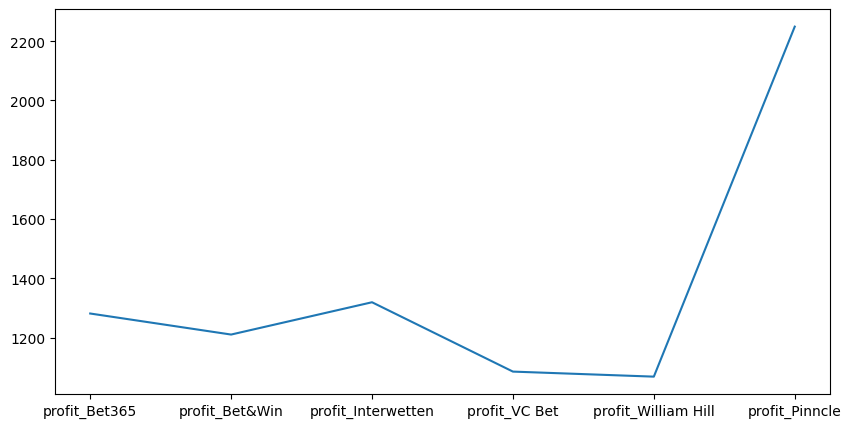

In [164]:
rolling_profit  = sample_df[['profit_Bet365','profit_Bet&Win','profit_Interwetten','profit_VC Bet','profit_William Hill','profit_Pinncle']].sum()
rolling_profit.plot()
plt.show()

In [165]:
idx = np.where((sample_df['FTR']==1) & (sample_df['model_pred']==1))
draw_result_sum = sample_df.iloc[idx].total_profit.sum()
draw_result_count = sample_df.iloc[idx].total_profit.count()
draw_result_mean = sample_df.iloc[idx].total_profit.mean()
pd.DataFrame(data=[[int(draw_result_sum),draw_result_count,f'{draw_result_mean:.2f}']],columns=['Draw sum','Draw count','Draw mean'])

,Draw sum,Draw count,Draw mean
0,56636,34,1665.76


In [166]:
idx = np.where((sample_df['FTR']==0) & (sample_df['model_pred']==0))
AwayTeam_result_sum = sample_df.iloc[idx].total_profit.sum()
AwayTeam_result_count = sample_df.iloc[idx].total_profit.count()
AwayTeam_result_mean = sample_df.iloc[idx].total_profit.mean()
pd.DataFrame(data=[[int(AwayTeam_result_sum),AwayTeam_result_count,f'{AwayTeam_result_mean:.2f}']],columns=['AwayTeam sum','AwayTeam count','AwayTeam mean'])

,AwayTeam sum,AwayTeam count,AwayTeam mean
0,37325,51,731.86


In [167]:
idx = np.where((sample_df['FTR']==2) & (sample_df['model_pred']==2))
HomeTeam_result_sum = sample_df.iloc[idx].total_profit.sum()
HomeTeam_result_count = sample_df.iloc[idx].total_profit.count()
HomeTeam_result_mean = sample_df.iloc[idx].total_profit.mean()
pd.DataFrame(data=[[int(HomeTeam_result_sum),HomeTeam_result_count,f'{HomeTeam_result_mean:.2f}']],columns=['HomeTeam sum','HomeTeam count','HomeTeam mean'])

,HomeTeam sum,HomeTeam count,HomeTeam mean
0,53451,96,556.78


In [168]:
idx = np.where(sample_df['total_profit']>0)
profit_sum = sample_df.iloc[idx].total_profit.sum()
profit_count = sample_df.iloc[idx].total_profit.count()
profit_mean = sample_df.iloc[idx].total_profit.mean()
pd.DataFrame(data=[[int(profit_sum),profit_count,f'{profit_mean:.2f}']],columns=['All bets sum','All bets count','All bets mean'])

,All bets sum,All bets count,All bets mean
0,147412,181,814.43


In [169]:
Draw_profit_difference_sum = (draw_result_sum / profit_sum) * 100
Draw_profit_difference_count = (draw_result_count / profit_count) * 100
Draw_profit_difference_mean = (draw_result_mean / profit_mean)
pd.DataFrame(data=[[f'{Draw_profit_difference_sum:.2f}%',f'{Draw_profit_difference_count:.2f}%',f'{np.round(Draw_profit_difference_mean):.0f}X']],columns=['Draw_All bets_sum difference','Draw_All bets_count difference','Draw_All bets_mean difference'])

,Draw_All bets_sum difference,Draw_All bets_count difference,Draw_All bets_mean difference
0,38.42%,18.78%,2X


From the descriptive analysis it can be deduced that the highest profit was gained against pinncle bet. Moreover, Draw provides the highest profit, since it represents 38.42% of All bet profits, whereas representing only 20% of matches. Lastly, the average profit per match is 2 times greater than the average All bet profit.